# Insights into personalised risk stratification for pacing-induced cardiomyopathy using multivariate time series data from pacemakers.

# Table of Contents:
1. [1.0.0.0: Setup](#1.0.0.0:-Setup)
    1. [1.1.0.0: Library imports](#1.1.0.0:-Library-imports)
        1. [1.1.1.0: Library imports](#1.1.1.0:-Library-imports)
        1. [1.1.2.0: Library import configurations](#1.1.2.0:-Library-import-configurations)
    1. [1.2.0.0: Constants](#1.2.0.0:-Constants)
    1. [1.3.0.0: Utility functions](#1.3.0.0:-Utility-functions)
        1. [1.3.1.0: Custom transformer classes](#1.3.1.0:-Custom-transformer-classes)
        1. [1.3.2.0: Custom KNN pipeline ensemble](#1.3.2.0:-Custom-KNN-pipeline-ensemble)
        1. [1.3.3.0: Naive random assignment](#1.3.3.0:-Naive-random-assignment)
        1. [1.3.4.0: General helper functions](#1.3.4.0:-General-helper-functions)
1. [2.0.0.0: Data pre-processing](#2.0.0.0:-Data-pre-processing)
    1. [2.1.0.0: Reading in the data](#2.1.0.0:-Reading-in-the-data)
        1. [2.1.1.0: Reading in the data](#2.1.1.0:-Reading-in-the-data)
        1. [2.1.2.0: Data validation](#2.1.2.0:-Data-validation)
    1. [2.2.0.0: Removing columns and spreadsheets](#2.2.0.0:-Removing-columns-and-spreadsheets)
        1. [2.2.1.0: Removing irrelevant columns](#2.2.1.0:-Removing-irrelevant-columns)
        1. [2.2.2.0: Removing non-common columns and spreadsheets lacking critical columns](#2.2.2.0:-Removing-non-common-columns-and-spreadsheets-lacking-critical-columns)
            1. [2.2.2.1: Identifying non-common columns and spreadsheets lacking critical columns](#2.2.2.1:-Identifying-non-common-columns-and-spreadsheets-lacking-critical-columns)
            1. [2.2.2.2: Removing DataFrames missing important columns](#2.2.2.2:-Removing-DataFrames-missing-important-columns)
            1. [2.2.2.3: Removing non-common columns and reordering columns](#2.2.2.3:-Removing-non-common-columns-and-reordering-columns)
        1. [2.2.3.0: Removing columns of low variance](#2.2.3.0:-Removing-columns-of-low-variance)
    1. [2.3.0.0: Translating missing values](#2.3.0.0:-Translating-missing-values)
    1. [2.4.0.0: Creating an index](#2.4.0.0:-Creating-an-index)
    1. [2.5.0.0: Removing patients and columns with too much missing data](#2.5.0.0:-Removing-patients-and-columns-with-too-much-missing-data)
        1. [2.5.1.0: Assessing the amount of missing data](#2.5.1.0:-Assessing-the-amount-of-missing-data)
            1. [2.5.1.1: Assessing columns of over 98% missing data](#2.5.1.1:-Assessing-columns-of-over-98%-missing-data)
            1. [2.5.1.2: Assessing columns of over 40% missing data](#2.5.1.2:-Assessing-columns-of-over-40%-missing-data)
        1. [2.5.2.0: Removing DataFrames containing too much missing data](#2.5.2.0:-Removing-DataFrames-containing-too-much-missing-data)
            1. [2.5.2.1: Removing DataFrames](#2.5.2.1:-Removing-DataFrames)
            1. [2.5.2.2: Reassessing columns of over 40% missing data](#2.5.2.2:-Reassessing-columns-of-over-40%-missing-data)
            1. [2.5.2.3: Further removal of DataFrames containing too much missing data](#2.5.2.3:-Further-removal-of-DataFrames-containing-too-much-missing-data)
        1. [2.5.3.0: Removing columns containing too much missing data](#2.5.3.0:-Removing-columns-containing-too-much-missing-data)
    1. [2.6.0.0: Data type conversion](#2.6.0.0:-Data-type-conversion)
        1. [2.6.1.0: Identifying columns requiring conversion](#2.6.1.0:-Identifying-columns-requiring-conversion)
        1. [2.6.2.0: Converting int columns into floats](#2.6.2.0:-Converting-int-columns-into-floats)
        1. [2.6.3.0: Converting object columns into floats](#2.6.3.0:-Converting-object-columns-into-floats)
            1. [2.6.3.1: Identifying columns requiring conversion](#2.6.3.1:-Identifying-columns-requiring-conversion)
            1. [2.6.3.2: Recreating a master DataFrame](#2.6.3.2:-Recreating-a-master-DataFrame)
            1. [2.6.3.3: Atrial sensitivity [mV]](#2.6.3.3:-Atrial-sensitivity-[mV])
            1. [2.6.3.4: Duration of longest high ven. rate episode per day](#2.6.3.4:-Duration-of-longest-high-ven.-rate-episode-per-day)
            1. [2.6.3.5: Mean PVC/h](#2.6.3.5:-Mean-PVC/h)
            1. [2.6.3.6: New long atrial episode detected (ongoing at end of mon. interv.)](#2.6.3.6:-New-long-atrial-episode-detected-(ongoing-at-end-of-mon.-interv.))
            1. [2.6.3.7: RA pulse amplitude [V]](#2.6.3.7:-RA-pulse-amplitude-[V])
            1. [2.6.3.8: RV pacing threshold (capture control) [V]](#2.6.3.8:-RV-pacing-threshold-(capture-control)-[V])
            1. [2.6.3.9: RV pulse amplitude [V]](#2.6.3.9:-RV-pulse-amplitude-[V])
        1. [2.6.4.0: Final validation](#2.6.4.0:-Final-validation)
    1. [2.7.0.0: Data visualisation and exploration before data imputation](#2.7.0.0:-Data-visualisation-and-exploration-before-data-imputation)
        1. [2.7.1.0: Defining relevant columns](#2.7.1.0:-Defining-relevant-columns)
        1. [2.7.2.0: Temporary time series padding](#2.7.2.0:-Temporary-time-series-padding)
        1. [2.7.3.0: Producing master DataFrames](#2.7.3.0:-Producing-master-DataFrames)
        1. [2.7.4.0: Collecting statistics from the data set](#2.7.4.0:-Collecting-statistics-from-the-data-set)
            1. [2.7.4.1: Controls](#2.7.4.1:-Controls)
            1. [2.7.4.2: Cases](#2.7.4.2:-Cases)
        1. [2.7.5.0: Creation of correlation matrix](#2.7.5.0:-Creation-of-correlation-matrix)
        1. [2.7.6.0: Visualisation of two cases and controls](#2.7.5.0:-Visualisation-of-two-cases-and-controls)
            1. [2.7.6.1: All relevant columns](#2.7.5.1:-All-relevant-columns)
            1. [2.7.6.2: Only "Mean ven. heart rate [bpm]"](#2.7.5.2:-Only-"Mean-ven.-heart-rate-[bpm]")
    1. [2.8.0.0: Data imputation](#2.8.0.0:-Data-imputation)
    1. [2.9.0.0: Time series padding](#2.9.0.0:-Time-series-padding)
    1. [2.10.0.0: Converting to values](#2.10.0.0:-Converting-to-values)
1. [3.0.0.0: Machine learning](#3.0.0.0:-Machine-learning)
    1. [3.1.0.0: Initial setup](#3.1.0.0:-Initial-setup)
        1. [3.1.1.0: Preparing x and y](#3.1.1.0:-Preparing-x-and-y)
        1. [3.1.2.0: Initialisation of ML objects and results dictionary](#3.1.2.0:-Initialisation-of-ML-objects-and-results-dictionary)
    1. [3.2.0.0: Feature selection with XGBoost's RF and TSFresh transform ](#3.2.0.0:-Feature-selection-with-XGBoost's-RF-and-TSFresh-transform)
        1. [3.2.1.0: Pipeline experimentation](#3.2.1.0:-Pipeline-experimentation)
            1. [3.2.1.1: Setup](#3.2.1.1:-Setup)
            1. [3.2.1.2: Without scaling nor resampling](#3.2.1.2:-Without-scaling-nor-resampling)
            1. [3.2.1.3: With scaling, no resampling](#3.2.1.3:-With-scaling,-no-resampling)
            1. [3.2.1.4: With both scaling and resampling](#3.2.1.4:-With-both-scaling-and-resampling)
        1. [3.2.2.0: Forward feature selection](#3.2.2.0:-Forward-feature-selection)
            1. [3.2.2.1: Setup](#3.2.2.1:-Setup)
            1. [3.2.2.2: Forward feature selection](#3.2.2.2:-Forward-feature-selection)
        1. [3.2.3.0: Updating x](#3.2.3.0:-Updating-x)
        1. [3.2.4.0: Manual validation of result](#3.2.4.0:-Manual-validation-of-result)
    1. [3.3.0.0: Trialling other models with selected feature](#3.3.0.0:-Trialling-other-models-with-selected-feature)
        1. [3.3.1.0: Random assignment](#3.3.1.0:-Random-assignment)
        1. [3.3.2.0: Rocket classifier](#3.3.2.0:-Rocket-classifier)
            1. [3.3.2.1: Pipeline experimentation](#3.3.2.1:-Pipeline-experimentation)
            1. [3.3.2.2: Cross-validation](#3.3.2.2:-Cross-validation)
        1. [3.3.3.0: DrCIF](#3.3.3.0:-DrCIF)
        1. [3.3.4.0: HIVE-COTE 2.0 (HC2)](#3.3.4.0:-HIVE-COTE-2.0-(HC2))
        1. [3.3.5.0: Canonical Time-series Characteristics (catch22) transform with Random Forest Classifier](#3.3.5.0:-Canonical-Time-series-Characteristics-(catch22)-transform-with-Random-Forest-Classifier)
        1. [3.3.6.0: KNN with dynamic time warping](#3.3.6.0:-KNN-with-dynamic-time-warping)
            1. [3.3.6.1: Pipeline experimentation](#3.3.6.1:-Pipeline-experimentation)
            1. [3.3.6.2: Cross-validation](#3.3.6.2:-Cross-validation)
        1. [3.3.7.0: XGBoost's gradient boosting with TSFresh](#3.3.7.0:-XGBoost's-gradient-boosting-with-TSFresh)
        1. [3.3.8.0: XGBoost's Random Forest with TSFresh](#3.3.8.0:-XGBoost's-Random-Forest-with-TSFresh)
        1. [3.3.9.0: View results and save to .txt file](#3.3.9.0:-View-results-and-save-to-.txt-file)
    1. [3.4.0.0: Hyperparameter optimisation of the best models](#3.4.0.0:-Hyperparameter-optimisation-of-the-best-models)
        1. [3.4.1.0: KNN](#3.4.1.0:-KNN)
            1. [3.4.1.1: Average of 10 seeds](#3.4.1.1:-Average-of-10-seeds)
        1. [3.4.2.0: XGBoost RF and TSFresh transform](#3.4.2.0:-XGBoost-RF-and-TSFresh-transform)
            1. [3.4.2.1: Average of 10 seeds](#3.4.2.1:-Average-of-10-seeds)
    1. [3.5.0.0: Writing results to a .xlsx file](#3.5.0.0:-Writing-results-to-a-.xlsx-file)
    1. [3.6.0.0: Graphing SHAP values and feature importances from TSFresh with XGBoost's RF](#3.6.0.0:-Graphing-SHAP-values-and-feature-importances-from-TSFresh-with-XGBoost's-RF)
        1. [3.6.1.0: Setup and training](#3.6.1.0:-Setup-and-training)
        1. [3.6.2.0: Plotting graphs](#3.6.2.0:-Plotting-graphs)
1. [4.0.0.0: Post-analysis graphing](#4.0.0.0:-Post-analysis-graphing)
    1. [4.1.0.0: Setup](#4.1.0.0:-Setup)
    1. [4.2.0.0: Graphing the daily mean ventricular heart rate](#4.2.0.0:-Graphing-the-daily-mean-ventricular-heart-rate)
        1. [4.2.1.0: Obtaining the median and quartile values for the controls](#4.2.1.0:-Obtaining-the-median-and-quartile-values-for-the-controls)
        1. [4.2.2.0: Obtaining the median and quartile values for the cases](#4.2.2.0:-Obtaining-the-median-and-quartile-values-for-the-cases)
        1. [4.2.3.0: Producing the graph](#4.2.3.0:-Producing-the-graph)
    1. [4.3.0.0: Graphing the daily mean atrial and ventricular heart rate](#4.3.0.0:-Graphing-the-daily-mean-atrial-and-ventricular-heart-rate)
        1. [4.3.1.0: Obtaining the median and quartile values](#4.3.1.0:-Obtaining-the-median-and-quartile-values)
        1. [4.3.2.0: Producing the graph](#4.3.2.0:-Producing-the-graph)
    1. [4.4.0.0: Validation of pacing percentages](#4.4.0.0:-Validation-of-pacing-percentages)
        1. [4.4.1.0: Reading in the data](#4.4.1.0:-Reading-in-the-data)
        1. [4.4.2.0: Creating index](#4.4.2.0:-Creating-index)
        1. [4.4.3.0: Patient exclusion](#4.4.3.0:-Patient-exclusion)
        1. [4.4.4.0: Time series padding](#4.4.4.0:-Time-series-padding)
        1. [4.4.5.0: Getting p-values](#4.4.5.0:-Getting-p-values)
            1. [4.4.5.1: Getting statistics](#4.4.5.1:-Getting-statistics)
            1. [4.4.5.2: Creating tables](#4.4.5.2:-Creating-tables)

# 1.0.0.0: Setup

## 1.1.0.0: Library imports

### 1.1.1.0: Library imports

In [1]:
# Basic imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import os
import json
import joblib

# imblearn
from imblearn.combine import SMOTEENN
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import EditedNearestNeighbours
from imblearn.pipeline import Pipeline

# sklearn imports
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.metrics import roc_auc_score
from sklearn.base import BaseEstimator, TransformerMixin, ClassifierMixin, clone
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import StratifiedKFold
from sktime.classification.distance_based import KNeighborsTimeSeriesClassifier

# sktime imports
from sktime.classification.feature_based import Catch22Classifier
from sktime.classification.interval_based import DrCIF
from sktime.classification.kernel_based import RocketClassifier
from sktime.transformations.panel.tsfresh import TSFreshFeatureExtractor

# XGBoost
import xgboost as xgb
# Optuna
import optuna
import optuna.visualization as ov
# Shap
import shap
# Seaborn
import seaborn as sns
# scipy
from scipy import stats

# Redundant imports for KNN ensemble
#import scipy.special
#from collections import defaultdict

### 1.1.2.0: Library import configurations

In [2]:
# Pandas options
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Matplotlib
%matplotlib inline
# Set the style
plt.style.use('fivethirtyeight')

## 1.2.0.0: Constants

In [3]:
# Define pathways
cases_path = './RAW_DATA/Cases/'
controls_path = './RAW_DATA/Controls/'

# General constants
SEED = 5

## 1.3.0.0: Utility functions/classes

### 1.3.1.0: Custom transformer classes

In [4]:
class FlattenTS_scale(BaseEstimator, TransformerMixin):
    """
    Transformer for conversion of sktime format to tabular 
    format for scaling.
    """
    def __init__(self):
        pass
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        X_dict = {}
        for col in range(0, len(X.values[0])):
            values = []
            for patient in range(0, len(X.values)):
                values.append(X.values[patient][col])
            flattened_list = [item for sublist in values for item in sublist]
            X_dict[X.columns[col]] = flattened_list

        X_transformed = pd.DataFrame(X_dict)

        return X_transformed

In [5]:
class ScaledToTSDF(BaseEstimator, TransformerMixin):
    """
    Transformer for conversion of tabular format for
    scaling to sktime format.
    """
    def __init__(self, columns_to_use):
        self.columns_to_use = columns_to_use
    
    def fit(self, X, y):
        self.jump = int(len(X)/len(y))
        return self
    
    def transform(self, X): 
        X_transformed = pd.DataFrame()       
        len_y = int(len(X)/self.jump)
        
        X = [item for sublist in X for item in sublist]
        
        for row in range(0, len_y):
            # Create a new row as a dictionary
            new_row = {}
            # Find column values for each feature
            for col_name in self.columns_to_use:
                new_row[col_name] = [X[(self.jump * row):(self.jump * (row+1))]]
            # Create a new df from the dictionary
            new_row = pd.DataFrame(new_row)
            # Concatenate the original DataFrame with the new row
            X_transformed = pd.concat([X_transformed, new_row], ignore_index=True)
        
        # Apply the function to each cell of the DataFrame
        X_transformed = X_transformed.applymap(array_to_series)
        
        return X_transformed

In [6]:
class FlattenTS_res(BaseEstimator, TransformerMixin):
    """
    Transformer for conversion of sktime format to tabular 
    format for resampling.
    """
    def __init__(self):
        pass
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        X_dict = {}
        for patient in range(0, len(X.values)):
            values = []
            for col in range(0, len(X.values[0])):
                values.append(X.values[patient][col])
            flattened_list = [item for sublist in values for item in sublist]
            X_dict[patient] = flattened_list

        X_transformed = pd.DataFrame(X_dict)
        return X_transformed.T

In [7]:
class SMOTEENNToTSDF(BaseEstimator, TransformerMixin):
    """
    Transformer for conversion of tabular format for
    resampling to sktime format.
    """
    def __init__(self, columns_to_use):
        self.columns_to_use = columns_to_use
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X): 
        X_transformed = pd.DataFrame()
        len_ts = int(len(X.columns)/len(self.columns_to_use))
        
        for row in range(0, len(X)):
            # Create a new row as a dictionary
            new_row = {}
            # Find column values for each feature
            for index, col_name in enumerate(self.columns_to_use):
                new_row[col_name] = [X.iloc[row, (len_ts * index):(len_ts * (index+1))].values]
            # Create a new df from the dictionary
            new_row = pd.DataFrame(new_row)
            # Concatenate the original DataFrame with the new row
            X_transformed = pd.concat([X_transformed, new_row], ignore_index=True)
        
        # Apply the function to each cell of the DataFrame
        X_transformed = X_transformed.applymap(array_to_series)
        
        return X_transformed

In [8]:
class XGBRF_transformer(BaseEstimator, TransformerMixin):
    """
    Transformer that replaces invalid string characters in column names 
    after a TSFresh transform to make compatible with XGBoost.
    """
    def __init__(self):
        pass
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        names = X.columns.to_list()
        clean_names = [n.replace('[', '').replace(']', '').replace('<', '').replace('>', '').replace(',', '').replace('"', '') for n in names]
        change = dict(zip(names, clean_names))
        X.rename(columns=change, inplace=True)

        return X

### 1.3.2.0: Custom KNN pipeline ensemble

In [9]:
# Redundant code

class WeightedKNNPipelineEnsemble(BaseEstimator, ClassifierMixin):
    def __init__(self, pipeline, stratified_kfold, sigmoid_steepness=10):
        self.pipeline = pipeline
        self.stratified_kfold = stratified_kfold
        self.sigmoid_steepness = sigmoid_steepness
        self.pipeline_models = defaultdict(self._create_pipeline_model)
        self.model_weights = None
        
    def _create_pipeline_model(self):
        return clone(self.pipeline)
    
    def fit(self, X, y):
        self.classes_ = np.unique(y)
        self.model_weights = np.zeros(len(X.columns))

        for i, col in enumerate(X.columns):
            feature = X[[col]]
            model = self.pipeline_models[col]

            # Use k-fold cross-validation to get the roc auc of the model
            roc_scores = cross_val_score(model, feature, y, cv=self.stratified_kfold, scoring='roc_auc')
            roc = np.mean(roc_scores)
            
            # Logistic sigmoid transform the roc auc to make more accurate models weighted more heavily
            # -0.5 as 0.5 auc roc is random
            transformed_roc = scipy.special.expit((roc - 0.5) * self.sigmoid_steepness)
            
            self.model_weights[i] = transformed_roc

            # Fit the model on the entire training data
            model.fit(feature, y)

        # Normalize the weights to sum to 1
        self.model_weights /= np.sum(self.model_weights)

        return self

    def predict(self, X):
        
        proba = self.predict_proba(X)
        weighted_classification = []
        
        for probability in proba[:, 1]:
            if probability>=0.5:
                weighted_classification.append(1)
            else:
                weighted_classification.append(0)

        y_pred = np.array(weighted_classification).astype('<U1')

        return y_pred

    def predict_proba(self, X):
        ensemble_proba = {}

        for col in X.columns:
            feature = X[[col]]
            ensemble_proba[col] = self.pipeline_models[col].predict_proba(feature)

        proba = np.zeros((X.shape[0], len(self.classes_)))

        for i, col in enumerate(X.columns):
            proba += ensemble_proba[col] * self.model_weights[i]

        return proba

    def decision_function(self, X):
        # Assuming binary classification ('0' and '1')
        proba = self.predict_proba(X)  # Get class probabilities
        return proba[:, 1]  # Return probabilities of the positive class ('1')

In [10]:
# Redundant code

class MajorityKNNEnsemble(BaseEstimator, ClassifierMixin):
    def __init__(self, knn_study):
        self.knn_study = knn_study
        self.knn_models = defaultdict(lambda: KNeighborsTimeSeriesClassifier(
            n_neighbors=knn_study.best_params['classifier__n_neighbors'],
            distance=knn_study.best_params['classifier__distance'],
            weights=knn_study.best_params['classifier__weights'],
            n_jobs=-1
        ))

    def fit(self, X, y):
        self.classes_ = np.unique(y)
        for col in X.columns:
            feature = X[[col]]
            self.knn_models[col].fit(feature, y)
        return self

    def predict(self, X):
        predictions = np.zeros((X.shape[0], len(self.knn_models)), dtype=int)

        for i, col in enumerate(X.columns):
            feature = X[[col]]
            pred = self.knn_models[col].predict(feature)
            predictions[:, i] = pred

        # Use majority voting for classification along rows
        majority_classification = []
        for row_pred in predictions:
            unique_classifications, counts = np.unique(row_pred, return_counts=True)
            most_common_index = np.argmax(counts)
            majority_classification.append(unique_classifications[most_common_index])
            
        y_pred = np.array(majority_classification).astype('<U1')
        
        return y_pred
    
    def predict_proba(self, X):
        ensemble_proba = {}
        
        for col in X.columns:
            feature = X[[col]]
            ensemble_proba[col] = self.knn_models[col].predict_proba(feature)
        
        proba = np.mean([ensemble_proba[col] for col in ensemble_proba], axis=0)
        
        return proba
    
    def decision_function(self, X):
        # Assuming binary classification ('0' and '1')
        proba = self.predict_proba(X)  # Get class probabilities
        return proba[:, 1]  # Return probabilities of the positive class ('1')

### 1.3.3.0: Naive random assignment

In [11]:
class NaiveRandom(BaseEstimator, ClassifierMixin):
    """
    A simple binary classifier class that learns the ratio between cases 
    and controls in the training data and then uses that ratio to 
    predict the testing data at random.
    """
    def __init__(self, seed=5):
        self.seed = seed

    def fit(self, X, y):
        self.classes_ = np.unique(y)
        
        # Calculate the percentage of values equal to 0 in the outcome column
        picm_count = np.count_nonzero(y == 0)
        total_count = len(y)
        self.picm_ratio = (picm_count / total_count)
        
        return self

    def predict(self, X):
        # Initialise list for classifications
        classification = []
        # Get probability of positive classification
        positive_proba = self.decision_function(X)
        
        for probability in positive_proba:
            if probability >= 0.5:
                classification.append(1)
            else:
                classification.append(0)

        y_pred = np.array(classification)

        return y_pred
    
    def rand_class(self, n_samples): 
       # Set random seed
        random.seed(self.seed)
        # Seed NumPy random number generator
        np.random.seed(self.seed)  
        # Get classifications
        rand_nums = np.random.random(n_samples)  # Generate random numbers between 0 and 1
        
        return np.where(rand_nums <= self.picm_ratio, 0, 1)
    
    def predict_proba(self, X):
        n_samples = X.shape[0]
        # Get random predictions
        y_pred = self.rand_class(n_samples)
        # Convert predictions into probabilities
        proba = [[1-self.picm_ratio, self.picm_ratio] if val == 1 else [self.picm_ratio, 1-self.picm_ratio] for val in y_pred]
        # Convert list of probabilities into a numpy array
        proba = np.array(proba)
        
        return proba
    
    def decision_function(self, X):
        # Assuming binary classification ('0' and '1')
        proba = self.predict_proba(X)  # Get class probabilities
        return proba[:, 1]  # Return probabilities of the positive class ('1')

### 1.3.4.0: General helper functions

In [12]:
def array_to_series(arr):
    """
    A function to convert numpy arrays to pandas Series
    """
    return pd.Series(arr)

In [13]:
def easy_plot(df, columns_list, control=True, path=None):
    """
    Helper function to plot multivariate time series graphs.
    """
    # Create figure
    fig_length = 5 * len(columns_list)
    fig, axes = plt.subplots(nrows=len(columns_list), ncols=1, figsize=(14, fig_length))
    
    # Define a list of colours, blue/green for controls and red/orange for cases
    # Also, label graphs as case or control
    if control:
        shades_of_colour = ['royalblue', 'midnightblue', 'darkgreen']
        plt.suptitle("Control", x=0.1, fontsize=46, fontweight='extra bold', color='darkblue')
    else:
        shades_of_colour = ['lightcoral', 'darkred', 'darkorange']
        plt.suptitle("Case", x=0.1, fontsize=46, fontweight='extra bold', color='darkred')
    
    
    for i, column in enumerate(columns_list):
        # Plot default values
        axes[i].plot(df[column].index, df[column].values, label=column, linestyle='-.', linewidth=1.5, color=shades_of_colour[0])
        
        # Calculate rolling averages
        rolling_7day = df[column].rolling(window=7, min_periods=1).mean()
        rolling_28day = df[column].rolling(window=28, min_periods=1).mean()
        
        # Plot rolling averages with darker shades
        axes[i].plot(df[column].index, rolling_7day, label='7-day rolling averages', linestyle='-', linewidth=2, color=shades_of_colour[1])
        axes[i].plot(df[column].index, rolling_28day, label='28-day rolling averages', linestyle='--', linewidth=2, color=shades_of_colour[2])
        
        axes[i].set_ylabel(column)
        axes[i].set_xlabel("Day")
        axes[i].set_title(column)
        axes[i].legend(loc='best')
    
    # Adjust layout and display the plot
    plt.tight_layout()
    # Save the plot to the specified file path if provided
    if path:
        plt.savefig(path, bbox_inches = 'tight')
    plt.show()

# 2.0.0.0: Data pre-processing

## 2.1.0.0: Reading in the data

### 2.1.1.0: Reading in the data

Here we will read in our pacemaker data. As I have multiple spreadsheets to read in as pandas DataFrames, I will store the pandas DataFrames in lists. Furthermore, to ensure I am aware at all times which spreadsheets correspond to my cases and which to my controls, I will create two separate lists - one for the cases and one for the controls. Lastly, to make things easier, I will store these two lists in another list such that the zeroth index of this list will be a list of the control data frames and the first index of this list will be a list of the case data frames.

In [14]:
# Create a list to store pacemaker data. 
pace_data = []

In [15]:
# Read in controls
list_of_df = [] # temp list

# Controls
for id_num in range(14, 65):
        # Get file path
        file_path = controls_path + str(id_num) + '.csv'
        # Read in patient timeseries as a pandas DataFrame
        temp_df = pd.read_csv(file_path, header=0)
        # Append DataFrame to list
        list_of_df.append(temp_df)
        
# Append list of DataFrames to pace_data list
pace_data.append(list_of_df)

In [16]:
# Read in cases
list_of_df = [] # temp list
        
# Cases
for id_num in range(1,14):
    # Get file path
    file_path = cases_path + str(id_num) + '.csv'
    # Read in patient timeseries as a pandas DataFrame
    temp_df = pd.read_csv(file_path, header=0)
    # Append DataFrame to list
    list_of_df.append(temp_df)
        
# Append list of DataFrames to pace_data list
pace_data.append(list_of_df)

In [17]:
print(f'Number of controls: {len(pace_data[0])}')
print(f'Number of cases: {len(pace_data[1])}')

Number of controls: 51
Number of cases: 13


### 2.1.2.0: Data validation

As each patient has its own spreadsheet of data, it would be difficult to visualise the entire dataset. As a result, I will only look at one case and one control for validation. 

In [18]:
# Validate control DataFrame
pace_data[0][0].head(2)

,Last transmission received on (days),Date of implantation (days),Device message created on (days),End of last monitoring interval (days),Last threshold measurement (RA) (days),Last threshold measurement (RV) (days),Last follow-up (days),Detection (days),Serial number,Battery status,Device model,Device status,Last manual MRI mode activation,Last automatic MRI mode activation,Message type,Duration of last monitoring interval,Current settings no.,Current follow-up counter,Message counter,Transmitter SN,RA pacing impedance [ohm],RA pacing threshold (capture control) [V],Capture control status (RA),RA sensing amplitude (daily mean) [mV],RA sensing amplitude (daily min) [mV],RA lead check,RA pacing polarity,RA sensing polarity,RV pacing impedance [ohm],RV pacing threshold (capture control) [V],Capture control status (RV),RV sensing amplitude (daily mean) [mV],RV sensing amplitude (daily min) [mV],RV lead check,RV pacing polarity,RV sensing polarity,Atrial pacing (Ap) [%],Ven. pacing (RVp) [%],Intrinsic rhythm (As - Vs) [%],VAT stimulation (As - Vp) [%],Conducted atrial pacing (Ap - Vs) [%],Dual-chamber pacing (Ap - Vp) [%],VV sequence (Vx - Vx) [%],PVARP measured [ms],Atrial burden [% of day],Atrial arrhythmia episodes per day,Mean ventricular rate during AT/AF [bpm],Max. ventricular rate during AT/AF [bpm],New long atrial episode detected (ongoing at end of mon. interv.),Start of atrial episode (ongoing at end of mon. interv.),Duration of longest atrial episode,End of last atrial episode,Number of mode switching per day,Duration of mode switching [% of day],Mean ventricular rate during mode switching [bpm],New long MSw episode detected (ongoing at end of mon. interv.),Start of mode switching episode (ongoing at end of mon. interv.),High ven. rate episodes per day,Duration of longest high ven. rate episode per day,Start of high ven. rate episode (ongoing at end of mon. interv.),Mean PVC/h,PMT episodes per day,Mean atrial heart rate [bpm],Mean ven. heart rate [bpm],Mean ven. heart rate at rest [bpm],PP variability [ms],Patient activity [% of day],Thoracic impedance daily mean [ohm],Device settings no.,RA pulse amplitude [V],Atrial pulse width [ms],Progr. atrial pacing polarity,Progr. atrial sensing polarity,Atrial sensitivity [mV],RA capture control mode,Min. amplitude (RA capture control) [V],Threshold test start (RA capture control) [V],Safety margin (RA capture control) [V],Search type (RA capture control),Search interval (RA capture control) [h],Time of day (RA capture control),RV pulse amplitude [V],RV pulse width [ms],Progr. RV pacing polarity,Progr. RV sensing polarity,Right ventricular sensitivity [mV],RV capture control mode,Threshold test start (RV capture control) [V],Safety margin (RV capture control) [V],Search type (RV capture control),Search interval (RV capture control) [h],Time of day (RV capture control),Enable lead check,Mode,Basic rate [bpm],Night rate [bpm],Night begins,Night ends,Hysteresis [bpm],Repetitive/Scan cycles,Magnet response,Max. activity rate [bpm],Sensor gain,Sensor threshold,Rate fading,Rate increase [bpm/cycle],Rate decrease [bpm/cycle],Upper tracking rate [bpm],2:1 rate [bpm],Atrial upper rate [bpm],Suppress pacing after X consecutive Vs,Support pacing after X out of 8 cycles without Vs,AV delay at 60 bpm [ms],AV delay at 80 bpm [ms],AV delay at 100 bpm [ms],AV delay at 120 bpm [ms],AV delay at 140 bpm [ms],Sense compensation [ms],AV hysteresis mode,AV hysteresis [ms],AV repetitive/scan cycles,Atrial overdrive,Auto PVARP,PVARP [ms],PVARP after PVC [ms],Atrial refractory period [ms],Right ventricular refractory period [ms],Far-field protection after Vs [ms],Far-field protection after Vp [ms],Ven. blanking after Ap [ms],PMT protection,VA criterion [ms],CLS response,CLS resting rate control [bpm],Vp required,Mode switching,Intervention rate [bpm],Switch to,Onset criterion,Resolution criterion,Change of basic rate [bpm],Rate stabilization during mode switching,2:1 Lock-in protection,HAR limit [bpm],H

In [19]:
# Validate case DataFrame
pace_data[1][0].head(2)

,Last transmission received on (days),Date of implantation (days),Last automatic MRI mode activation (days),Device message created on (days),End of last monitoring interval (days),Last threshold measurement (RA) (days),Last threshold measurement (RV) (days),End of last atrial episode (days),Last follow-up (days),Detection (days),Termination (days),MRI expiration date (days),Serial number,Battery status,Device model,Device status,Last manual MRI mode activation,Message type,Duration of last monitoring interval,Current settings no.,Current follow-up counter,Message counter,Transmitter SN,RA pacing impedance [ohm],RA pacing threshold (capture control) [V],Capture control status (RA),RA sensing amplitude (daily mean) [mV],RA sensing amplitude (daily min) [mV],RA lead check,RA pacing polarity,RA sensing polarity,RV pacing impedance [ohm],RV pacing threshold (capture control) [V],Capture control status (RV),RV sensing amplitude (daily mean) [mV],RV sensing amplitude (daily min) [mV],RV lead check,RV pacing polarity,RV sensing polarity,Atrial pacing (Ap) [%],Ven. pacing (RVp) [%],Intrinsic rhythm (As - Vs) [%],VAT stimulation (As - Vp) [%],Conducted atrial pacing (Ap - Vs) [%],Dual-chamber pacing (Ap - Vp) [%],VV sequence (Vx - Vx) [%],PVARP measured [ms],Atrial burden [% of day],Atrial arrhythmia episodes per day,Mean ventricular rate during AT/AF [bpm],Max. ventricular rate during AT/AF [bpm],New long atrial episode detected (ongoing at end of mon. interv.),Start of atrial episode (ongoing at end of mon. interv.),Duration of longest atrial episode,Number of mode switching per day,Duration of mode switching [% of day],Mean ventricular rate during mode switching [bpm],New long MSw episode detected (ongoing at end of mon. interv.),Start of mode switching episode (ongoing at end of mon. interv.),High ven. rate episodes per day,Duration of longest high ven. rate episode per day,Start of high ven. rate episode (ongoing at end of mon. interv.),Mean PVC/h,PMT episodes per day,Mean atrial heart rate [bpm],Mean ven. heart rate [bpm],Mean ven. heart rate at rest [bpm],PP variability [ms],Patient activity [% of day],Thoracic impedance daily mean [ohm],Device settings no.,RA pulse amplitude [V],Atrial pulse width [ms],Progr. atrial pacing polarity,Progr. atrial sensing polarity,Atrial sensitivity [mV],RA capture control mode,Min. amplitude (RA capture control) [V],Threshold test start (RA capture control) [V],Safety margin (RA capture control) [V],Search type (RA capture control),Search interval (RA capture control) [h],Time of day (RA capture control),RV pulse amplitude [V],RV pulse width [ms],Progr. RV pacing polarity,Progr. RV sensing polarity,Right ventricular sensitivity [mV],RV capture control mode,Threshold test start (RV capture control) [V],Safety margin (RV capture control) [V],Search type (RV capture control),Search interval (RV capture control) [h],Time of day (RV capture control),Enable lead check,Mode,Basic rate [bpm],Night rate [bpm],Night begins,Night ends,Hysteresis [bpm],Repetitive/Scan cycles,Magnet response,Max. activity rate [bpm],Sensor gain,Sensor threshold,Rate fading,Rate increase [bpm/cycle],Rate decrease [bpm/cycle],Upper tracking rate [bpm],2:1 rate [bpm],Atrial upper rate [bpm],Suppress pacing after X consecutive Vs,Support pacing after X out of 8 cycles without Vs,AV delay at 60 bpm [ms],AV delay at 80 bpm [ms],AV delay at 100 bpm [ms],AV delay at 120 bpm [ms],AV delay at 140 bpm [ms],Sense compensation [ms],AV hysteresis mode,AV hysteresis [ms],AV repetitive/scan cycles,Atrial overdrive,Auto PVARP,PVARP [ms],PVARP after PVC [ms],Atrial refractory period [ms],Right ventricular refractory period [ms],Far-field protection after Vs [ms],Far-field protection after Vp [ms],Ven. blanking after Ap [ms],PMT protection,VA criterion [ms],CLS response,CLS resting rate control [bpm],Vp required,Mode switching,Intervention rate [bpm],Switch to,Onset criterion,Resolution criterion,Change of basic rate [bpm],Rate stabilization du

In [20]:
# Validate shape of the sample control patient.
pace_data[0][0].shape 

(358, 179)

In [21]:
# Validate shape of the sample case patient.
pace_data[1][0].shape 

(174, 179)

From this, we can infer that each patient's time series is of varying length. We can also see that a lot of columns are redundant and can be removed, such as "...179".

We can also notice that the columns are in a different order from one each other, and also that certain columns are not present in both data frames e.g. "Last manual MRI mode activation (days)" and "Last manual MRI mode activation".

We might also infer that each patient's time series data is 179 columns long, however, this may not be true. Having spoken to Dr Stewart Brown, I am conscious that the data set is a mix of single-chamber and dual-chamber pacemakers. Thus, each time series data may not necessarily be 179 columns long.

EDIT: The data set should now only contain dual-chamber pacemakers, however, it is still good practice to treat the data set as if there are some single-chamber pacemakers that need removal, just in case.

## 2.2.0.0: Removing columns and spreadsheets

Here we will remove columns that have been decided to be clinically irrelevant to our analysis by Dr Stewart Brown or have zero variance across the entire data set. Furthermore, we will also remove any time series data sets that do not contain some key columns we are interested in analysing.

We will first do this by creating a list of lists of the column names for each df, use this for  initial column and spreadsheet filtering, and then update the pandas DataFrames afterwards. I have chosen to do it this way as it is much easier logistically with the use of sets for intersections. 

### 2.2.1.0: Removing irrelevant columns

Here we will remove columns that have been decided to be clinically irrelevant to our analysis by Dr Stewart Brown.

In [22]:
# Create a list of lists of column names for each spreadsheet
list_col_names_list = []
# Loop through read in dfs
for list_of_df in pace_data:
    for df in list_of_df:
        list_col_names_list.append(df.columns)

In [23]:
# Create an empty set to store the unique strings
unique_strings = set()

# Iterate over each list of strings and add the strings to the set
for lst in list_col_names_list:
    unique_strings.update(lst)

# Convert the set back to a list
unique_strings = list(unique_strings)

# Print the unique strings
print(len(unique_strings))

191


In [24]:
# Print out unique column names
sorted(unique_strings)

['...179',
 '2:1 Lock-in protection',
 '2:1 rate [bpm]',
 'AV delay adj. sensing test',
 'AV delay at 100 bpm [ms]',
 'AV delay at 120 bpm [ms]',
 'AV delay at 140 bpm [ms]',
 'AV delay at 60 bpm [ms]',
 'AV delay at 80 bpm [ms]',
 'AV hysteresis [ms]',
 'AV hysteresis mode',
 'AV repetitive/scan cycles',
 'Atrial arrhythmia episodes per day',
 'Atrial burden [% of day]',
 'Atrial overdrive',
 'Atrial pacing (Ap) [%]',
 'Atrial pulse width [ms]',
 'Atrial refractory period [ms]',
 'Atrial sensitivity [mV]',
 'Atrial upper rate [bpm]',
 'Auto PVARP',
 'Basic rate [bpm]',
 'Battery status',
 'CLS response',
 'CLS resting rate control [bpm]',
 'Capture control status (RA)',
 'Capture control status (RV)',
 'Change of basic rate [bpm]',
 'Conducted atrial pacing (Ap - Vs) [%]',
 'Current follow-up counter',
 'Current settings no.',
 'Date of implantation (days)',
 'Detection',
 'Detection (days)',
 'Device message created on (days)',
 'Device model',
 'Device settings no.',
 'Device status

In [25]:
# Create list of irrelevant columns
irrelevant_columns = [
    '...179',
    '...99',
    '2:1 Lock-in protection',
    '2:1 rate [bpm]',
    'AV delay adj. sensing test',
    'AV delay at 100 bpm [ms]',
    'AV delay at 120 bpm [ms]',
    'AV delay at 140 bpm [ms]',
    'AV delay at 60 bpm [ms]',
    'AV delay at 80 bpm [ms]',
    'AV hysteresis [ms]',
    'AV hysteresis mode',
    'AV repetitive/scan cycles',
    'Atrial overdrive',
    'Atrial refractory period [ms]',
    'Atrial upper rate [bpm]',
    'Auto PVARP',
    'Basic rate [bpm]',
    'Battery status',
    'Capture control status (RA)',
    'Capture control status (RV)',
    'Change of basic rate [bpm]',
    'Current follow-up counter',
    'Current settings no.',
    'Date of implantation (days)',
    'Detection',
    'Detection (days)',
    'Device message created on (days)',
    'Device model',
    'Device settings no.',
    'Device status',
    'Duration of last monitoring interval',
    'Duration of last monitoring interval (days)',
    'Enable lead check',
    'End of last atrial episode',
    'End of last atrial episode (days)',
    'End of last monitoring interval (days)',
    'Event-based IEGM',
    'Far-field protection after Vp [ms]',
    'Far-field protection after Vs [ms]',
    'Hysteresis [bpm]',
    'IEGM signal',
    'Intervention rate [bpm]',
    'Last automatic MRI mode activation',
    'Last automatic MRI mode activation (days)',
    'Last follow-up (days)',
    'Last manual MRI mode activation',
    'Last manual MRI mode activation (days)',
    'Last threshold measurement (RA) (days)',
    'Last threshold measurement (RV) (days)',
    'Lead check',
    "Mean ven. rate/RR interval at initial detection [ms]",
    'MRI AV delay [ms]',
    'MRI basic rate [bpm]',
    'MRI expiration date',
    'MRI expiration date (days)',
    'MRI mode',
    'MRI pacing polarity',
    'MRI pacing polarity RA',
    'MRI pacing polarity RV',
    'MRI program',
    'MRI pulse amplitude RA [V]',
    'MRI pulse amplitude RV [V]',
    'MRI pulse amplitude [V]',
    'MRI pulse width RA [ms]',
    'MRI pulse width RV [ms]',
    'MRI pulse width [ms]',
    'Magnet response',
    'Max. activity rate [bpm]',
    'Message counter',
    'Message type',
    'Night begins',
    'Night ends',
    'Onset criterion',
    'PVARP [ms]',
    'PVARP after PVC [ms]',
    'PVARP measured [ms]',
    'Patient trigger',
    'Pre-trigger recording [%]',
    'RA capture control mode',
    'RA lead check',
    'RV capture control mode',
    'RV lead check',
    'Rate decrease [bpm/cycle]',
    'Rate fading',
    'Rate increase [bpm/cycle]',
    'Recording device settings no.',
    'Search interval (RA capture control) [h]',
    'Search interval (RV capture control) [h]',
    'Search type (RA capture control)',
    'Search type (RV capture control)',
    'Sense compensation [ms]',
    'Serial number',
    'Switch to',
    'Termination',
    'Termination (days)',
    'Threshold test start (RA capture control) [V]',
    'Threshold test start (RV capture control) [V]',
    'Time of day (RA capture control)',
    'Time of day (RV capture control)',
    'Time of transmission',
    'Transmitter SN',
    'Vp required'
    'Upper tracking rate [bpm]',
    'Recording duration',
    'Recording number',
    'Mode',
    'Recording type',
    'HAR limit [bpm]'
    ]

In [26]:
# Find number of irrelevant columns
len(irrelevant_columns)

108

In [27]:
# Remove irrelevant column names from list_col_names_list
for string in list_col_names_list:
    list_col_names_list = [[col for col in sublist if col not in irrelevant_columns] for sublist in list_col_names_list]

In [28]:
# Find number of unique column names left
# Create an empty set to store the unique strings
unique_strings = set()

# Iterate over each list of strings and add the strings to the set
for lst in list_col_names_list:
    unique_strings.update(lst)

# Convert the set back to a list
unique_strings = list(unique_strings)

# Print the unique strings
print(len(unique_strings))

89


### 2.2.2.0: Removing non-common columns and spreadsheets lacking critical columns

####  2.2.2.1: Identifying non-common columns and spreadsheets lacking critical columns

The second step is to ensure that all of the time series data sets we are using for our analysis are identical in their columns. The data collected by single-chamber pacemakers and dual-chamber pacemakers differ, and some of the fields we are particularly interested in (e.g. 'Atrial arrhythmia episodes per day') are not recorded by single-chamber pacemakers. Unfortunately, this data set contains both patients with single-chamber pacemakers and dual-chamber pacemakers, so we will have several spreadsheets missing important columns. Thus, we need to filter by columns specific to the dual-chamber pacemakers to filter out the single-chamber pacemakers. I will also filter by several important columns we want in our analysis, just in case these other columns are somehow not common to all of the dual-chamber pacemaker spreadsheets.

Afterwards, I then need to validate that all of the spreadsheets contain all of the same column names. Any columns not common to all of the spreadsheets must be removed. I will also check to ensure that no important columns are being excluded this way, as otherwise it may be better suited to identify spreadsheets that do not contain the common columns and remove them from the analysis. I will also check that no columns are being excluded due to a different spelling, which can be easily corrected.

Lastly, I will then re-order all of the columns so that they are in the same order for each spreadsheet (in case they are not already in the same order). This will be important for some of the machine learning algorithms we will be deploying onto the data set.

First of all, to ensure that the most important columns are not excluded by virtue of a spreadsheet not containing them, I will first filter out all spreadsheets that do not have the below columns. These columns have been decided in collaboration with Dr Stewart Brown.

In [29]:
# Find current number of spreadsheets included
len(list_col_names_list)

64

In [30]:
important_cols = ['PP variability [ms]',
                  'Patient activity [% of day]',
                  'Atrial arrhythmia episodes per day',
                  'Thoracic impedance daily mean [ohm]',
                  'Thoracic impedance measurement',
                  'Mean atrial rate/PP interval at initial detection [ms]',
                  'Mean ven. heart rate [bpm]']

In [31]:
list_col_names_list = [lst for lst in list_col_names_list if all(item in lst for item in important_cols)]

In [32]:
len(list_col_names_list)

64

In [33]:
# Convert each list of strings into a set
sets = [set(lst) for lst in list_col_names_list]

# Find the common strings present in all sets
common_col_names = list(set.intersection(*sets))

# Print the common strings
print(len(common_col_names))

81


In [34]:
# Print common column names
sorted(common_col_names)

['Atrial arrhythmia episodes per day',
 'Atrial burden [% of day]',
 'Atrial pacing (Ap) [%]',
 'Atrial pulse width [ms]',
 'Atrial sensitivity [mV]',
 'CLS response',
 'CLS resting rate control [bpm]',
 'Conducted atrial pacing (Ap - Vs) [%]',
 'Dual-chamber pacing (Ap - Vp) [%]',
 'Duration of longest high ven. rate episode per day',
 'Duration of mode switching [% of day]',
 'HVR counter [events]',
 'HVR limit [bpm]',
 'High atrial rate',
 'High atrial rate (recordings)',
 'High ven. rate (recordings)',
 'High ven. rate episodes per day',
 'High ventricular rate',
 'Intrinsic rhythm (As - Vs) [%]',
 'Last transmission received on (days)',
 'Max. ventricular rate during AT/AF [bpm]',
 'Mean PVC/h',
 'Mean atrial heart rate [bpm]',
 'Mean atrial rate/PP interval at initial detection [ms]',
 'Mean ven. heart rate [bpm]',
 'Mean ven. heart rate at rest [bpm]',
 'Mean ventricular rate during AT/AF [bpm]',
 'Mean ventricular rate during mode switching [bpm]',
 'Min. amplitude (RA capture 

In [35]:
# Convert the lists to sets
set1 = set(common_col_names)
set2 = set(unique_strings)

# Find the strings present in list2 but not in list1
strings_only_in_list2 = sorted(set2 - set1)

# Print the strings present in list2 but not in list1
for string in strings_only_in_list2:
    print(string)

Duration of longest atrial episode
Duration of longest atrial episode (days)
Last threshold measurement (RA)
Last threshold measurement (RV)
Start of atrial episode (ongoing at end of mon. interv.)
Start of atrial episode (ongoing at end of mon. interv.) (days)
Start of mode switching episode (ongoing at end of mon. interv.)
Start of mode switching episode (ongoing at end of mon. interv.) (days)


After speaking with Dr Stewart Brown, it was agreed that none of these non-common columns is important enough to warrant re-filtering of the time series data sets to include them.

####  2.2.2.2: Removing DataFrames missing important columns

Please note that this section is now redundant due to an updated data set from Stewart. I have retained this section as legacy code and as an extra safety check.

In [36]:
# A dictionary of the indexes of removed patients
rem_pts = {'Controls': [], 'Cases': []}

In [37]:
print(len(pace_data[0]) + len(pace_data[1]))

64


In [38]:
# Identify which DataFrames are being removed

# Note index within list_of_df
list_of_df_index = 0 

# Loop through read in dfs
for list_of_df in pace_data:
    index = 0
    for df in list_of_df:
        # Check if DataFrames missing important columns
        if all(col in df.columns for col in important_cols):
            pass
        else:
            if list_of_df_index == 0:
                # Note index of removed control
                print(f'Control {index} has been removed.')
                rem_pts['Controls'].append(index)
            elif list_of_df_index == 1:
                # Note index of removed case
                print(f'Case {index} has been removed.')
                rem_pts['Cases'].append(index)
        index += 1
    list_of_df_index +=1

In [39]:
# Validate dictionary
rem_pts

{'Controls': [], 'Cases': []}

In [40]:
# Remove DataFrames missing important columns
for i, list_of_df in enumerate(pace_data):
    pace_data[i] = [df for df in list_of_df if all(col in df.columns for col in important_cols)]
    print(len(list_of_df))
    print(len(pace_data[i]))

51
51
13
13


In [41]:
print(len(pace_data[0]) + len(pace_data[1]))

64


####  2.2.2.3: Removing non-common columns and reordering columns

In [42]:
pace_data[0][5].head(2)

,Last transmission received on (days),Date of implantation (days),Device message created on (days),End of last monitoring interval (days),Last threshold measurement (RV) (days),Start of mode switching episode (ongoing at end of mon. interv.) (days),Last follow-up (days),Detection (days),Serial number,Battery status,Device model,Device status,Last manual MRI mode activation,Last automatic MRI mode activation,Message type,Duration of last monitoring interval,Current settings no.,Current follow-up counter,Message counter,Transmitter SN,RA pacing impedance [ohm],RA pacing threshold (capture control) [V],Last threshold measurement (RA),Capture control status (RA),RA sensing amplitude (daily mean) [mV],RA sensing amplitude (daily min) [mV],RA lead check,RA pacing polarity,RA sensing polarity,RV pacing impedance [ohm],RV pacing threshold (capture control) [V],Capture control status (RV),RV sensing amplitude (daily mean) [mV],RV sensing amplitude (daily min) [mV],RV lead check,RV pacing polarity,RV sensing polarity,Atrial pacing (Ap) [%],Ven. pacing (RVp) [%],Intrinsic rhythm (As - Vs) [%],VAT stimulation (As - Vp) [%],Conducted atrial pacing (Ap - Vs) [%],Dual-chamber pacing (Ap - Vp) [%],VV sequence (Vx - Vx) [%],PVARP measured [ms],Atrial burden [% of day],Atrial arrhythmia episodes per day,Mean ventricular rate during AT/AF [bpm],Max. ventricular rate during AT/AF [bpm],New long atrial episode detected (ongoing at end of mon. interv.),Start of atrial episode (ongoing at end of mon. interv.),Duration of longest atrial episode,End of last atrial episode,Number of mode switching per day,Duration of mode switching [% of day],Mean ventricular rate during mode switching [bpm],New long MSw episode detected (ongoing at end of mon. interv.),High ven. rate episodes per day,Duration of longest high ven. rate episode per day,Start of high ven. rate episode (ongoing at end of mon. interv.),Mean PVC/h,PMT episodes per day,Mean atrial heart rate [bpm],Mean ven. heart rate [bpm],Mean ven. heart rate at rest [bpm],PP variability [ms],Patient activity [% of day],Thoracic impedance daily mean [ohm],Device settings no.,RA pulse amplitude [V],Atrial pulse width [ms],Progr. atrial pacing polarity,Progr. atrial sensing polarity,Atrial sensitivity [mV],RA capture control mode,Min. amplitude (RA capture control) [V],Threshold test start (RA capture control) [V],Safety margin (RA capture control) [V],Search type (RA capture control),Search interval (RA capture control) [h],Time of day (RA capture control),RV pulse amplitude [V],RV pulse width [ms],Progr. RV pacing polarity,Progr. RV sensing polarity,Right ventricular sensitivity [mV],RV capture control mode,Threshold test start (RV capture control) [V],Safety margin (RV capture control) [V],Search type (RV capture control),Search interval (RV capture control) [h],Time of day (RV capture control),Enable lead check,Mode,Basic rate [bpm],Night rate [bpm],Night begins,Night ends,Hysteresis [bpm],Repetitive/Scan cycles,Magnet response,Max. activity rate [bpm],Sensor gain,Sensor threshold,Rate fading,Rate increase [bpm/cycle],Rate decrease [bpm/cycle],Upper tracking rate [bpm],2:1 rate [bpm],Atrial upper rate [bpm],Suppress pacing after X consecutive Vs,Support pacing after X out of 8 cycles without Vs,AV delay at 60 bpm [ms],AV delay at 80 bpm [ms],AV delay at 100 bpm [ms],AV delay at 120 bpm [ms],AV delay at 140 bpm [ms],Sense compensation [ms],AV hysteresis mode,AV hysteresis [ms],AV repetitive/scan cycles,Atrial overdrive,Auto PVARP,PVARP [ms],PVARP after PVC [ms],Atrial refractory period [ms],Right ventricular refractory period [ms],Far-field protection after Vs [ms],Far-field protection after Vp [ms],Ven. blanking after Ap [ms],PMT protection,VA criterion [ms],CLS response,CLS resting rate control [bpm],Vp required,Mode switching,Intervention rate [bpm],Switch to,Onset criterion,Resolution criterion,Change of basic rate [bpm],Rate stabilization during mode switching,2:1 Lock-in protection,HAR limit [bpm],H

In [43]:
pace_data[0][5].shape

(333, 179)

In [44]:
# Loop through read in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        # Remove columns not in all DataFrames.
        pace_data[i][x] = df[[col for col in df.columns if col in common_col_names]]
        # Reorder columns based on common_col_names
        pace_data[i][x] = df.reindex(columns=sorted(common_col_names))

In [45]:
pace_data[0][5].head(2)

,Atrial arrhythmia episodes per day,Atrial burden [% of day],Atrial pacing (Ap) [%],Atrial pulse width [ms],Atrial sensitivity [mV],CLS response,CLS resting rate control [bpm],Conducted atrial pacing (Ap - Vs) [%],Dual-chamber pacing (Ap - Vp) [%],Duration of longest high ven. rate episode per day,Duration of mode switching [% of day],HVR counter [events],HVR limit [bpm],High atrial rate,High atrial rate (recordings),High ven. rate (recordings),High ven. rate episodes per day,High ventricular rate,Intrinsic rhythm (As - Vs) [%],Last transmission received on (days),Max. ventricular rate during AT/AF [bpm],Mean PVC/h,Mean atrial heart rate [bpm],Mean atrial rate/PP interval at initial detection [ms],Mean ven. heart rate [bpm],Mean ven. heart rate at rest [bpm],Mean ventricular rate during AT/AF [bpm],Mean ventricular rate during mode switching [bpm],Min. amplitude (RA capture control) [V],Mode switching,New long MSw episode detected (ongoing at end of mon. interv.),New long atrial episode detected (ongoing at end of mon. interv.),Night rate [bpm],Number of mode switching per day,Ongoing atrial episode,PMT episodes per day,PMT protection,PP variability [ms],Patient activity [% of day],Progr. RV pacing polarity,Progr. RV sensing polarity,Progr. atrial pacing polarity,Progr. atrial sensing polarity,RA pacing impedance [ohm],RA pacing polarity,RA pacing threshold (capture control) [V],RA pulse amplitude [V],RA sensing amplitude (daily mean) [mV],RA sensing amplitude (daily min) [mV],RA sensing polarity,RV pacing impedance [ohm],RV pacing polarity,RV pacing threshold (capture control) [V],RV pulse amplitude [V],RV pulse width [ms],RV sensing amplitude (daily mean) [mV],RV sensing amplitude (daily min) [mV],RV sensing polarity,Rate stabilization during mode switching,Repetitive/Scan cycles,Resolution criterion,Resting period duration [h],Right ventricular refractory period [ms],Right ventricular sensitivity [mV],Safety margin (RA capture control) [V],Safety margin (RV capture control) [V],Sensor gain,Sensor threshold,Start of high ven. rate episode (ongoing at end of mon. interv.),Start resting period,Support pacing after X out of 8 cycles without Vs,Suppress pacing after X consecutive Vs,Thoracic impedance daily mean [ohm],Thoracic impedance measurement,Upper tracking rate [bpm],VA criterion [ms],VAT stimulation (As - Vp) [%],VV sequence (Vx - Vx) [%],Ven. blanking after Ap [ms],Ven. pacing (RVp) [%],Vp required
0,1,100,1,0.4,0.2,NaN,NaN,0,4,NaN,100,12,160,Mode switch,Mode switch,ON,0,ON,0,-999.364687,109,38,287,NaN,67,NaN,67,67,1,ON,NO,NaN,OFF,7,12h 0min,0,ON,NaN,15,bipolar,bipolar,bipolar,bipolar,507,bipolar,NaN,2.0 Auto,0.9,0.6,bipolar,546,bipolar,1.1,3.0 Auto,0.4,7.7,7.2,bipolar,OFF,NaN,5 out of 8,4,250,AUTO,1,0.5,AUTO,Medium,NaN,02:00:00,NaN,NaN,NaN,ON,120,350,2,94,30,44,NaN
1,0,100,0,0.4,0.2,NaN,NaN,0,0,NaN,100,12,160,Mode switch,Mode switch,ON,0,ON,0,-1000.364421,100,46,290,NaN,59,NaN,59,59,1,ON,YES,NaN,OFF,2,12h 0min,0,ON,59.0,3,bipolar,bipolar,bipolar,bipolar,507,bipolar,NaN,2.0 Auto,1.1,0.5,bipolar,566,bipolar,1.1,3.0 Auto,0.4,7.7,6.8,bipolar,OFF,NaN,5 out of 8,4,250,AUTO,1,0.5,AUTO,Medium,NaN,02:00:00,NaN,NaN,88.0,ON,120,350,0,99,30,32,NaN


In [46]:
pace_data[0][5].shape

(333, 81)

When applying machine-learning methods to this data set, it is crucial that for each time series, the order of the columns are the same. I will thus re-order the pandas columns to a standardised order.

### 2.2.3.0: Removing columns of low variance

As we still have a large number of columns, it would be useful to identify columns with little variation. Columns which only contain 1 value are unlikely to be useful predictors. To do this, I will merge all of the time series into one big times series to ensure that the overall variation of each column in the overall dataset is looked at.

In [47]:
# Initialise master list
master_list_of_df = []

In [48]:
for list_of_df in pace_data:
    for df in list_of_df:
        # Append DataFrame to master list
        master_list_of_df.append(df)

In [49]:
len(master_list_of_df)

64

In [50]:
master_list_of_df[0].head(2)

,Atrial arrhythmia episodes per day,Atrial burden [% of day],Atrial pacing (Ap) [%],Atrial pulse width [ms],Atrial sensitivity [mV],CLS response,CLS resting rate control [bpm],Conducted atrial pacing (Ap - Vs) [%],Dual-chamber pacing (Ap - Vp) [%],Duration of longest high ven. rate episode per day,Duration of mode switching [% of day],HVR counter [events],HVR limit [bpm],High atrial rate,High atrial rate (recordings),High ven. rate (recordings),High ven. rate episodes per day,High ventricular rate,Intrinsic rhythm (As - Vs) [%],Last transmission received on (days),Max. ventricular rate during AT/AF [bpm],Mean PVC/h,Mean atrial heart rate [bpm],Mean atrial rate/PP interval at initial detection [ms],Mean ven. heart rate [bpm],Mean ven. heart rate at rest [bpm],Mean ventricular rate during AT/AF [bpm],Mean ventricular rate during mode switching [bpm],Min. amplitude (RA capture control) [V],Mode switching,New long MSw episode detected (ongoing at end of mon. interv.),New long atrial episode detected (ongoing at end of mon. interv.),Night rate [bpm],Number of mode switching per day,Ongoing atrial episode,PMT episodes per day,PMT protection,PP variability [ms],Patient activity [% of day],Progr. RV pacing polarity,Progr. RV sensing polarity,Progr. atrial pacing polarity,Progr. atrial sensing polarity,RA pacing impedance [ohm],RA pacing polarity,RA pacing threshold (capture control) [V],RA pulse amplitude [V],RA sensing amplitude (daily mean) [mV],RA sensing amplitude (daily min) [mV],RA sensing polarity,RV pacing impedance [ohm],RV pacing polarity,RV pacing threshold (capture control) [V],RV pulse amplitude [V],RV pulse width [ms],RV sensing amplitude (daily mean) [mV],RV sensing amplitude (daily min) [mV],RV sensing polarity,Rate stabilization during mode switching,Repetitive/Scan cycles,Resolution criterion,Resting period duration [h],Right ventricular refractory period [ms],Right ventricular sensitivity [mV],Safety margin (RA capture control) [V],Safety margin (RV capture control) [V],Sensor gain,Sensor threshold,Start of high ven. rate episode (ongoing at end of mon. interv.),Start resting period,Support pacing after X out of 8 cycles without Vs,Suppress pacing after X consecutive Vs,Thoracic impedance daily mean [ohm],Thoracic impedance measurement,Upper tracking rate [bpm],VA criterion [ms],VAT stimulation (As - Vp) [%],VV sequence (Vx - Vx) [%],Ven. blanking after Ap [ms],Ven. pacing (RVp) [%],Vp required
0,0,0,78,0.4,AUTO,Medium,20,60,18,NaN,0,8,180,AT,AT,ON,0,ON,22,-646.489977,NaN,3,66,NaN,66,55,NaN,NaN,1,ON,NaN,NO,NaN,0,12h 0min,0,ON,72,18,bipolar,bipolar,bipolar,bipolar,488,bipolar,0.4,1.4 Auto,2.4,0.8,bipolar,644,bipolar,0.5,1.0 Auto,0.4,9.2,8.2,bipolar,OFF,NaN,5 out of 8,4,250,AUTO,1,0.5,AUTO,Medium,NaN,02:00:00,NaN,NaN,67,ON,150,350,0,0,30,18,NO
1,0,0,79,0.4,AUTO,Medium,20,67,12,NaN,0,8,180,AT,AT,ON,0,ON,21,-647.448044,NaN,1,68,NaN,68,55,NaN,NaN,1,ON,NaN,NO,NaN,0,12h 0min,0,ON,83,19,bipolar,bipolar,bipolar,bipolar,410,bipolar,0.4,1.4 Auto,2.3,1.6,bipolar,624,bipolar,0.5,1.0 Auto,0.4,9.3,8.2,bipolar,OFF,NaN,5 out of 8,4,250,AUTO,1,0.5,AUTO,Medium,NaN,02:00:00,NaN,NaN,70,ON,150,350,0,0,30,12,NO


In [51]:
# Create master pandas DataFrame
# Concatenate the dataframes row-wise
master_df = pd.concat(master_list_of_df, axis=0)

# Reset the index of the master dataframe
master_df = master_df.reset_index(drop=True)

In [52]:
# Print the master dataframe
master_df.head(2)

,Atrial arrhythmia episodes per day,Atrial burden [% of day],Atrial pacing (Ap) [%],Atrial pulse width [ms],Atrial sensitivity [mV],CLS response,CLS resting rate control [bpm],Conducted atrial pacing (Ap - Vs) [%],Dual-chamber pacing (Ap - Vp) [%],Duration of longest high ven. rate episode per day,Duration of mode switching [% of day],HVR counter [events],HVR limit [bpm],High atrial rate,High atrial rate (recordings),High ven. rate (recordings),High ven. rate episodes per day,High ventricular rate,Intrinsic rhythm (As - Vs) [%],Last transmission received on (days),Max. ventricular rate during AT/AF [bpm],Mean PVC/h,Mean atrial heart rate [bpm],Mean atrial rate/PP interval at initial detection [ms],Mean ven. heart rate [bpm],Mean ven. heart rate at rest [bpm],Mean ventricular rate during AT/AF [bpm],Mean ventricular rate during mode switching [bpm],Min. amplitude (RA capture control) [V],Mode switching,New long MSw episode detected (ongoing at end of mon. interv.),New long atrial episode detected (ongoing at end of mon. interv.),Night rate [bpm],Number of mode switching per day,Ongoing atrial episode,PMT episodes per day,PMT protection,PP variability [ms],Patient activity [% of day],Progr. RV pacing polarity,Progr. RV sensing polarity,Progr. atrial pacing polarity,Progr. atrial sensing polarity,RA pacing impedance [ohm],RA pacing polarity,RA pacing threshold (capture control) [V],RA pulse amplitude [V],RA sensing amplitude (daily mean) [mV],RA sensing amplitude (daily min) [mV],RA sensing polarity,RV pacing impedance [ohm],RV pacing polarity,RV pacing threshold (capture control) [V],RV pulse amplitude [V],RV pulse width [ms],RV sensing amplitude (daily mean) [mV],RV sensing amplitude (daily min) [mV],RV sensing polarity,Rate stabilization during mode switching,Repetitive/Scan cycles,Resolution criterion,Resting period duration [h],Right ventricular refractory period [ms],Right ventricular sensitivity [mV],Safety margin (RA capture control) [V],Safety margin (RV capture control) [V],Sensor gain,Sensor threshold,Start of high ven. rate episode (ongoing at end of mon. interv.),Start resting period,Support pacing after X out of 8 cycles without Vs,Suppress pacing after X consecutive Vs,Thoracic impedance daily mean [ohm],Thoracic impedance measurement,Upper tracking rate [bpm],VA criterion [ms],VAT stimulation (As - Vp) [%],VV sequence (Vx - Vx) [%],Ven. blanking after Ap [ms],Ven. pacing (RVp) [%],Vp required
0,0.0,0.0,78.0,0.4,AUTO,Medium,20,60.0,18.0,NaN,0.0,8,180,AT,AT,ON,0.0,ON,22.0,-646.489977,NaN,3,66.0,NaN,66.0,55.0,NaN,NaN,1.0,ON,NaN,NO,NaN,0.0,12h 0min,0.0,ON,72.0,18.0,bipolar,bipolar,bipolar,bipolar,488,bipolar,0.4,1.4 Auto,2.4,0.8,bipolar,644,bipolar,0.5,1.0 Auto,0.4,9.2,8.2,bipolar,OFF,NaN,5 out of 8,4,250,AUTO,1.0,0.5,AUTO,Medium,NaN,02:00:00,NaN,NaN,67.0,ON,150,350,0.0,0.0,30.0,18.0,NO
1,0.0,0.0,79.0,0.4,AUTO,Medium,20,67.0,12.0,NaN,0.0,8,180,AT,AT,ON,0.0,ON,21.0,-647.448044,NaN,1,68.0,NaN,68.0,55.0,NaN,NaN,1.0,ON,NaN,NO,NaN,0.0,12h 0min,0.0,ON,83.0,19.0,bipolar,bipolar,bipolar,bipolar,410,bipolar,0.4,1.4 Auto,2.3,1.6,bipolar,624,bipolar,0.5,1.0 Auto,0.4,9.3,8.2,bipolar,OFF,NaN,5 out of 8,4,250,AUTO,1.0,0.5,AUTO,Medium,NaN,02:00:00,NaN,NaN,70.0,ON,150,350,0.0,0.0,30.0,12.0,NO


In [53]:
master_df.shape

(21083, 81)

In [54]:
# Find unique entry counts
for col_name in master_df.columns:
    print(col_name)
    print(f'n unique: {master_df[col_name].unique().size}')
    print("")

Atrial arrhythmia episodes per day
n unique: 36

Atrial burden [% of day]
n unique: 71

Atrial pacing (Ap) [%]
n unique: 102

Atrial pulse width [ms]
n unique: 2

Atrial sensitivity [mV]
n unique: 7

CLS response
n unique: 3

CLS resting rate control [bpm]
n unique: 3

Conducted atrial pacing (Ap - Vs) [%]
n unique: 91

Dual-chamber pacing (Ap - Vp) [%]
n unique: 102

Duration of longest high ven. rate episode per day
n unique: 20

Duration of mode switching [% of day]
n unique: 87

HVR counter [events]
n unique: 3

HVR limit [bpm]
n unique: 5

High atrial rate
n unique: 2

High atrial rate (recordings)
n unique: 2

High ven. rate (recordings)
n unique: 1

High ven. rate episodes per day
n unique: 10

High ventricular rate
n unique: 1

Intrinsic rhythm (As - Vs) [%]
n unique: 102

Last transmission received on (days)
n unique: 21078

Max. ventricular rate during AT/AF [bpm]
n unique: 93

Mean PVC/h
n unique: 770

Mean atrial heart rate [bpm]
n unique: 233

Mean atrial rate/PP interval 

There are several columns with only one unique value across the entire data set. Let's remove these columns.

In [55]:
# Get the columns with only one unique value
single_value_cols = [col for col in master_df.columns if master_df[col].unique().size == 1]

# Drop the columns with only one unique value
master_df = master_df.drop(single_value_cols, axis=1)

In [56]:
# Validate removal
master_df.shape

(21083, 58)

We still have lots of variables (58). Further feature elimination is needed.

There are some columns with few unique values <=5. Let's look at these columns in more detail with Dr Stewart Brown and exclude columns which may not be very useful to include in our model clinically and columns which are unlikely to have much discriminatory ability.

In [57]:
# Find unique entry counts
for col_name in master_df.columns:
    if master_df[col_name].unique().size <=5:
        print(master_df[col_name].value_counts())
        print("")
        print("")
    else:
        pass

Atrial pulse width [ms]
0.4    20722
Name: count, dtype: int64


CLS response
Medium       2683
Very high     192
Name: count, dtype: int64


CLS resting rate control [bpm]
20     2358
OFF     517
Name: count, dtype: int64


HVR counter [events]
8     16463
12     3102
16     1518
Name: count, dtype: int64


HVR limit [bpm]
180    12774
160     3468
150     2493
170     1983
165      365
Name: count, dtype: int64


High atrial rate
AT             13844
Mode switch     7239
Name: count, dtype: int64


High atrial rate (recordings)
AT             13844
Mode switch     7239
Name: count, dtype: int64


Min. amplitude (RA capture control) [V]
1.0    18956
Name: count, dtype: int64


New long MSw episode detected (ongoing at end of mon. interv.)
NO     7157
YES      82
Name: count, dtype: int64


New long atrial episode detected (ongoing at end of mon. interv.)
NO     13789
YES       55
Name: count, dtype: int64


Night rate [bpm]
OFF    17630
50       361
50       206
60        11
Name: cou

As seen above, there are some fields with only 1 unique value. These have been removed. Likely, these fields were not removed previously, as these columns also possessed missing values (which would've been the 2nd unique value).

I have also removed columns that were deemed irrelevant by Dr Stewart Brown.

In [58]:
cols_to_remove = [
    "Atrial pulse width [ms]",
    "CLS response",
    "CLS resting rate control [bpm]",
    "HVR limit [bpm]",
    "High atrial rate",
    "High atrial rate (recordings)",
    "Min. amplitude (RA capture control) [V]",
    "New long MSw episode detected (ongoing at end of mon. interv.)",
    "Night rate [bpm]",
    "Progr. atrial pacing polarity",
    "RA pacing polarity",
    "Repetitive/Scan cycles",
    "Safety margin (RA capture control) [V]",
    "Safety margin (RV capture control) [V]",
    "Sensor gain",
    "Sensor threshold",
    "VA criterion [ms]",
    "Ven. blanking after Ap [ms]",
    "Vp required"
]
    

In [59]:
master_df = master_df.drop(columns=cols_to_remove)

In [60]:
# Find unique entry counts
for col_name in master_df.columns:
    print(col_name)
    print(f'n unique: {master_df[col_name].unique().size}')
    print("")

Atrial arrhythmia episodes per day
n unique: 36

Atrial burden [% of day]
n unique: 71

Atrial pacing (Ap) [%]
n unique: 102

Atrial sensitivity [mV]
n unique: 7

Conducted atrial pacing (Ap - Vs) [%]
n unique: 91

Dual-chamber pacing (Ap - Vp) [%]
n unique: 102

Duration of longest high ven. rate episode per day
n unique: 20

Duration of mode switching [% of day]
n unique: 87

HVR counter [events]
n unique: 3

High ven. rate episodes per day
n unique: 10

Intrinsic rhythm (As - Vs) [%]
n unique: 102

Last transmission received on (days)
n unique: 21078

Max. ventricular rate during AT/AF [bpm]
n unique: 93

Mean PVC/h
n unique: 770

Mean atrial heart rate [bpm]
n unique: 233

Mean ven. heart rate [bpm]
n unique: 53

Mean ven. heart rate at rest [bpm]
n unique: 53

Mean ventricular rate during AT/AF [bpm]
n unique: 55

Mean ventricular rate during mode switching [bpm]
n unique: 63

New long atrial episode detected (ongoing at end of mon. interv.)
n unique: 3

Number of mode switching p

In [61]:
print(len(master_df.columns))

39


### 2.2.4.0: Getting final list of columns to use

After feature selection, we are left with 39 columns for our analysis. I will use these columns when carrying out the rest of my various data pre-processing operations.

In [62]:
cols_to_use = list(master_df.columns)

In [63]:
# Loop through read in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        # Remove columns not in all DataFrames.
        pace_data[i][x] = df[[col for col in df.columns if col in cols_to_use]]

In [64]:
pace_data[0][5].shape

(333, 39)

## 2.3.0.0: Translating missing values

After feature selection, we are left with 39 columns for our analysis. I will use these columns when carrying out the rest of my various data pre-processing operations.

In [65]:
pace_data[0][5]["Duration of longest high ven. rate episode per day"].head(2)

0   NaN
1   NaN
Name: Duration of longest high ven. rate episode per day, dtype: float64

In [66]:
nan_to_zero = [
    "Atrial arrhythmia episodes per day",
    "Atrial burden [% of day]",
    "Duration of longest high ven. rate episode per day",
    "Duration of mode switching [% of day]",
    "HVR counter [events]",
    "High ven. rate episodes per day",
    "Max. ventricular rate during AT/AF [bpm]",
    "Mean ventricular rate during AT/AF [bpm]",
    "Mean ventricular rate during mode switching [bpm]",
    "New long atrial episode detected (ongoing at end of mon. interv.)",
    "Number of mode switching per day",
    "PMT episodes per day",
]

In [67]:
# Loop through read in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        # Loop through col names
        for col_name in nan_to_zero:
            # Replace np.NaN with 0
            pace_data[i][x][col_name].fillna(0, inplace=True)


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [68]:
pace_data[0][5]["Duration of longest high ven. rate episode per day"].head(2)

0    0.0
1    0.0
Name: Duration of longest high ven. rate episode per day, dtype: float64

## 2.4.0.0: Creating an index

When using time series data, it is important that between each row in the DataFrameis a consistent period of time. This is known as the time series' "frequency". Each row in our data is just the data from each time the pacemaker recorded the data. This data may not necessarily have been recorded for various reasons. For this section, I will use the field 'Last transmission received on (days)' to:

* ensure that the rows for each time series data set are in order of date (earliest at the beginning, latest at the end of the DataFrame)
* fill in missing days
* Ensure there are no duplicate fields (i.e. readings from the same day).

As earlier, we saw that the data recorded in the column 'Last transmission received on (days)' has been entered as "-501.445509" and "-502.445231". I can assume that the largest number is the latest date in the data set (and as such, should be at the bottom of the DataFrame). Furthermore, I can assume that the recordings haven't been taken at precisely the same time each day (as the decimal places have slightly changed).

To address this, I will first minus the smallest number in the column from all of the rows. Afterwards, to deal with the decimal places, I will round each number to the nearest number. I have rounded after minusing the minimum value as this decreases the chances of rounding errors if measurements are usually taken mid-day (e.g. around 0.5). After this, I will then remove duplicate readings taken on the same day (using the first row as the "true" recording), and add missing days (with all other columns populated by NaN for later missing data imputation).

I will also check to ensure, at the beginning, whether there are any missing values of 'Last transmission received on (days)' in the master DataFrame. If there is, we must first fill in these missing values before continuing.

In [69]:
# Check for missing values 
master_df['Last transmission received on (days)'].isnull().sum()

0

Fortunately, there are no missing values in this column. We can thus focus on applying our outlined methodology.

In [70]:
pace_data[0][5].head()

,Atrial arrhythmia episodes per day,Atrial burden [% of day],Atrial pacing (Ap) [%],Atrial sensitivity [mV],Conducted atrial pacing (Ap - Vs) [%],Dual-chamber pacing (Ap - Vp) [%],Duration of longest high ven. rate episode per day,Duration of mode switching [% of day],HVR counter [events],High ven. rate episodes per day,Intrinsic rhythm (As - Vs) [%],Last transmission received on (days),Max. ventricular rate during AT/AF [bpm],Mean PVC/h,Mean atrial heart rate [bpm],Mean ven. heart rate [bpm],Mean ven. heart rate at rest [bpm],Mean ventricular rate during AT/AF [bpm],Mean ventricular rate during mode switching [bpm],New long atrial episode detected (ongoing at end of mon. interv.),Number of mode switching per day,PMT episodes per day,PP variability [ms],Patient activity [% of day],RA pacing impedance [ohm],RA pacing threshold (capture control) [V],RA pulse amplitude [V],RA sensing amplitude (daily mean) [mV],RA sensing amplitude (daily min) [mV],RV pacing impedance [ohm],RV pacing threshold (capture control) [V],RV pulse amplitude [V],RV sensing amplitude (daily mean) [mV],RV sensing amplitude (daily min) [mV],Thoracic impedance daily mean [ohm],Upper tracking rate [bpm],VAT stimulation (As - Vp) [%],VV sequence (Vx - Vx) [%],Ven. pacing (RVp) [%]
0,1,100,1,0.2,0,4,0.0,100,12,0,0,-999.364687,109,38,287,67,NaN,67,67,0.0,7,0,NaN,15,507,NaN,2.0 Auto,0.9,0.6,546,1.1,3.0 Auto,7.7,7.2,NaN,120,2,94,44
1,0,100,0,0.2,0,0,0.0,100,12,0,0,-1000.364421,100,46,290,59,NaN,59,59,0.0,2,0,59.0,3,507,NaN,2.0 Auto,1.1,0.5,566,1.1,3.0 Auto,7.7,6.8,88.0,120,0,99,32
2,0,100,0,0.2,0,0,0.0,100,12,0,0,-1001.364109,95,47,284,59,NaN,59,59,0.0,1,0,26.0,4,507,NaN,2.0 Auto,0.9,0.5,546,1.1,3.0 Auto,7.9,7.0,86.0,120,0,100,36
3,0,100,1,0.2,0,2,0.0,100,12,0,0,-1002.363796,112,52,282,65,NaN,65,65,0.0,16,0,24.0,9,527,NaN,2.0 Auto,1.0,0.6,585,1.1,3.0 Auto,8.1,7.2,89.0,120,1,97,37
4,0,100,1,0.2,0,1,0.0,100,12,0,0,-1006.362870,108,67,291,64,NaN,64,64,0.0,5,0,31.0,6,507,NaN,2.0 Auto,1.0,0.6,566,1.1,3.0 Auto,8.3,7.7,89.0,120,0,99,31


In [71]:
len(pace_data[0][5])

333

In [72]:
# To avoid error raised with .astype
pd.set_option('mode.chained_assignment', None)

In [73]:
# Loop through read in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        # Minus min of column from each row
        pace_data[i][x].loc[:, 'Last transmission received on (days)'] = pace_data[i][x]['Last transmission received on (days)'] - min(pace_data[i][x]['Last transmission received on (days)'])
        # Round each row
        pace_data[i][x].loc[:, 'Last transmission received on (days)'] = round(pace_data[i][x]['Last transmission received on (days)'])   
        # Convert float to int
        pace_data[i][x]['Last transmission received on (days)'] = pace_data[i][x]['Last transmission received on (days)'].astype(int)
        # Remove duplicate days
        pace_data[i][x] = pace_data[i][x].drop_duplicates(subset='Last transmission received on (days)', keep=False)
        # Add missing days
        if (max(pace_data[i][x]['Last transmission received on (days)']) + 1) > len(pace_data[i][x]):
            # Find missing days to be added
            missing_days = [day for day in range(0, max(pace_data[i][x]['Last transmission received on (days)']) + 1) if day not in pace_data[i][x]['Last transmission received on (days)'].values]
            # Create a DataFrame of length missing_days with column names, populated by missing values
            missing_rows = pd.DataFrame(np.nan, index=range(len(missing_days)), columns=pace_data[i][x].columns)
            # Assign data to the desired column
            missing_rows['Last transmission received on (days)'] = missing_days
            # Concatenate the new rows with the existing DataFrame
            pace_data[i][x] = pd.concat([pace_data[i][x], missing_rows], ignore_index=True)
        else:
            pass
        # Sort DataFrame by last transmission
        pace_data[i][x] = pace_data[i][x].sort_values('Last transmission received on (days)')
        # Rename column to "Day of transmission"
        pace_data[i][x] = pace_data[i][x].rename(columns={'Last transmission received on (days)': 'Day of transmission'})
        # Set 'day of transmission' as the index
        pace_data[i][x] = pace_data[i][x].set_index('Day of transmission')



In [74]:
pd.set_option('mode.chained_assignment', 'warn')

In [75]:
pace_data[0][5].head()

,Atrial arrhythmia episodes per day,Atrial burden [% of day],Atrial pacing (Ap) [%],Atrial sensitivity [mV],Conducted atrial pacing (Ap - Vs) [%],Dual-chamber pacing (Ap - Vp) [%],Duration of longest high ven. rate episode per day,Duration of mode switching [% of day],HVR counter [events],High ven. rate episodes per day,Intrinsic rhythm (As - Vs) [%],Max. ventricular rate during AT/AF [bpm],Mean PVC/h,Mean atrial heart rate [bpm],Mean ven. heart rate [bpm],Mean ven. heart rate at rest [bpm],Mean ventricular rate during AT/AF [bpm],Mean ventricular rate during mode switching [bpm],New long atrial episode detected (ongoing at end of mon. interv.),Number of mode switching per day,PMT episodes per day,PP variability [ms],Patient activity [% of day],RA pacing impedance [ohm],RA pacing threshold (capture control) [V],RA pulse amplitude [V],RA sensing amplitude (daily mean) [mV],RA sensing amplitude (daily min) [mV],RV pacing impedance [ohm],RV pacing threshold (capture control) [V],RV pulse amplitude [V],RV sensing amplitude (daily mean) [mV],RV sensing amplitude (daily min) [mV],Thoracic impedance daily mean [ohm],Upper tracking rate [bpm],VAT stimulation (As - Vp) [%],VV sequence (Vx - Vx) [%],Ven. pacing (RVp) [%]
Day of transmission,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.0,100.0,0.0,0.2,0.0,0.0,0.0,100.0,12.0,0.0,0.0,96.0,51.0,285.0,57.0,NaN,57.0,57.0,0.0,4.0,0.0,25.0,2.0,507.0,NaN,2.0 Auto,1.3,0.6,605.0,1.1,3.0 Auto,8.0,7.4,82.0,120.0,1.0,99.0,42.0
1,0.0,100.0,0.0,0.2,0.0,0.0,0.0,100.0,12.0,0.0,0.0,87.0,51.0,285.0,56.0,NaN,56.0,56.0,0.0,1.0,0.0,23.0,1.0,507.0,NaN,2.0 Auto,0.9,0.6,605.0,1.1,3.0 Auto,8.0,7.6,83.0,120.0,0.0,100.0,43.0
2,0.0,100.0,0.0,0.2,0.0,0.0,0.0,100.0,12.0,0.0,0.0,94.0,54.0,285.0,57.0,NaN,57.0,57.0,0.0,4.0,0.0,25.0,2.0,507.0,NaN,2.0 Auto,0.9,0.6,605.0,1.1,3.0 Auto,8.0,7.6,81.0,120.0,0.0,99.0,41.0
3,0.0,100.0,0.0,0.2,0.0,1.0,0.0,100.0,12.0,0.0,0.0,90.0,46.0,285.0,56.0,NaN,56.0,56.0,0.0,4.0,0.0,24.0,2.0,488.0,NaN,2.0 Auto,0.8,0.6,605.0,1.1,3.0 Auto,8.0,7.6,81.0,120.0,0.0,99.0,45.0
4,0.0,100.0,0.0,0.2,0.0,0.0,0.0,100.0,12.0,0.0,0.0,89.0,52.0,285.0,57.0,NaN,57.0,57.0,0.0,4.0,0.0,23.0,2.0,507.0,NaN,2.0 Auto,0.9,0.6,585.0,1.1,3.0 Auto,7.9,7.0,80.0,120.0,1.0,99.0,41.0


In [76]:
pace_data[0][5].tail()

,Atrial arrhythmia episodes per day,Atrial burden [% of day],Atrial pacing (Ap) [%],Atrial sensitivity [mV],Conducted atrial pacing (Ap - Vs) [%],Dual-chamber pacing (Ap - Vp) [%],Duration of longest high ven. rate episode per day,Duration of mode switching [% of day],HVR counter [events],High ven. rate episodes per day,Intrinsic rhythm (As - Vs) [%],Max. ventricular rate during AT/AF [bpm],Mean PVC/h,Mean atrial heart rate [bpm],Mean ven. heart rate [bpm],Mean ven. heart rate at rest [bpm],Mean ventricular rate during AT/AF [bpm],Mean ventricular rate during mode switching [bpm],New long atrial episode detected (ongoing at end of mon. interv.),Number of mode switching per day,PMT episodes per day,PP variability [ms],Patient activity [% of day],RA pacing impedance [ohm],RA pacing threshold (capture control) [V],RA pulse amplitude [V],RA sensing amplitude (daily mean) [mV],RA sensing amplitude (daily min) [mV],RV pacing impedance [ohm],RV pacing threshold (capture control) [V],RV pulse amplitude [V],RV sensing amplitude (daily mean) [mV],RV sensing amplitude (daily min) [mV],Thoracic impedance daily mean [ohm],Upper tracking rate [bpm],VAT stimulation (As - Vp) [%],VV sequence (Vx - Vx) [%],Ven. pacing (RVp) [%]
Day of transmission,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
331,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
332,0.0,100.0,1.0,0.2,0.0,2.0,0.0,100.0,12.0,0.0,0.0,112.0,52.0,282.0,65.0,NaN,65.0,65.0,0.0,16.0,0.0,24.0,9.0,527.0,NaN,2.0 Auto,1.0,0.6,585.0,1.1,3.0 Auto,8.1,7.2,89.0,120.0,1.0,97.0,37.0
333,0.0,100.0,0.0,0.2,0.0,0.0,0.0,100.0,12.0,0.0,0.0,95.0,47.0,284.0,59.0,NaN,59.0,59.0,0.0,1.0,0.0,26.0,4.0,507.0,NaN,2.0 Auto,0.9,0.5,546.0,1.1,3.0 Auto,7.9,7.0,86.0,120.0,0.0,100.0,36.0
334,0.0,100.0,0.0,0.2,0.0,0.0,0.0,100.0,12.0,0.0,0.0,100.0,46.0,290.0,59.0,NaN,59.0,59.0,0.0,2.0,0.0,59.0,3.0,507.0,NaN,2.0 Auto,1.1,0.5,566.0,1.1,3.0 Auto,7.7,6.8,88.0,120.0,0.0,99.0,32.0
335,1.0,100.0,1.0,0.2,0.0,4.0,0.0,100.0,12.0,0.0,0.0,109.0,38.0,287.0,67.0,NaN,67.0,67.0,0.0,7.0,0.0,NaN,15.0,507.0,NaN,2.0 Auto,0.9,0.6,546.0,1.1,3.0 Auto,7.7,7.2,NaN,120.0,2.0,94.0,44.0


In [77]:
len(pace_data[0][5])

336

## 2.5.0.0: Removing patients and columns with too much missing data

First, I will remove any features which are completely missing in any of the spreadsheets. Data imputation requires missing values.

After reading some articles, notably https://www.mastersindatascience.org/learning/how-to-deal-with-missing-data/, I've decided to remove any columns that have more than 60% missing. As I have a lot of features, I've decided to be more conservative and have opted to remove any columns with more than 40% missing.

To ensure that there are no spreadsheets with a lot of missing data causing me to unnecessarily remove columns, I will also count the number of times that a certain column is flagged for having more than 40% missing. I will also count the number of columns with over 98% of missing data, to ensure that my threshold is not too high and excluding too much data.

### 2.5.1.0: Assessing the amount of missing data

#### 2.5.1.1: Assessing columns of over 98% missing data

In [78]:
threshold = 0.98  # 98% threshold

In [79]:
missing_ftrs = {} # Dict of missing features + counts

# Loop through read in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        for col in df.columns:
            # Calculate the percentage of missing values in the column
            if df[col].isnull().mean() > threshold:
                if col not in missing_ftrs:
                    missing_ftrs[col] = {"Control": 0, "Case": 0}
                if i == 0:
                    missing_ftrs[col]["Control"] += 1
                elif i == 1:
                    missing_ftrs[col]["Case"] += 1
            else:
                pass   

In [80]:
dict(sorted(missing_ftrs.items()))

{'Atrial pacing (Ap) [%]': {'Control': 1, 'Case': 0},
 'Conducted atrial pacing (Ap - Vs) [%]': {'Control': 1, 'Case': 0},
 'Dual-chamber pacing (Ap - Vp) [%]': {'Control': 1, 'Case': 0},
 'Mean ven. heart rate at rest [bpm]': {'Control': 2, 'Case': 0},
 'Patient activity [% of day]': {'Control': 1, 'Case': 0},
 'RA pacing threshold (capture control) [V]': {'Control': 3, 'Case': 0},
 'RA pulse amplitude [V]': {'Control': 1, 'Case': 0}}

In [81]:
missing_ftrs = {} # Dict of missing features + counts

# Loop through read in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        for col in df.columns:
            # Calculate the percentage of missing values in the column
            if df[col].isnull().mean() > threshold:
                if col not in missing_ftrs:
                    missing_ftrs[col] = 1
                else:
                    missing_ftrs[col] += 1
            else:
                pass        

In [82]:
dict(sorted(missing_ftrs.items()))

{'Atrial pacing (Ap) [%]': 1,
 'Conducted atrial pacing (Ap - Vs) [%]': 1,
 'Dual-chamber pacing (Ap - Vp) [%]': 1,
 'Mean ven. heart rate at rest [bpm]': 2,
 'Patient activity [% of day]': 1,
 'RA pacing threshold (capture control) [V]': 3,
 'RA pulse amplitude [V]': 1}

In [83]:
len(missing_ftrs)

7

#### 2.5.1.2: Assessing columns of over 40% missing data

In [84]:
threshold = 0.4  # 40% threshold

In [85]:
missing_ftrs = {} # Dict of missing features + counts

# Loop through read in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        for col in df.columns:
            # Calculate the percentage of missing values in the column
            if df[col].isnull().mean() > threshold:
                if col not in missing_ftrs:
                    missing_ftrs[col] = {"Control": 0, "Case": 0}
                if i == 0:
                    missing_ftrs[col]["Control"] += 1
                elif i == 1:
                    missing_ftrs[col]["Case"] += 1
            else:
                pass   

In [86]:
dict(sorted(missing_ftrs.items()))

{'Atrial arrhythmia episodes per day': {'Control': 0, 'Case': 1},
 'Atrial burden [% of day]': {'Control': 0, 'Case': 1},
 'Atrial pacing (Ap) [%]': {'Control': 1, 'Case': 1},
 'Atrial sensitivity [mV]': {'Control': 0, 'Case': 1},
 'Conducted atrial pacing (Ap - Vs) [%]': {'Control': 1, 'Case': 1},
 'Dual-chamber pacing (Ap - Vp) [%]': {'Control': 1, 'Case': 1},
 'Duration of longest high ven. rate episode per day': {'Control': 0,
  'Case': 1},
 'Duration of mode switching [% of day]': {'Control': 0, 'Case': 1},
 'HVR counter [events]': {'Control': 0, 'Case': 1},
 'High ven. rate episodes per day': {'Control': 0, 'Case': 1},
 'Intrinsic rhythm (As - Vs) [%]': {'Control': 0, 'Case': 1},
 'Max. ventricular rate during AT/AF [bpm]': {'Control': 0, 'Case': 1},
 'Mean PVC/h': {'Control': 0, 'Case': 1},
 'Mean atrial heart rate [bpm]': {'Control': 0, 'Case': 1},
 'Mean ven. heart rate [bpm]': {'Control': 0, 'Case': 1},
 'Mean ven. heart rate at rest [bpm]': {'Control': 3, 'Case': 2},
 'Mean 

In [87]:
missing_ftrs = {} # Dict of missing features + counts

# Loop through read in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        for col in df.columns:
            # Calculate the percentage of missing values in the column
            if df[col].isnull().mean() > threshold:
                if col not in missing_ftrs:
                    missing_ftrs[col] = 1
                else:
                    missing_ftrs[col] += 1
            else:
                pass        

In [88]:
dict(sorted(missing_ftrs.items()))

{'Atrial arrhythmia episodes per day': 1,
 'Atrial burden [% of day]': 1,
 'Atrial pacing (Ap) [%]': 2,
 'Atrial sensitivity [mV]': 1,
 'Conducted atrial pacing (Ap - Vs) [%]': 2,
 'Dual-chamber pacing (Ap - Vp) [%]': 2,
 'Duration of longest high ven. rate episode per day': 1,
 'Duration of mode switching [% of day]': 1,
 'HVR counter [events]': 1,
 'High ven. rate episodes per day': 1,
 'Intrinsic rhythm (As - Vs) [%]': 1,
 'Max. ventricular rate during AT/AF [bpm]': 1,
 'Mean PVC/h': 1,
 'Mean atrial heart rate [bpm]': 1,
 'Mean ven. heart rate [bpm]': 1,
 'Mean ven. heart rate at rest [bpm]': 5,
 'Mean ventricular rate during AT/AF [bpm]': 1,
 'Mean ventricular rate during mode switching [bpm]': 1,
 'New long atrial episode detected (ongoing at end of mon. interv.)': 1,
 'Number of mode switching per day': 1,
 'PMT episodes per day': 1,
 'PP variability [ms]': 2,
 'Patient activity [% of day]': 2,
 'RA pacing impedance [ohm]': 1,
 'RA pacing threshold (capture control) [V]': 6,
 'R

In [89]:
len(missing_ftrs)

38

### 2.5.2.0: Removing DataFrames containing too much missing data

#### 2.5.2.1: Removing DataFrames 

From the above counts, we can see that there are a lot of columns with only 1 spreadsheet flagged for over <40% missing, and there are a lot of columns with only 5 spreadsheets missing <98% of data. When looking at the number of cases and controls flagged on these columns, they are consistent.

A lot of these columns are likely being flagged on the same spreadsheets. The column atrial pacing, at >40% has 2 cases and 4 controls flagged. The 2 cases and 4 controls flagged in this column are likely the same 2 cases and 4 controls being flagged in various other columns.

Because of this (and because it is an important column to investigate), I have decided to use this column to exclude any spreadsheets that do not have at least 60% of the data non-missing. Afterwards, I'll re-check whether it would be worth removing any further spreadsheets with too much missing data (prioritising keeping cases), and then removing any columns that continue to have over 40% of missing data in some spreadsheets. 

In [90]:
# Define columns we need to keep 
important_cols = ['Atrial pacing (Ap) [%]']

In [91]:
# Let's look at what patients were previously removed
rem_pts

{'Controls': [], 'Cases': []}

In [92]:
print(len(pace_data[0]) + len(pace_data[1]))

64


In [93]:
threshold = 0.4

In [94]:
# Identify which DataFrames are being removed

# Note index within list_of_df
list_of_df_index = 0 

# Loop through read in dfs
for list_of_df in pace_data:
    index = 0
    for df in list_of_df:
        # Check if DataFrames contains missing data over threshold in any column
        if all(df[col].isnull().mean() <= threshold for col in important_cols):
            pass
        else:
            if list_of_df_index == 0:
                # Note index of removed control
                print(f'Control {index} has been removed.')
                rem_pts['Controls'].append(index)
            elif list_of_df_index == 1:
                # Note index of removed case
                print(f'Case {index} has been removed.')
                rem_pts['Cases'].append(index)
        index += 1
        # To take into account of previously removed DataFrames.
        if (index in rem_pts['Controls'] and list_of_df_index == 0) \
        or (index in rem_pts['Cases'] and list_of_df_index == 1):
            index += 1
        else:
            pass
    list_of_df_index +=1

Control 2 has been removed.
Case 4 has been removed.


In [95]:
# Validate dictionary
rem_pts

{'Controls': [2], 'Cases': [4]}

In [96]:
# Remove DataFrames missing important columns
for i, list_of_df in enumerate(pace_data):
    pace_data[i] = [df for df in list_of_df if all(df[col].isnull().mean() <= threshold for col in important_cols)]
    print(len(list_of_df))
    print(len(pace_data[i]))

51
50
13
12


In [97]:
print(len(pace_data[0]) + len(pace_data[1]))

62


#### 2.5.2.2: Reassessing columns of over 40% missing data

In [98]:
threshold = 0.4  # 40% threshold

In [99]:
missing_ftrs = {} # Dict of missing features + counts

# Loop through read in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        for col in df.columns:
            # Calculate the percentage of missing values in the column
            if df[col].isnull().mean() > threshold:
                if col not in missing_ftrs:
                    missing_ftrs[col] = {"Control": 0, "Case": 0}
                if i == 0:
                    missing_ftrs[col]["Control"] += 1
                elif i == 1:
                    missing_ftrs[col]["Case"] += 1
            else:
                pass   

In [100]:
dict(sorted(missing_ftrs.items()))

{'Mean ven. heart rate at rest [bpm]': {'Control': 3, 'Case': 1},
 'PP variability [ms]': {'Control': 1, 'Case': 0},
 'Patient activity [% of day]': {'Control': 1, 'Case': 0},
 'RA pacing threshold (capture control) [V]': {'Control': 3, 'Case': 1}}

In [101]:
missing_ftrs = {} # Dict of missing features + counts

# Loop through read in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        for col in df.columns:
            # Calculate the percentage of missing values in the column
            if df[col].isnull().mean() > threshold:
                if col not in missing_ftrs:
                    missing_ftrs[col] = 1
                else:
                    missing_ftrs[col] += 1
            else:
                pass        

In [102]:
dict(sorted(missing_ftrs.items()))

{'Mean ven. heart rate at rest [bpm]': 4,
 'PP variability [ms]': 1,
 'Patient activity [% of day]': 1,
 'RA pacing threshold (capture control) [V]': 4}

In [103]:
len(missing_ftrs)

4

Based on the above, we can see that we can include 'RV pacing threshold (capture control) [V]', 'Patient activity [% of day]', and'PP variability [ms]' if we remove at most 1 control each. 

From the above, 'Patient activity [% of day]' and 'PP variability [ms]' have been described as potentially useful predictors in previous literature. As such, I will remove the spreadsheet(s) that contains too much missing data for these 2 features, so that they are able to be included in the analysis.

#### 2.5.2.3: Further removal of DataFrames containing too much missing data

In [104]:
# Define columns we need to keep 
important_cols = ['Patient activity [% of day]', 'PP variability [ms]']

In [105]:
# Let's look at what patients were previously removed
rem_pts

{'Controls': [2], 'Cases': [4]}

In [106]:
print(len(pace_data[0]) + len(pace_data[1]))

62


In [107]:
threshold = 0.4

In [108]:
# Identify which DataFrames are being removed

# Note index within list_of_df
list_of_df_index = 0 

# Loop through read in dfs
for list_of_df in pace_data:
    index = 0
    for df in list_of_df:
        # Check if DataFrames contains missing data over threshold in any column
        if all(df[col].isnull().mean() <= threshold for col in important_cols):
            pass
        else:
            if list_of_df_index == 0:
                # Note index of removed control
                print(f'Control {index} has been removed.')
                rem_pts['Controls'].append(index)
            elif list_of_df_index == 1:
                # Note index of removed case
                print(f'Case {index} has been removed.')
                rem_pts['Cases'].append(index)
        index += 1
        # To take into account of previously removed DataFrames.
        if (index in rem_pts['Controls'] and list_of_df_index == 0) \
        or (index in rem_pts['Cases'] and list_of_df_index == 1):
            index += 1
        else:
            pass
    list_of_df_index +=1

Control 44 has been removed.
Control 49 has been removed.


In [109]:
# Validate dictionary
rem_pts

{'Controls': [2, 44, 49], 'Cases': [4]}

In [110]:
# Remove DataFrames missing important columns
for i, list_of_df in enumerate(pace_data):
    pace_data[i] = [df for df in list_of_df if all(df[col].isnull().mean() <= threshold for col in important_cols)]
    print(len(list_of_df))
    print(len(pace_data[i]))

50
48
12
12


In [111]:
print(len(pace_data[0]) + len(pace_data[1]))

60


In [112]:
missing_ftrs = {} # Dict of missing features + counts

# Loop through read in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        for col in df.columns:
            # Calculate the percentage of missing values in the column
            if df[col].isnull().mean() > threshold:
                if col not in missing_ftrs:
                    missing_ftrs[col] = 1
                else:
                    missing_ftrs[col] += 1
            else:
                pass        

In [113]:
missing_ftrs

{'Mean ven. heart rate at rest [bpm]': 4,
 'RA pacing threshold (capture control) [V]': 4}

### 2.5.3.0: Removing columns containing too much missing data

In [114]:
missing_ftrs = {} # Dict of missing features + counts
threshold = 0.40  # 40% threshold

In [115]:
# Loop through read in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        for col in df.columns:
            # Calculate the percentage of missing values in the column
            if df[col].isnull().mean() > threshold:
                if col not in missing_ftrs:
                    missing_ftrs[col] = 1
                else:
                    missing_ftrs[col] += 1
            else:
                pass        

In [116]:
missing_ftrs

{'Mean ven. heart rate at rest [bpm]': 4,
 'RA pacing threshold (capture control) [V]': 4}

In [117]:
pace_data[0][5].shape

(343, 38)

In [118]:
# Loop through read in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        # Remove columns not in all DataFrames.
        pace_data[i][x] = df[[col for col in df.columns if col not in missing_ftrs.keys()]]

In [119]:
pace_data[0][5].shape

(343, 36)

## 2.6.0.0: Data type conversion

For data imputation, all columns must be of a float data type. Here I will convert all columns not already entirely populated by floats into floats.

### 2.6.1.0: Identifying columns requiring conversion

In [120]:
# Review what the data looks like
pace_data[0][5].head()

,Atrial arrhythmia episodes per day,Atrial burden [% of day],Atrial pacing (Ap) [%],Atrial sensitivity [mV],Conducted atrial pacing (Ap - Vs) [%],Dual-chamber pacing (Ap - Vp) [%],Duration of longest high ven. rate episode per day,Duration of mode switching [% of day],HVR counter [events],High ven. rate episodes per day,Intrinsic rhythm (As - Vs) [%],Max. ventricular rate during AT/AF [bpm],Mean PVC/h,Mean atrial heart rate [bpm],Mean ven. heart rate [bpm],Mean ventricular rate during AT/AF [bpm],Mean ventricular rate during mode switching [bpm],New long atrial episode detected (ongoing at end of mon. interv.),Number of mode switching per day,PMT episodes per day,PP variability [ms],Patient activity [% of day],RA pacing impedance [ohm],RA pulse amplitude [V],RA sensing amplitude (daily mean) [mV],RA sensing amplitude (daily min) [mV],RV pacing impedance [ohm],RV pacing threshold (capture control) [V],RV pulse amplitude [V],RV sensing amplitude (daily mean) [mV],RV sensing amplitude (daily min) [mV],Thoracic impedance daily mean [ohm],Upper tracking rate [bpm],VAT stimulation (As - Vp) [%],VV sequence (Vx - Vx) [%],Ven. pacing (RVp) [%]
Day of transmission,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,51.0,AUTO,19.0,32.0,0,0.0,12.0,0.0,37.0,0.0,1.0,77.0,77.0,0.0,0.0,0.0,0.0,0.0,99.0,15.0,605.0,1.6 Auto,3.4,0.7,488.0,1.9,2.4 Auto,3.1,2.0,81.0,160.0,12.0,0.0,44.0
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0,0.0,47.0,AUTO,17.0,30.0,0,0.0,12.0,0.0,41.0,0.0,1.0,76.0,75.0,0.0,0.0,0.0,0.0,0.0,83.0,14.0,624.0,1.6 Auto,2.9,0.6,507.0,1.9,2.4 Auto,3.9,2.0,86.0,160.0,12.0,0.0,43.0


In [121]:
# Create dictionary to validate column data types
col_dtypes = {}

In [122]:
# Validate that all dataframes share the same data types for their columns
# Loop through read in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        for col in df:
            # Create entry for column in dictionary if not yet present
            if col not in col_dtypes:
                col_dtypes[col] = []
            else:
                pass
            # Append data type to dictionary
            col_dtypes[col].append(df[col].dtypes)

In [123]:
for col, dtypes_list in col_dtypes.items():
    # Print column name
    print(col)
    # Get unique data types
    unique_dtypes = set(dtypes_list)
    # Print unique data types
    for dtypes in unique_dtypes:
        print(dtypes)
    # Print an empty line for clear seperation
    print("")

Atrial arrhythmia episodes per day
int64
float64

Atrial burden [% of day]
int64
float64

Atrial pacing (Ap) [%]
int64
float64

Atrial sensitivity [mV]
object
float64

Conducted atrial pacing (Ap - Vs) [%]
int64
float64

Dual-chamber pacing (Ap - Vp) [%]
int64
float64

Duration of longest high ven. rate episode per day
object
float64

Duration of mode switching [% of day]
int64
float64

HVR counter [events]
int64
float64

High ven. rate episodes per day
int64
float64

Intrinsic rhythm (As - Vs) [%]
int64
float64

Max. ventricular rate during AT/AF [bpm]
float64

Mean PVC/h
object
int64
float64

Mean atrial heart rate [bpm]
int64
float64

Mean ven. heart rate [bpm]
int64
float64

Mean ventricular rate during AT/AF [bpm]
float64

Mean ventricular rate during mode switching [bpm]
float64

New long atrial episode detected (ongoing at end of mon. interv.)
object
float64

Number of mode switching per day
int64
float64

PMT episodes per day
int64
float64

PP variability [ms]
int64
float64

Pa

Very few columns appear to have a consistent data type across all DataFrames. Fortunately, most of these discrepancies are between integers and floats, which are easy to convert. I'll ensure that all of these int columns are converted to floats in each DataFrame, and then re-evaluate.

### 2.6.2.0: Converting int columns into floats

In [124]:
# Loop through read-in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        for col in df:
            # Convert any ints to floats
            if df[col].dtypes == np.int64:
                pace_data[i][x][col] = pace_data[i][x][col].astype(float) 
            else:
                pass

Now let's validate this has worked and identify what other column data types need converting.

In [125]:
# Create dictionary to validate column data types
col_dtypes = {}

In [126]:
# Validate that all dataframes share the same data types for their columns
# Loop through read in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        for col in df:
            # Create entry for column in dictionary if not yet present
            if col not in col_dtypes:
                col_dtypes[col] = []
            else:
                pass
            # Append data type to dictionary
            col_dtypes[col].append(df[col].dtypes)

In [127]:
for col, dtypes_list in col_dtypes.items():
    # Print column name
    print(col)
    # Get unique data types
    unique_dtypes = set(dtypes_list)
    # Print unique data types
    for dtypes in unique_dtypes:
        print(dtypes)
    # Print an empty line for clear seperation
    print("")

Atrial arrhythmia episodes per day
float64

Atrial burden [% of day]
float64

Atrial pacing (Ap) [%]
float64

Atrial sensitivity [mV]
object
float64

Conducted atrial pacing (Ap - Vs) [%]
float64

Dual-chamber pacing (Ap - Vp) [%]
float64

Duration of longest high ven. rate episode per day
object
float64

Duration of mode switching [% of day]
float64

HVR counter [events]
float64

High ven. rate episodes per day
float64

Intrinsic rhythm (As - Vs) [%]
float64

Max. ventricular rate during AT/AF [bpm]
float64

Mean PVC/h
object
float64

Mean atrial heart rate [bpm]
float64

Mean ven. heart rate [bpm]
float64

Mean ventricular rate during AT/AF [bpm]
float64

Mean ventricular rate during mode switching [bpm]
float64

New long atrial episode detected (ongoing at end of mon. interv.)
object
float64

Number of mode switching per day
float64

PMT episodes per day
float64

PP variability [ms]
float64

Patient activity [% of day]
float64

RA pacing impedance [ohm]
float64

RA pulse amplitude [

This has now worked. However, there are still some columns that also have some data types as "objects". These columns likely contain strings. Let's identify the columns that contain objects, and look at each one in detail. I will then formulate an approach that will convert these object columns to floats.

### 2.6.3.0: Converting object columns into floats

#### 2.6.3.1: Identifying columns requiring conversion

In [128]:
# Find columns with more than one unique data type
for col, dtypes_list in col_dtypes.items():
    # Get unique data types
    unique_dtypes = set(dtypes_list)
    if len(unique_dtypes) > 1:
        # Print column name
        print(col)
        # Print unique data types
        for dtypes in unique_dtypes:
            print(dtypes)
        # Print an empty line for clear seperation
        print("")

Atrial sensitivity [mV]
object
float64

Duration of longest high ven. rate episode per day
object
float64

Mean PVC/h
object
float64

New long atrial episode detected (ongoing at end of mon. interv.)
object
float64

RA pulse amplitude [V]
object
float64

RV pacing threshold (capture control) [V]
object
float64

RV pulse amplitude [V]
object
float64



#### 2.6.3.2: Recreating a master DataFrame

Here I will reproduce the master DataFrame with the updated DataFrames to identify what unique values occupy each column across the entire data set.

In [129]:
master_list_of_df = []

In [130]:
for list_of_df in pace_data:
    for df in list_of_df:
        # Append DataFrame to master list
        master_list_of_df.append(df)

In [131]:
len(master_list_of_df)

60

In [132]:
# Create master pandas DataFrame
# Concatenate the dataframes row-wise
master_df = pd.concat(master_list_of_df, axis=0)

# Reset the index of the big dataframe
master_df = master_df.reset_index(drop=True)

In [133]:
master_df.head(2)

,Atrial arrhythmia episodes per day,Atrial burden [% of day],Atrial pacing (Ap) [%],Atrial sensitivity [mV],Conducted atrial pacing (Ap - Vs) [%],Dual-chamber pacing (Ap - Vp) [%],Duration of longest high ven. rate episode per day,Duration of mode switching [% of day],HVR counter [events],High ven. rate episodes per day,Intrinsic rhythm (As - Vs) [%],Max. ventricular rate during AT/AF [bpm],Mean PVC/h,Mean atrial heart rate [bpm],Mean ven. heart rate [bpm],Mean ventricular rate during AT/AF [bpm],Mean ventricular rate during mode switching [bpm],New long atrial episode detected (ongoing at end of mon. interv.),Number of mode switching per day,PMT episodes per day,PP variability [ms],Patient activity [% of day],RA pacing impedance [ohm],RA pulse amplitude [V],RA sensing amplitude (daily mean) [mV],RA sensing amplitude (daily min) [mV],RV pacing impedance [ohm],RV pacing threshold (capture control) [V],RV pulse amplitude [V],RV sensing amplitude (daily mean) [mV],RV sensing amplitude (daily min) [mV],Thoracic impedance daily mean [ohm],Upper tracking rate [bpm],VAT stimulation (As - Vp) [%],VV sequence (Vx - Vx) [%],Ven. pacing (RVp) [%]
0,0.0,0.0,78.0,AUTO,61.0,17.0,0.0,0.0,8.0,0.0,21.0,0.0,9.0,66.0,66.0,0.0,0.0,NO,0.0,0.0,86.0,17.0,429.0,1.5 Auto,2.4,1.1,585.0,0.6,1.1 Auto,8.9,8.0,67.0,150.0,1.0,0.0,18.0
1,0.0,0.0,80.0,AUTO,60.0,20.0,0.0,0.0,8.0,0.0,20.0,0.0,4.0,65.0,65.0,0.0,0.0,NO,0.0,0.0,83.0,12.0,449.0,1.5 Auto,1.9,1.6,605.0,0.6,1.1 Auto,10.2,8.0,65.0,150.0,0.0,0.0,20.0


#### 2.6.3.3: Atrial sensitivity [mV]

In [134]:
# Evaluate what unique values are present
print(master_df["Atrial sensitivity [mV]"].value_counts())

Atrial sensitivity [mV]
AUTO    18497
0.4       338
0.2       333
0.2       271
0.5       216
0.1       158
0.3        45
Name: count, dtype: int64


As AUTO could be any of the values, and this is the predominant value, I have decided to remove this feature from my analysis.

In [135]:
pace_data[0][5].shape

(343, 36)

In [136]:
# Loop through read in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        pace_data[i][x].drop('Atrial sensitivity [mV]', axis=1, inplace=True)

In [137]:
pace_data[0][5].shape

(343, 35)

#### 2.6.3.4: Duration of longest high ven. rate episode per day

In [138]:
# Evaluate what unique values are present
print(master_df["Duration of longest high ven. rate episode per day"].value_counts())

Duration of longest high ven. rate episode per day
0.0         19795
4s             25
4.0            12
8s              5
32s             3
< 4s            2
8.0             2
44s             2
16s             2
20s             2
1min 4s         1
36s             1
3min 12s        1
1min 8s         1
1min 28s        1
4min 52s        1
4min 4s         1
1min 32s        1
Name: count, dtype: int64


As you can see, the times have been recorded as strings in minutes and seconds. I must convert these into their respective value. Furthermore, there is a value "< 4s". As I must translate this value into a float, I will assume that any episode less than 4 seconds lasted 2 seconds - the mean of 0 and 4. 

To do this, I will have to write a function and apply it.

In [139]:
def convert_duration(duration):
    if isinstance(duration, float):
        return duration  # Return the value as it is, since it's already a float
    if isinstance(duration, int):
        return float(duration)  # Return the value as a float if it is an integer
    elif isinstance(duration, str) and duration.startswith("< "):
        return 2.0  # Convert "< 4s" to 4.0
    elif isinstance(duration, str):
        if "min" in duration and "s" in duration:
            minutes, seconds = duration.split("min ")
            minutes = int(minutes.strip())
            seconds = int(seconds.replace("s", "").strip())
            return (minutes * 60) + seconds
        elif "min" in duration:
            minutes = int(duration.replace("min", "").strip())
            return minutes * 60
        elif "s" in duration:
            seconds = int(duration.replace("s", "").strip())
            return seconds
        return 2.0  # Convert "> 4s" to 4.0
    else:
        return duration  # Return other string values as they are

In [140]:
# Validate function on the master DataFrame
master_df['Duration of longest high ven. rate episode per day'] = master_df['Duration of longest high ven. rate episode per day'].apply(convert_duration)

In [141]:
# Evaluate what unique values are present and compare with previous unique values.
print(master_df["Duration of longest high ven. rate episode per day"].value_counts())

Duration of longest high ven. rate episode per day
0.0      19795
4.0         37
8.0          7
32.0         3
20.0         2
16.0         2
44.0         2
2.0          2
68.0         1
64.0         1
36.0         1
192.0        1
88.0         1
292.0        1
244.0        1
92.0         1
Name: count, dtype: int64


After manually comparing the conversions, it appears that my function has worked correctly. I will now apply this to the data set and validate that every column is now also a float.

In [142]:
print(pace_data[0][5]["Duration of longest high ven. rate episode per day"].value_counts())

Duration of longest high ven. rate episode per day
0           273
32s           3
20s           2
4s            2
1min 8s       1
16s           1
1min 4s       1
44s           1
36s           1
3min 12s      1
Name: count, dtype: int64


In [143]:
pace_data[0][5]["Duration of longest high ven. rate episode per day"].dtypes

dtype('O')

In [144]:
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        # Convert objects to floats using custom function
        pace_data[i][x]['Duration of longest high ven. rate episode per day'] = pace_data[i][x]['Duration of longest high ven. rate episode per day'].apply(convert_duration) 

In [145]:
print(pace_data[0][5]["Duration of longest high ven. rate episode per day"].value_counts())

Duration of longest high ven. rate episode per day
0.0      273
32.0       3
20.0       2
4.0        2
68.0       1
16.0       1
64.0       1
44.0       1
36.0       1
192.0      1
Name: count, dtype: int64


In [146]:
pace_data[0][5]["Duration of longest high ven. rate episode per day"].dtypes

dtype('float64')

#### 2.6.3.5: Mean PVC/h

In [147]:
# Evaluate what unique values are present
print(master_df["Mean PVC/h"].value_counts())

Mean PVC/h
0.0       3844
1.0       2873
2.0       1084
3.0        706
4.0        569
5.0        554
6.0        419
7.0        361
8.0        336
9.0        329
11.0       298
10.0       288
12.0       243
13.0       223
14.0       208
16.0       205
15.0       204
17.0       190
19.0       173
20.0       162
18.0       160
21.0       140
22.0       134
24.0       128
29.0       126
25.0       114
26.0       112
23.0       109
30.0        96
27.0        96
28.0        95
38.0        94
40.0        86
34.0        85
31.0        84
39.0        83
0           81
36.0        81
33.0        80
32.0        79
35.0        77
42.0        68
41.0        65
47.0        64
45.0        64
37.0        64
50.0        63
49.0        61
53.0        60
43.0        59
48.0        57
44.0        56
52.0        55
55.0        54
57.0        53
51.0        53
46.0        53
62.0        52
60.0        52
58.0        51
54.0        50
59.0        49
56.0        47
61.0        47
67.0        47
68.0        44

While hard to spot, it can be seen there are 8 values of "> 1000". The rest of the values appear to be either integers or floats. As there are many values as low as 0, and a few values in the 900s, I am going to assume any mean PVC/h values above 1000 are not going to be significantly higher than 1000 (and if they are, are likely to be extreme outliers). Because of this, I am assuming that any values above 1000 are 1000. To replace these values, I am again going to have to create a custom function and apply it to the DataFrame.

In [148]:
def convert_pvc(pvc):
    if isinstance(pvc, float):
        return pvc  # Return the value as it is, since it's already a float
    elif isinstance(pvc, int):
        return float(pvc)  # Return the value as as float
    elif isinstance(pvc, str) and pvc.startswith("> "):
        return 1000.0  # Convert "> 1000" to 1000.0
    else:
        return pvc  # Return other string values as they are

In [149]:
master_df["Mean PVC/h"].dtypes

dtype('O')

In [150]:
# Validate function on the master DataFrame
master_df['Mean PVC/h'] = master_df['Mean PVC/h'].apply(convert_pvc)

In [151]:
master_df["Mean PVC/h"].dtypes

dtype('O')

It appears that some of the supposed integers in the unique values were strings. I will thus convert these strings into floats and then re-evaluate.

In [152]:
master_df["Mean PVC/h"] = master_df["Mean PVC/h"].astype(float)

In [153]:
master_df["Mean PVC/h"].dtypes

dtype('float64')

It appears that all of the values are now strings. I will now apply this methodology to each of the DataFrames used in my analysis.

In [154]:
# Loop through read-in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        # Convert objects to floats using custom function
        pace_data[i][x]["Mean PVC/h"] = pace_data[i][x]["Mean PVC/h"].apply(convert_pvc) 
        # Convert string to float
        pace_data[i][x]["Mean PVC/h"] = pace_data[i][x]["Mean PVC/h"].astype(float) 

#### 2.6.3.6: New long atrial episode detected (ongoing at end of mon. interv.)

In [155]:
# Evaluate what unique values are present
print(master_df["New long atrial episode detected (ongoing at end of mon. interv.)"].value_counts())

New long atrial episode detected (ongoing at end of mon. interv.)
NO     12756
0.0     7047
YES       55
Name: count, dtype: int64


Here it is clear we are dealing with a binary variable, "YES" and "NO". 0.0 means NO. 

For this, I will convert all "NO" values into 0.0 and all "YES" values into 1.0. Again, I will need to create a new function for this and apply it.

In [156]:
def convert_yes_and_no(category):
    if isinstance(category, float):
        return category  # Return the value as it is, since it's already a float
    elif category == "NO":
        return 0.0 # Convert "NO" to 0.0
    elif category == "YES":
        return 1.0 # Convert "YES" to 1.0
    else:
        return category  # Return other values as they are

In [157]:
# For validation
print(pace_data[0][10]["New long atrial episode detected (ongoing at end of mon. interv.)"].value_counts())

New long atrial episode detected (ongoing at end of mon. interv.)
NO    211
Name: count, dtype: int64


In [158]:
# Loop through read-in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        # Convert objects to floats using custom function
        pace_data[i][x]["New long atrial episode detected (ongoing at end of mon. interv.)"] = pace_data[i][x]["New long atrial episode detected (ongoing at end of mon. interv.)"].apply(convert_yes_and_no) 

In [159]:
# Validate conversion
print(pace_data[0][10]["New long atrial episode detected (ongoing at end of mon. interv.)"].value_counts())

New long atrial episode detected (ongoing at end of mon. interv.)
0.0    211
Name: count, dtype: int64


#### 2.6.3.7: RA pulse amplitude [V]

In [160]:
# Evaluate what unique values are present
print(master_df["RA pulse amplitude [V]"].value_counts())

RA pulse amplitude [V]
1.6 Auto    3099
1.7 Auto    3059
1.5 Auto    2398
1.8 Auto    2109
1.4 Auto    1789
2.0 Auto    1280
1.9 Auto    1122
2.0          718
2.4          699
4.0 Auto     604
2.1 Auto     500
1.2 Auto     390
3.6          349
1.3 Auto     333
2.2 Auto     304
1.1 Auto     275
2.4 Auto     194
2.3 Auto     149
3.0 Auto     116
2.5 Auto     115
1.0 Auto     100
2.9 Auto      65
2.7 Auto      22
2.8 Auto      12
2.6 Auto      12
3.4 Auto      11
3.1 Auto      11
3.9 Auto       9
3.5 Auto       6
3.8 Auto       6
3.2 Auto       2
Name: count, dtype: int64


In [161]:
# For validation
print(pace_data[0][5]["RA pulse amplitude [V]"].value_counts())

RA pulse amplitude [V]
1.5 Auto    169
1.6 Auto    112
1.7 Auto      4
1.4 Auto      1
Name: count, dtype: int64


In [162]:
# Loop through read-in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        # Convert any floats to strings
        pace_data[i][x]["RA pulse amplitude [V]"] = pace_data[i][x]["RA pulse amplitude [V]"].astype(str) 
        # Get only the first three characters from each string
        pace_data[i][x]["RA pulse amplitude [V]"] = pace_data[i][x]["RA pulse amplitude [V]"].str.slice(stop=3)
        # Convert string to float
        pace_data[i][x]["RA pulse amplitude [V]"] = pace_data[i][x]["RA pulse amplitude [V]"].astype(float) 

In [163]:
# Validate changes
print(pace_data[0][5]["RA pulse amplitude [V]"].value_counts())

RA pulse amplitude [V]
1.5    169
1.6    112
1.7      4
1.4      1
Name: count, dtype: int64


#### 2.6.3.8: RV pacing threshold (capture control) [V]

In [164]:
# Evaluate what unique values are present
print(master_df["RV pacing threshold (capture control) [V]"].value_counts())

RV pacing threshold (capture control) [V]
0.7    3740
0.8    3560
0.6    3083
0.9    2678
1.0    1442
0.5    1328
1.1    1281
0.4     516
1.2     463
1.3     422
OFF     338
1.5     169
1.4     159
1.6     147
1.8     121
1.7     119
1.9     102
0.3      82
2.0      35
2.1       6
Name: count, dtype: int64


Due to the nature of this feature, I am unable to impute "OFF" as 0. I have instead opted to remove this feature.

In [165]:
pace_data[0][5].shape

(343, 35)

In [166]:
# Loop through read-in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        # Convert any floats to strings
        pace_data[i][x] = pace_data[i][x].drop('RV pacing threshold (capture control) [V]', axis=1)

In [167]:
pace_data[0][5].shape

(343, 34)

#### 2.6.3.9: RV pulse amplitude [V]

In [168]:
# Evaluate what unique values are present
print(master_df["RV pulse amplitude [V]"].value_counts())

RV pulse amplitude [V]
1.2 Auto    3663
1.3 Auto    3199
1.1 Auto    3042
1.4 Auto    2131
3.0 Auto    1636
1.0 Auto    1232
1.5 Auto    1231
1.6 Auto     825
1.8 Auto     570
0.9 Auto     509
1.7 Auto     462
2.4          338
1.9 Auto     238
2.0 Auto     168
2.1 Auto     143
2.3 Auto     121
2.2 Auto     117
2.4 Auto     104
0.8 Auto      82
2.5 Auto      35
2.6 Auto       6
4.2 Auto       6
Name: count, dtype: int64


In [169]:
# For validation
print(pace_data[0][5]["RV pulse amplitude [V]"].value_counts())

RV pulse amplitude [V]
2.4 Auto    92
2.3 Auto    73
2.2 Auto    40
2.5 Auto    35
2.1 Auto    27
2.0 Auto    10
2.6 Auto     5
1.9 Auto     3
3.0 Auto     1
Name: count, dtype: int64


In [170]:
# Loop through read-in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        # Convert any floats to strings
        pace_data[i][x]["RV pulse amplitude [V]"] = pace_data[i][x]["RV pulse amplitude [V]"].astype(str) 
        # Get only the first three characters from each string
        pace_data[i][x]["RV pulse amplitude [V]"] = pace_data[i][x]["RV pulse amplitude [V]"].str.slice(stop=3)
        # Convert string to float
        pace_data[i][x]["RV pulse amplitude [V]"] = pace_data[i][x]["RV pulse amplitude [V]"].astype(float) 

In [171]:
# Validate changes
print(pace_data[0][5]["RV pulse amplitude [V]"].value_counts())

RV pulse amplitude [V]
2.4    92
2.3    73
2.2    40
2.5    35
2.1    27
2.0    10
2.6     5
1.9     3
3.0     1
Name: count, dtype: int64


### 2.6.4.0: Final validation

Lastly, I will make one final validation that all columns are in the float data type.

In [172]:
# Create dictionary to validate column data types
col_dtypes = {}

In [173]:
# Validate that all dataframes share the same data types for their columns
# Loop through read in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        for col in df:
            # Create entry for column in dictionary if not yet present
            if col not in col_dtypes:
                col_dtypes[col] = []
            else:
                pass
            # Append data type to dictionary
            col_dtypes[col].append(df[col].dtypes)

In [174]:
passed = True

for col, dtypes_list in col_dtypes.items():
    # Get unique data types
    unique_dtypes = set(dtypes_list)
    # Print unique data types
    if len(unique_dtypes) != 1 and np.float64 not in unique_dtypes:
        print("Fail")
        passed = False
    else:
        pass

if passed:
    print("Passed")

Passed


## 2.7.0.0: Data visualisation and exploration before data imputation

### 2.7.1.0: Defining relevant columns

A previous study, conducted by my supervisors, has identified certain crucial attributes collected by pacemakers that are linked to the onset of PICM. Consequently, I will employ these identified attributes to characterise my dataset prior to commencing any analysis. This approach aims to detect any potential biases present within my dataset.

In [175]:
relevant_columns = ["Mean atrial heart rate [bpm]",
                   "Mean ven. heart rate [bpm]",
                   "PP variability [ms]",
                   "Patient activity [% of day]",
                   "Atrial burden [% of day]",
                   "Thoracic impedance daily mean [ohm]",]

### 2.7.2.0: Temporary time series padding

Here I will find the entry with the shortest amount of days of recorded data and disregard then make all data points the same length. This is just to make sure I collect statistics from the trimmed data set used. I will redo timeseries padding after data imputation.

In [176]:
len(pace_data[0][5])

343

In [177]:
temp_list = []

In [178]:
# Loop through read in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        # text
        temp_list.append(len(df))

In [179]:
print(min(temp_list))

158


In [180]:
# Initialise temporary list of padded DataFrames
explorative_pace_data = []

In [181]:
for i, list_of_df in enumerate(pace_data):
    explorative_pace_data.append([])
    for x, df in enumerate(list_of_df):
        # Shorten each df to minimum length
        explorative_pace_data[i].append(pace_data[i][x].copy())
        explorative_pace_data[i][x] = explorative_pace_data[i][x].iloc[:min(temp_list)]

In [182]:
len(explorative_pace_data[0][5])

158

In [183]:
len(explorative_pace_data[1][5])

158

In [184]:
len(pace_data[1][5])

364

### 2.7.3.0: Producing master DataFrames

Here I will produce two master DataFrames, one containing the cases and another with the controls. These master DataFrames will be created with the padded time series data. This master DataFrame will be used later to collect statistics about the combined case and control data sets. Similar to pace_data, this will be in a list format with the zeroth index for controls and the first index for cases.

Afterwards, I will create a combined "super_master_df", which will be used to create a correlation matrix.

In [185]:
master_df_list = []

In [186]:
# Create master pandas DataFrame
for list_of_df in explorative_pace_data:
    # Concatenate the dataframes row-wise
    master_df = pd.concat(list_of_df, axis=0)

    # Reset the index of the big dataframe
    master_df = master_df.reset_index(drop=True)
    
    # Append master_df to master_df_list
    master_df_list.append(master_df)

In [187]:
master_df_list[0].head(2)

,Atrial arrhythmia episodes per day,Atrial burden [% of day],Atrial pacing (Ap) [%],Conducted atrial pacing (Ap - Vs) [%],Dual-chamber pacing (Ap - Vp) [%],Duration of longest high ven. rate episode per day,Duration of mode switching [% of day],HVR counter [events],High ven. rate episodes per day,Intrinsic rhythm (As - Vs) [%],Max. ventricular rate during AT/AF [bpm],Mean PVC/h,Mean atrial heart rate [bpm],Mean ven. heart rate [bpm],Mean ventricular rate during AT/AF [bpm],Mean ventricular rate during mode switching [bpm],New long atrial episode detected (ongoing at end of mon. interv.),Number of mode switching per day,PMT episodes per day,PP variability [ms],Patient activity [% of day],RA pacing impedance [ohm],RA pulse amplitude [V],RA sensing amplitude (daily mean) [mV],RA sensing amplitude (daily min) [mV],RV pacing impedance [ohm],RV pulse amplitude [V],RV sensing amplitude (daily mean) [mV],RV sensing amplitude (daily min) [mV],Thoracic impedance daily mean [ohm],Upper tracking rate [bpm],VAT stimulation (As - Vp) [%],VV sequence (Vx - Vx) [%],Ven. pacing (RVp) [%]
0,0.0,0.0,78.0,61.0,17.0,0.0,0.0,8.0,0.0,21.0,0.0,9.0,66.0,66.0,0.0,0.0,0.0,0.0,0.0,86.0,17.0,429.0,1.5,2.4,1.1,585.0,1.1,8.9,8.0,67.0,150.0,1.0,0.0,18.0
1,0.0,0.0,80.0,60.0,20.0,0.0,0.0,8.0,0.0,20.0,0.0,4.0,65.0,65.0,0.0,0.0,0.0,0.0,0.0,83.0,12.0,449.0,1.5,1.9,1.6,605.0,1.1,10.2,8.0,65.0,150.0,0.0,0.0,20.0


In [188]:
len(master_df_list[0])

7584

In [189]:
master_df_list[1].head(2)

,Atrial arrhythmia episodes per day,Atrial burden [% of day],Atrial pacing (Ap) [%],Conducted atrial pacing (Ap - Vs) [%],Dual-chamber pacing (Ap - Vp) [%],Duration of longest high ven. rate episode per day,Duration of mode switching [% of day],HVR counter [events],High ven. rate episodes per day,Intrinsic rhythm (As - Vs) [%],Max. ventricular rate during AT/AF [bpm],Mean PVC/h,Mean atrial heart rate [bpm],Mean ven. heart rate [bpm],Mean ventricular rate during AT/AF [bpm],Mean ventricular rate during mode switching [bpm],New long atrial episode detected (ongoing at end of mon. interv.),Number of mode switching per day,PMT episodes per day,PP variability [ms],Patient activity [% of day],RA pacing impedance [ohm],RA pulse amplitude [V],RA sensing amplitude (daily mean) [mV],RA sensing amplitude (daily min) [mV],RV pacing impedance [ohm],RV pulse amplitude [V],RV sensing amplitude (daily mean) [mV],RV sensing amplitude (daily min) [mV],Thoracic impedance daily mean [ohm],Upper tracking rate [bpm],VAT stimulation (As - Vp) [%],VV sequence (Vx - Vx) [%],Ven. pacing (RVp) [%]
0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,8.0,0.0,43.0,0.0,59.0,80.0,79.0,0.0,0.0,0.0,0.0,0.0,51.0,14.0,507.0,1.6,2.2,1.2,566.0,1.3,6.1,4.6,89.0,130.0,56.0,1.0,56.0
1,0.0,0.0,3.0,2.0,2.0,0.0,0.0,8.0,0.0,54.0,0.0,106.0,85.0,82.0,0.0,0.0,0.0,0.0,0.0,60.0,27.0,507.0,2.9,2.1,1.3,624.0,1.3,6.5,4.8,89.0,130.0,41.0,1.0,42.0


In [190]:
len(master_df_list[1])

1896

In [191]:
# Create super master pandas DataFrame
# Concatenate the dataframes row-wise
super_master_df = pd.concat(master_df_list, axis=0)

# Reset the index of the big dataframe
super_master_df = super_master_df.reset_index(drop=True)

In [192]:
super_master_df.head(2)

,Atrial arrhythmia episodes per day,Atrial burden [% of day],Atrial pacing (Ap) [%],Conducted atrial pacing (Ap - Vs) [%],Dual-chamber pacing (Ap - Vp) [%],Duration of longest high ven. rate episode per day,Duration of mode switching [% of day],HVR counter [events],High ven. rate episodes per day,Intrinsic rhythm (As - Vs) [%],Max. ventricular rate during AT/AF [bpm],Mean PVC/h,Mean atrial heart rate [bpm],Mean ven. heart rate [bpm],Mean ventricular rate during AT/AF [bpm],Mean ventricular rate during mode switching [bpm],New long atrial episode detected (ongoing at end of mon. interv.),Number of mode switching per day,PMT episodes per day,PP variability [ms],Patient activity [% of day],RA pacing impedance [ohm],RA pulse amplitude [V],RA sensing amplitude (daily mean) [mV],RA sensing amplitude (daily min) [mV],RV pacing impedance [ohm],RV pulse amplitude [V],RV sensing amplitude (daily mean) [mV],RV sensing amplitude (daily min) [mV],Thoracic impedance daily mean [ohm],Upper tracking rate [bpm],VAT stimulation (As - Vp) [%],VV sequence (Vx - Vx) [%],Ven. pacing (RVp) [%]
0,0.0,0.0,78.0,61.0,17.0,0.0,0.0,8.0,0.0,21.0,0.0,9.0,66.0,66.0,0.0,0.0,0.0,0.0,0.0,86.0,17.0,429.0,1.5,2.4,1.1,585.0,1.1,8.9,8.0,67.0,150.0,1.0,0.0,18.0
1,0.0,0.0,80.0,60.0,20.0,0.0,0.0,8.0,0.0,20.0,0.0,4.0,65.0,65.0,0.0,0.0,0.0,0.0,0.0,83.0,12.0,449.0,1.5,1.9,1.6,605.0,1.1,10.2,8.0,65.0,150.0,0.0,0.0,20.0


In [193]:
len(super_master_df)

9480

### 2.7.4.0: Collecting statistics from the data set

Here I will collect the mean, std, min, 1st quartile, median, 3rd quartile, max, and % missing for the following:
* For each of the columns listed above across the entire data set.
* For each of the columns listed aboves mean and std
* For the length of each time series.

#### 2.7.4.1: Controls

##### Find number of controls

In [194]:
print(len(pace_data[0]))

48


##### Data from individual DataFrames

In [195]:
controls_stats = {
    "controls_length": [],
    "controls_pct_missing": {},
    "controls_mean": {},
    "controls_std": {}
}

In [196]:
# Get list of lengths of each time series
for df in pace_data[0]:
    controls_stats["controls_length"].append(len(df))

In [197]:
# Get list of mean and std of each time series for each column
for df in explorative_pace_data[0]:
    for col in relevant_columns:
        # Initialise lists for each column
        if col not in controls_stats["controls_mean"]:
            controls_stats["controls_mean"][col] = []
            controls_stats["controls_std"][col] = []
            controls_stats["controls_pct_missing"][col] = []
        # Append col mean for df
        controls_stats["controls_mean"][col].append(df[col].mean())
        # Append col std for df
        controls_stats["controls_std"][col].append(df[col].std())
        # Append pct missing for df
        controls_stats["controls_pct_missing"][col].append((df[col].isna().sum()/len(df))*100)

In [198]:
controls_stats["controls_length"] = pd.Series(controls_stats["controls_length"])
for col in relevant_columns:
    controls_stats[f"controls_pct_missing_{col}"] = pd.Series(controls_stats["controls_pct_missing"][col])
    controls_stats[f"controls_mean_{col}"] = pd.Series(controls_stats["controls_mean"][col])
    controls_stats[f"controls_std_{col}"] = pd.Series(controls_stats["controls_std"][col])

In [199]:
del controls_stats['controls_pct_missing']
del controls_stats['controls_mean']
del controls_stats['controls_std']

In [200]:
controls_stats = pd.DataFrame(controls_stats)

In [201]:
controls_indiv_stats = controls_stats.describe()

In [202]:
# Drop count
controls_indiv_stats = controls_indiv_stats[1:]

In [203]:
controls_indiv_stats

,controls_length,controls_pct_missing_Mean atrial heart rate [bpm],controls_mean_Mean atrial heart rate [bpm],controls_std_Mean atrial heart rate [bpm],controls_pct_missing_Mean ven. heart rate [bpm],controls_mean_Mean ven. heart rate [bpm],controls_std_Mean ven. heart rate [bpm],controls_pct_missing_PP variability [ms],controls_mean_PP variability [ms],controls_std_PP variability [ms],controls_pct_missing_Patient activity [% of day],controls_mean_Patient activity [% of day],controls_std_Patient activity [% of day],controls_pct_missing_Atrial burden [% of day],controls_mean_Atrial burden [% of day],controls_std_Atrial burden [% of day],controls_pct_missing_Thoracic impedance daily mean [ohm],controls_mean_Thoracic impedance daily mean [ohm],controls_std_Thoracic impedance daily mean [ohm]
mean,358.979167,3.942511,86.145967,6.008739,3.942511,69.359032,2.523722,4.021624,93.512825,15.860960,3.942511,12.189054,2.987332,3.929325,8.031597,2.069097,4.021624,79.606483,2.089988
std,22.902652,6.908863,53.084703,11.482727,6.908863,9.408343,0.630325,6.926420,26.489448,5.069308,6.908863,6.045299,1.300505,6.915914,26.175552,7.823129,6.926420,9.625636,0.708334
min,216.000000,0.000000,56.642857,1.350418,0.000000,56.428571,1.310842,0.000000,25.531646,4.993844,0.000000,1.044304,0.206423,0.000000,0.000000,0.000000,0.000000,61.798701,1.211081
25%,364.000000,0.000000,63.616013,2.303224,0.000000,59.989990,2.005261,0.000000,80.675199,12.870065,0.000000,8.727848,2.249496,0.000000,0.000000,0.000000,0.000000,72.955847,1.589754
50%,365.000000,1.265823,70.216650,3.077590,1.265823,68.712025,2.511454,1.265823,90.852274,15.174574,1.265823,11.418677,2.925431,1.265823,0.000000,0.000000,1.265823,80.469080,1.876428
75%,365.000000,4.430380,80.728845,3.455923,4.430380,76.476357,3.014990,4.430380,107.112235,18.206758,4.430380,15.401264,3.705956,4.430380,0.004747,0.000000,4.430380,86.201895,2.396747
max,365.000000,35.443038,316.903448,64.231655,35.443038,90.563492,3.885752,35.443038,149.119205,34.699817,35.443038,27.840336,7.508169,35.443038,100.000000,44.278454,35.443038,103.841772,4.226373


In [204]:
# Write to an excel file
controls_indiv_stats.to_excel(".\\EXCEL_FILES\\controls_indiv_stats.xlsx", index=True)

##### Data from master DataFrame

In [205]:
controls_group_stats = master_df_list[0][relevant_columns].describe()

In [206]:
controls_group_stats

,Mean atrial heart rate [bpm],Mean ven. heart rate [bpm],PP variability [ms],Patient activity [% of day],Atrial burden [% of day],Thoracic impedance daily mean [ohm]
count,7285.000000,7285.000000,7279.000000,7285.000000,7286.000000,7279.000000
mean,86.290323,69.258751,93.594587,12.109403,8.166895,79.492238
std,54.145480,9.536839,31.151913,6.769117,27.312757,9.861735
min,52.000000,52.000000,17.000000,1.000000,0.000000,58.000000
25%,63.000000,61.000000,73.000000,7.000000,0.000000,72.000000
50%,69.000000,68.000000,93.000000,11.000000,0.000000,80.000000
75%,80.000000,76.000000,114.000000,16.000000,0.000000,86.000000
max,325.000000,100.000000,232.000000,51.000000,100.000000,110.000000


In [207]:
# Write to an excel file
controls_group_stats.to_excel(".\\EXCEL_FILES\\controls_group_stats.xlsx", index=True)

#### 2.7.4.2: Cases

##### Find number of cases

In [208]:
print(len(pace_data[1]))

12


##### Data from individual DataFrames

In [209]:
cases_stats = {
    "cases_length": [],
    "cases_pct_missing": {},
    "cases_mean": {},
    "cases_std": {}
}

In [210]:
# Get list of lengths of each time series
for df in pace_data[1]:
    cases_stats["cases_length"].append(len(df))

In [211]:
# Get list of mean and std of each time series for each column
for df in explorative_pace_data[1]:
    for col in relevant_columns:
        # Initialise lists for each column
        if col not in cases_stats["cases_mean"]:
            cases_stats["cases_mean"][col] = []
            cases_stats["cases_std"][col] = []
            cases_stats["cases_pct_missing"][col] = []
        # Append col mean for df
        cases_stats["cases_mean"][col].append(df[col].mean())
        # append col std for df
        cases_stats["cases_std"][col].append(df[col].std())
        # Append pct missing for df
        cases_stats["cases_pct_missing"][col].append((df[col].isna().sum()/len(df))*100)

In [212]:
cases_stats["cases_length"] = pd.Series(cases_stats["cases_length"])
for col in relevant_columns:
    cases_stats[f"cases_pct_missing_{col}"] = pd.Series(cases_stats["cases_pct_missing"][col])
    cases_stats[f"cases_mean_{col}"] = pd.Series(cases_stats["cases_mean"][col])
    cases_stats[f"cases_std_{col}"] = pd.Series(cases_stats["cases_std"][col])

In [213]:
del cases_stats['cases_pct_missing']
del cases_stats['cases_mean']
del cases_stats['cases_std']

In [214]:
cases_stats = pd.DataFrame(cases_stats)

In [215]:
cases_indiv_stats = cases_stats.describe()

In [216]:
# Drop count
cases_indiv_stats = cases_indiv_stats[1:]

In [217]:
cases_indiv_stats

,cases_length,cases_pct_missing_Mean atrial heart rate [bpm],cases_mean_Mean atrial heart rate [bpm],cases_std_Mean atrial heart rate [bpm],cases_pct_missing_Mean ven. heart rate [bpm],cases_mean_Mean ven. heart rate [bpm],cases_std_Mean ven. heart rate [bpm],cases_pct_missing_PP variability [ms],cases_mean_PP variability [ms],cases_std_PP variability [ms],cases_pct_missing_Patient activity [% of day],cases_mean_Patient activity [% of day],cases_std_Patient activity [% of day],cases_pct_missing_Atrial burden [% of day],cases_mean_Atrial burden [% of day],cases_std_Atrial burden [% of day],cases_pct_missing_Thoracic impedance daily mean [ohm],cases_mean_Thoracic impedance daily mean [ohm],cases_std_Thoracic impedance daily mean [ohm]
mean,308.000000,5.168776,96.289948,22.190898,5.168776,80.045068,4.605057,5.379747,80.992922,18.713739,5.168776,9.855202,3.541693,5.168776,11.023464,11.808149,5.379747,76.239876,2.962005
std,79.326712,6.735153,26.236965,28.428441,6.735153,3.367931,2.017515,6.695386,19.132166,6.091470,6.735153,4.569396,1.724546,6.735153,21.287218,19.123991,6.695386,7.357854,1.929882
min,158.000000,0.000000,76.642857,2.968464,0.000000,74.253165,2.342005,0.000000,53.283871,11.095378,0.000000,4.082278,1.176324,0.000000,0.000000,0.000000,0.000000,67.190476,1.467766
25%,250.000000,0.000000,80.553815,3.589694,0.000000,78.497082,3.571033,0.632911,64.402866,14.704145,0.000000,6.685975,2.263321,0.000000,0.000000,0.000000,0.632911,70.010239,1.990931
50%,364.500000,2.531646,82.480039,4.737818,2.531646,80.558797,4.069057,2.531646,85.240552,16.342063,2.531646,7.921316,3.452097,2.531646,0.000000,0.000000,2.531646,76.408889,2.213729
75%,365.000000,6.962025,105.204447,43.877845,6.962025,81.736449,4.989829,6.962025,91.866111,21.828987,6.962025,13.534430,4.013260,6.962025,10.034664,19.403471,6.962025,79.397185,3.203288
max,366.000000,20.253165,157.335443,80.495014,20.253165,84.865385,9.992951,20.253165,112.904762,30.741809,20.253165,18.424051,7.644143,20.253165,57.316456,49.725015,20.253165,89.343949,8.570863


In [218]:
# Write to an excel file
cases_indiv_stats.to_excel(".\\EXCEL_FILES\\cases_indiv_stats.xlsx", index=True)

##### Data from master DataFrame

In [219]:
cases_group_stats = master_df_list[1][relevant_columns].describe()

In [220]:
cases_group_stats

,Mean atrial heart rate [bpm],Mean ven. heart rate [bpm],PP variability [ms],Patient activity [% of day],Atrial burden [% of day],Thoracic impedance daily mean [ohm]
count,1798.000000,1798.000000,1794.000000,1798.000000,1798.000000,1794.000000
mean,97.132925,80.081758,80.159420,9.853726,11.588432,76.429208
std,43.974554,5.994292,26.747548,5.903911,30.453751,7.866975
min,61.000000,61.000000,20.000000,1.000000,0.000000,56.000000
25%,78.000000,77.000000,60.000000,5.000000,0.000000,70.000000
50%,82.000000,81.000000,79.000000,9.000000,0.000000,76.000000
75%,87.000000,84.000000,98.000000,14.000000,0.000000,82.000000
max,287.000000,113.000000,198.000000,40.000000,100.000000,100.000000


In [221]:
# Write to an excel file
cases_group_stats.to_excel(".\\EXCEL_FILES\\cases_group_stats.xlsx", index=True)

### 2.7.5.0: Creation of correlation matrix

In [222]:
# Remove irrelevant features
super_master_df = super_master_df[relevant_columns]

In [223]:
# Validate removal
super_master_df.head(2)

,Mean atrial heart rate [bpm],Mean ven. heart rate [bpm],PP variability [ms],Patient activity [% of day],Atrial burden [% of day],Thoracic impedance daily mean [ohm]
0,66.0,66.0,86.0,17.0,0.0,67.0
1,65.0,65.0,83.0,12.0,0.0,65.0


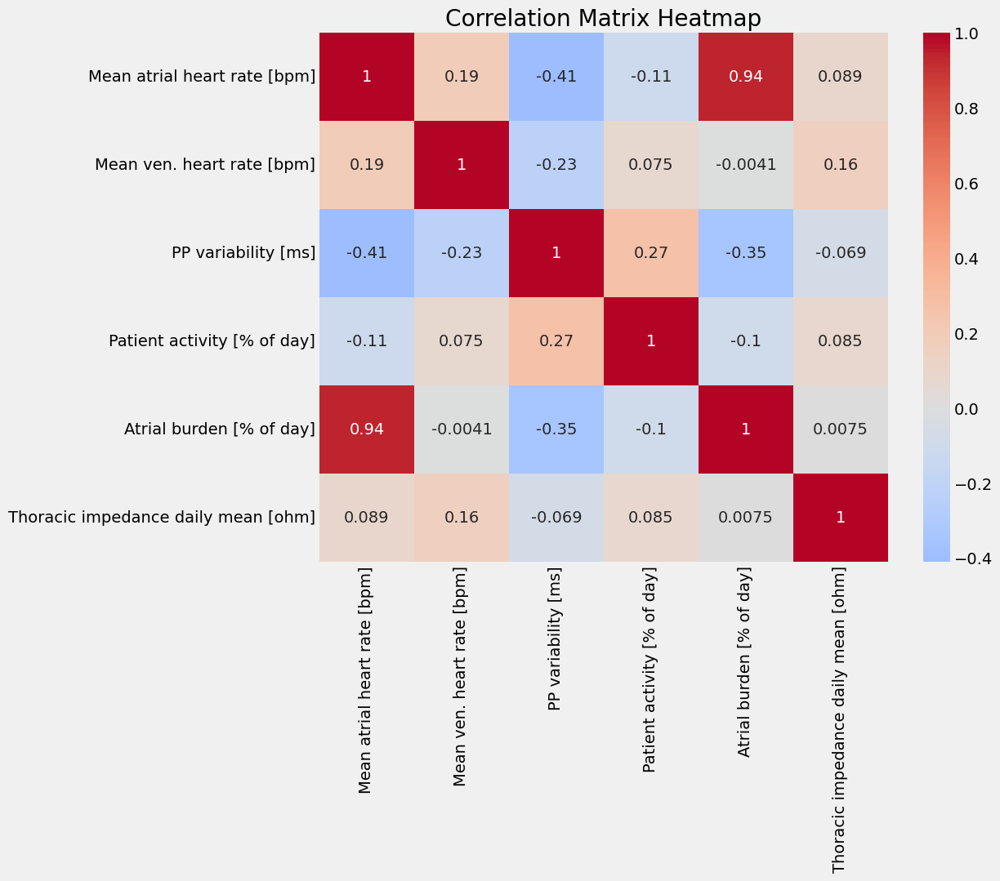

In [224]:
# Calculate the correlation matrix
correlation_matrix = super_master_df.corr()

# Create a heatmap using seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix Heatmap")
# Save figure
plt.savefig(".\\GRAPHS\\sns_heatmap.png", 
            bbox_inches = 'tight')
plt.show()

In [225]:
# Set the font scale to make text smaller
sns.set(font_scale=0.8)  # Adjust the value as needed

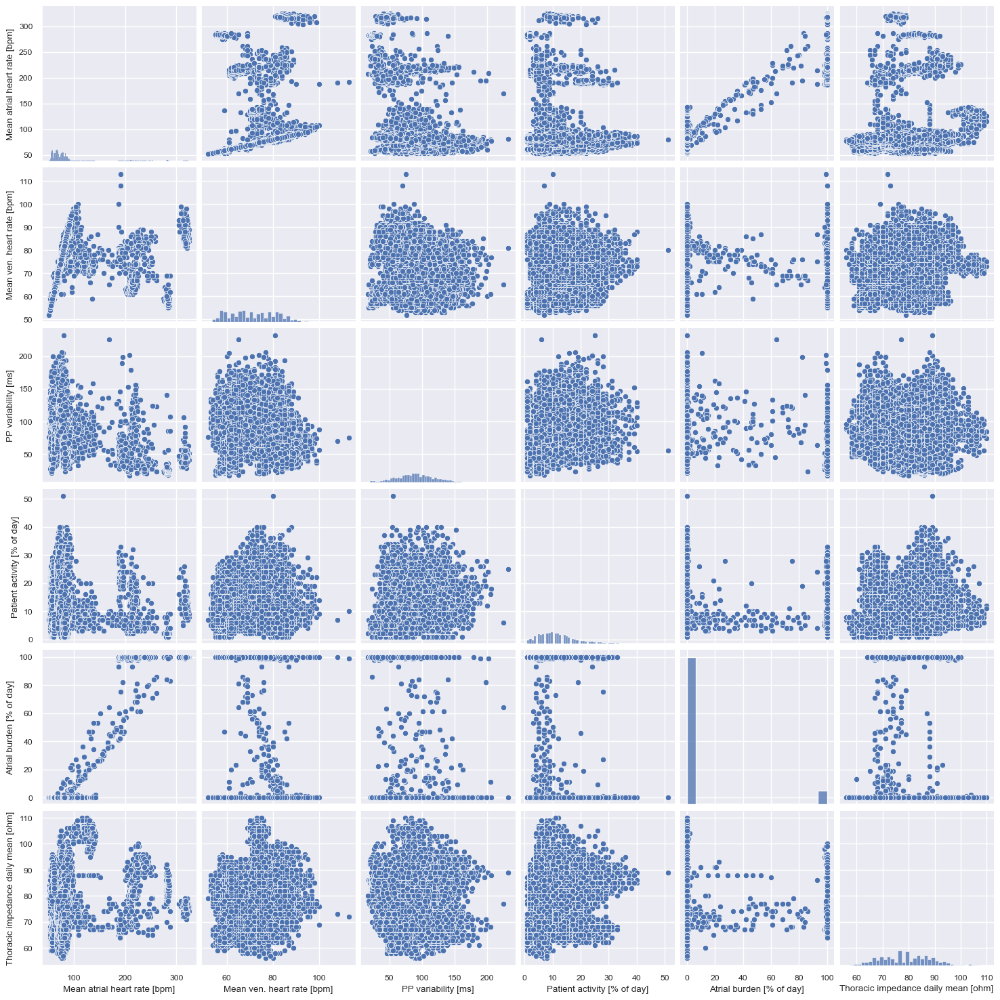

In [226]:
sns.pairplot(data=super_master_df)

In [227]:
# Reset seaborn defaults
sns.reset_defaults()

In [228]:
# Matplotlib
%matplotlib inline
# Set the style
plt.style.use('fivethirtyeight')

### 2.7.6.0: Visualisation of two cases and controls

#### 2.7.6.1: All relevant columns

Using index 7

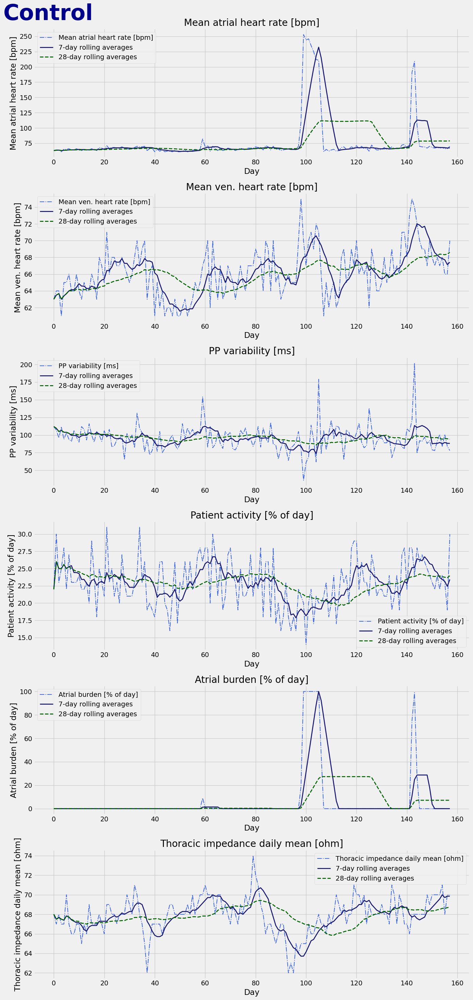

In [229]:
easy_plot(explorative_pace_data[0][7], relevant_columns, control=True, path=".\GRAPHS\control_7")

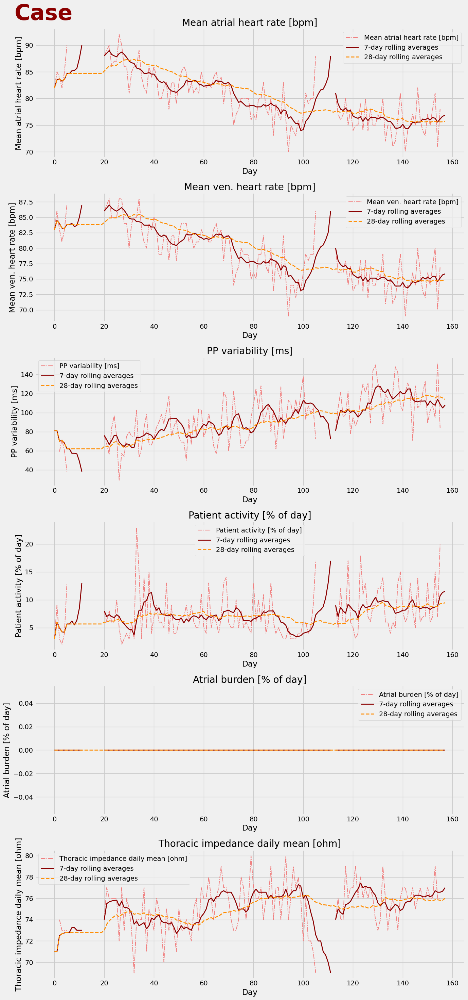

In [230]:
easy_plot(explorative_pace_data[1][7], relevant_columns, control=False, path=".\GRAPHS\case_7")

#### 2.7.6.2: Only "Mean ven. heart rate [bpm]"

Using index 2

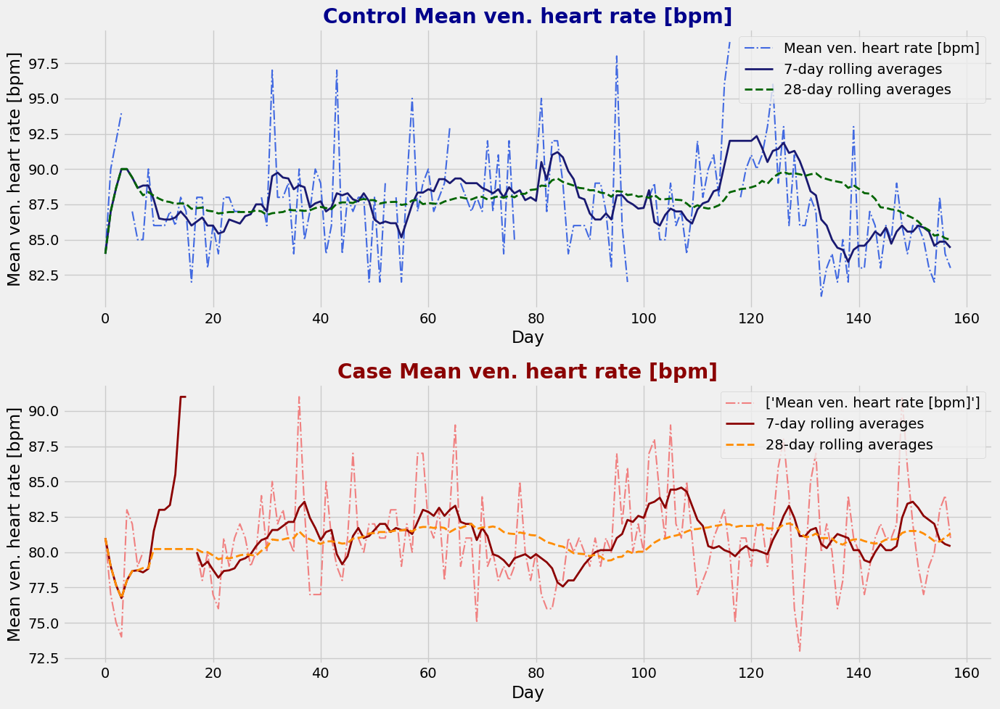

In [231]:
# Create figure
fig_length = 10
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(14, fig_length))

# Control

# Plot default values
axes[0].plot(explorative_pace_data[0][2]["Mean ven. heart rate [bpm]"].index, explorative_pace_data[0][2]["Mean ven. heart rate [bpm]"].values, label="Mean ven. heart rate [bpm]", linestyle='-.', linewidth=1.5, color='royalblue')

# Calculate rolling averages
rolling_7day = explorative_pace_data[0][2]["Mean ven. heart rate [bpm]"].rolling(window=7, min_periods=1).mean()
rolling_28day = explorative_pace_data[0][2]["Mean ven. heart rate [bpm]"].rolling(window=28, min_periods=1).mean()

# Plot rolling averages with darker shades
axes[0].plot(explorative_pace_data[0][2]["Mean ven. heart rate [bpm]"].index, rolling_7day, label='7-day rolling averages', linestyle='-', linewidth=2, color='midnightblue')
axes[0].plot(explorative_pace_data[0][2]["Mean ven. heart rate [bpm]"].index, rolling_28day, label='28-day rolling averages', linestyle='--', linewidth=2, color='darkgreen')

axes[0].set_ylabel("Mean ven. heart rate [bpm]")
axes[0].set_xlabel("Day")
axes[0].set_title("Control Mean ven. heart rate [bpm]", fontweight='extra bold', color='darkblue')
axes[0].legend(loc='best')

# Case

# Plot default values
axes[1].plot(explorative_pace_data[1][2]["Mean ven. heart rate [bpm]"].index, explorative_pace_data[1][2]["Mean ven. heart rate [bpm]"].values, label=["Mean ven. heart rate [bpm]"], linestyle='-.', linewidth=1.5, color='lightcoral')

# Calculate rolling averages
rolling_7day = explorative_pace_data[1][2]["Mean ven. heart rate [bpm]"].rolling(window=7, min_periods=1).mean()
rolling_28day = explorative_pace_data[1][2]["Mean ven. heart rate [bpm]"].rolling(window=28, min_periods=1).mean()

# Plot rolling averages with darker shades
axes[1].plot(explorative_pace_data[1][2]["Mean ven. heart rate [bpm]"].index, rolling_7day, label='7-day rolling averages', linestyle='-', linewidth=2, color='darkred')
axes[1].plot(explorative_pace_data[1][2]["Mean ven. heart rate [bpm]"].index, rolling_28day, label='28-day rolling averages', linestyle='--', linewidth=2, color='darkorange')

axes[1].set_ylabel("Mean ven. heart rate [bpm]")
axes[1].set_xlabel("Day")
axes[1].set_title("Case Mean ven. heart rate [bpm]", fontweight='extra bold', color='darkred')
axes[1].legend(loc='best')

# Adjust layout and display the plot
plt.tight_layout()
plt.savefig(".\GRAPHS\case&control_2", 
            bbox_inches = 'tight')
plt.show()

## 2.8.0.0: Data imputation

Here I will perform missing data imputation. I have decided to use a linear interpolation imputation technique for convenience. In case there are places where there is missing data at the beginning or end of a time series data set, I have also applied a forward and backwards fill as a basic extrapolation technique.

For further work, it would interesting to evaluate what the most accurate time series imputation methods are for pacemaker data such as my own, as this would be a key aspect of any working prediction/screening tool that is making use of monitored pacemaker data.

In [232]:
pace_data[1][7].head(20)

,Atrial arrhythmia episodes per day,Atrial burden [% of day],Atrial pacing (Ap) [%],Conducted atrial pacing (Ap - Vs) [%],Dual-chamber pacing (Ap - Vp) [%],Duration of longest high ven. rate episode per day,Duration of mode switching [% of day],HVR counter [events],High ven. rate episodes per day,Intrinsic rhythm (As - Vs) [%],Max. ventricular rate during AT/AF [bpm],Mean PVC/h,Mean atrial heart rate [bpm],Mean ven. heart rate [bpm],Mean ventricular rate during AT/AF [bpm],Mean ventricular rate during mode switching [bpm],New long atrial episode detected (ongoing at end of mon. interv.),Number of mode switching per day,PMT episodes per day,PP variability [ms],Patient activity [% of day],RA pacing impedance [ohm],RA pulse amplitude [V],RA sensing amplitude (daily mean) [mV],RA sensing amplitude (daily min) [mV],RV pacing impedance [ohm],RV pulse amplitude [V],RV sensing amplitude (daily mean) [mV],RV sensing amplitude (daily min) [mV],Thoracic impedance daily mean [ohm],Upper tracking rate [bpm],VAT stimulation (As - Vp) [%],VV sequence (Vx - Vx) [%],Ven. pacing (RVp) [%]
Day of transmission,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,0.0,0.0,0.0,56.0,82.0,83.0,0.0,0.0,0.0,0.0,0.0,81.0,3.0,468.0,1.8,1.2,0.9,605.0,1.5,8.7,7.0,71.0,130.0,98.0,1.0,98.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,0.0,1.0,0.0,73.0,85.0,86.0,0.0,0.0,0.0,0.0,0.0,NaN,9.0,468.0,1.8,1.2,0.7,605.0,1.5,7.7,7.7,NaN,130.0,98.0,1.0,98.0
2,0.0,0.0,2.0,0.0,2.0,0.0,0.0,8.0,0.0,0.0,0.0,22.0,84.0,83.0,0.0,60.0,0.0,4.0,0.0,59.0,3.0,449.0,1.8,1.0,0.8,585.0,1.5,10.9,8.1,74.0,130.0,98.0,0.0,99.0
3,0.0,0.0,2.0,0.0,2.0,0.0,0.0,8.0,0.0,0.0,0.0,22.0,82.0,81.0,0.0,0.0,0.0,0.0,0.0,72.0,2.0,468.0,1.8,1.2,0.6,585.0,1.6,10.9,9.5,73.0,130.0,98.0,0.0,99.0
4,0.0,0.0,2.0,0.0,2.0,0.0,0.0,8.0,0.0,0.0,0.0,40.0,85.0,83.0,0.0,60.0,0.0,1.0,0.0,60.0,4.0,468.0,1.7,1.1,0.7,585.0,1.5,11.8,7.7,73.0,130.0,97.0,1.0,99.0
5,0.0,0.0,2.0,0.0,2.0,0.0,0.0,8.0,0.0,0.0,0.0,27.0,90.0,87.0,0.0,0.0,0.0,3.0,0.0,38.0,13.0,449.0,1.8,1.1,0.6,605.0,1.5,9.5,7.7,73.0,130.0,97.0,1.0,99.0
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [233]:
# Loop through read in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        # Impute missing data
        pace_data[i][x] = pace_data[i][x].interpolate(method='linear')
        pace_data[i][x] = pace_data[i][x].fillna(method='ffill')
        pace_data[i][x] = pace_data[i][x].fillna(method='bfill')

In [234]:
pace_data[1][7].head(20)

,Atrial arrhythmia episodes per day,Atrial burden [% of day],Atrial pacing (Ap) [%],Conducted atrial pacing (Ap - Vs) [%],Dual-chamber pacing (Ap - Vp) [%],Duration of longest high ven. rate episode per day,Duration of mode switching [% of day],HVR counter [events],High ven. rate episodes per day,Intrinsic rhythm (As - Vs) [%],Max. ventricular rate during AT/AF [bpm],Mean PVC/h,Mean atrial heart rate [bpm],Mean ven. heart rate [bpm],Mean ventricular rate during AT/AF [bpm],Mean ventricular rate during mode switching [bpm],New long atrial episode detected (ongoing at end of mon. interv.),Number of mode switching per day,PMT episodes per day,PP variability [ms],Patient activity [% of day],RA pacing impedance [ohm],RA pulse amplitude [V],RA sensing amplitude (daily mean) [mV],RA sensing amplitude (daily min) [mV],RV pacing impedance [ohm],RV pulse amplitude [V],RV sensing amplitude (daily mean) [mV],RV sensing amplitude (daily min) [mV],Thoracic impedance daily mean [ohm],Upper tracking rate [bpm],VAT stimulation (As - Vp) [%],VV sequence (Vx - Vx) [%],Ven. pacing (RVp) [%]
Day of transmission,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,0.0,0.0,0.0,56.000000,82.000000,83.000000,0.0,0.0,0.0,0.000000,0.0,81.000000,3.000000,468.0,1.800000,1.200000,0.900000,605.000000,1.500000,8.700000,7.000000,71.000000,130.0,98.0,1.0,98.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,0.0,1.0,0.0,73.000000,85.000000,86.000000,0.0,0.0,0.0,0.000000,0.0,70.000000,9.000000,468.0,1.800000,1.200000,0.700000,605.000000,1.500000,7.700000,7.700000,72.500000,130.0,98.0,1.0,98.0
2,0.0,0.0,2.0,0.0,2.0,0.0,0.0,8.0,0.0,0.0,0.0,22.000000,84.000000,83.000000,0.0,60.0,0.0,4.000000,0.0,59.000000,3.000000,449.0,1.800000,1.000000,0.800000,585.000000,1.500000,10.900000,8.100000,74.000000,130.0,98.0,0.0,99.0
3,0.0,0.0,2.0,0.0,2.0,0.0,0.0,8.0,0.0,0.0,0.0,22.000000,82.000000,81.000000,0.0,0.0,0.0,0.000000,0.0,72.000000,2.000000,468.0,1.800000,1.200000,0.600000,585.000000,1.600000,10.900000,9.500000,73.000000,130.0,98.0,0.0,99.0
4,0.0,0.0,2.0,0.0,2.0,0.0,0.0,8.0,0.0,0.0,0.0,40.000000,85.000000,83.000000,0.0,60.0,0.0,1.000000,0.0,60.000000,4.000000,468.0,1.700000,1.100000,0.700000,585.000000,1.500000,11.800000,7.700000,73.000000,130.0,97.0,1.0,99.0
5,0.0,0.0,2.0,0.0,2.0,0.0,0.0,8.0,0.0,0.0,0.0,27.000000,90.000000,87.000000,0.0,0.0,0.0,3.000000,0.0,38.000000,13.000000,449.0,1.800000,1.100000,0.600000,605.000000,1.500000,9.500000,7.700000,73.000000,130.0,97.0,1.0,99.0
6,0.0,0.0,2.0,0.0,2.0,0.0,0.0,8.0,0.0,0.0,0.0,27.466667,89.866667,86.933333,0.0,4.0,0.0,2.866667,0.0,40.533333,12.666667,451.6,1.793333,1.113333,0.593333,603.666667,1.486667,9.633333,7.726667,73.066667,130.0,97.0,1.0,99.0
7,0.0,0.0,2.0,0.0,2.0,0.0,0.0,8.0,0.0,0.0,0.0,27.933333,89.733333,86.866667,0.0,8.0,0.0,2.733333,0.0,43.066667,12.333333,454.2,1.786667,1.126667,0.586667,602.333333,1.473333,9.766667,7.753333,73.133333,130.0,97.0,1.0,99.0
8,0.0,0.0,2.0,0.0,2.0,0.0,0.0,8.0,0.0,0.0,0.0,28.400000,89.600000,86.800000,0.0,12.0,0.0,2.600000,0.0,45.600000,12.000000,456.8,1.780000,1.140000,0.580000,601.000000,1.460000,9.900000,7.780000,73.200000,130.0,97.0,1.0,99.0


In [235]:
# Validate that there are no more missing values.
passed = True

# Loop through read in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        # Impute missing data
        if df.isnull().values.any():
            print("Fail")
            passed = False
        else:
            pass

if passed:
    print("Passed")

Passed


## 2.9.0.0: Time series padding

Here I will find the entry with the shortest amount of days of recorded data and disregard then make all data points the same length.

In [236]:
len(pace_data[0][5])

343

In [237]:
temp_list = []

In [238]:
# Loop through read in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        # text
        temp_list.append(len(df))

In [239]:
print(min(temp_list))

158


In [240]:
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        # Shorten each df to minimum length
        pace_data[i][x] = pace_data[i][x].iloc[:min(temp_list)]

In [241]:
len(pace_data[0][5])

158

In [242]:
len(pace_data[1][5])

158

## 2.10.0.0: Converting to values

After this, I will then flatten the pandas DataFrame for each individual such that the dimensions of each patient are the same and treat the data as a normal classification problem afterwards.

In [243]:
# Create DataFrame for correct ML format
processed_data = pd.DataFrame(columns=pace_data[0][0].columns)

In [244]:
processed_data["PICM status"] = None

In [245]:
processed_data

,Atrial arrhythmia episodes per day,Atrial burden [% of day],Atrial pacing (Ap) [%],Conducted atrial pacing (Ap - Vs) [%],Dual-chamber pacing (Ap - Vp) [%],Duration of longest high ven. rate episode per day,Duration of mode switching [% of day],HVR counter [events],High ven. rate episodes per day,Intrinsic rhythm (As - Vs) [%],Max. ventricular rate during AT/AF [bpm],Mean PVC/h,Mean atrial heart rate [bpm],Mean ven. heart rate [bpm],Mean ventricular rate during AT/AF [bpm],Mean ventricular rate during mode switching [bpm],New long atrial episode detected (ongoing at end of mon. interv.),Number of mode switching per day,PMT episodes per day,PP variability [ms],Patient activity [% of day],RA pacing impedance [ohm],RA pulse amplitude [V],RA sensing amplitude (daily mean) [mV],RA sensing amplitude (daily min) [mV],RV pacing impedance [ohm],RV pulse amplitude [V],RV sensing amplitude (daily mean) [mV],RV sensing amplitude (daily min) [mV],Thoracic impedance daily mean [ohm],Upper tracking rate [bpm],VAT stimulation (As - Vp) [%],VV sequence (Vx - Vx) [%],Ven. pacing (RVp) [%],PICM status


In [246]:
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        # Create a new row as a dictionary
        new_row = {}
        # Find column values for each feature
        for col_name in df.columns:
            new_row[col_name] = [df[col_name].values]                                 
        # Find picm status
        if i == 0:
            new_row["PICM status"] = 0
        elif i == 1:
            new_row["PICM status"] = 1
        # Create a new row as a dictionary
        new_row = pd.DataFrame(new_row)
        # Concatenate the original DataFrame with the new row
        processed_data = pd.concat([processed_data, new_row], ignore_index=True)

Validate changes and format.

In [247]:
processed_data.head(2)

,Atrial arrhythmia episodes per day,Atrial burden [% of day],Atrial pacing (Ap) [%],Conducted atrial pacing (Ap - Vs) [%],Dual-chamber pacing (Ap - Vp) [%],Duration of longest high ven. rate episode per day,Duration of mode switching [% of day],HVR counter [events],High ven. rate episodes per day,Intrinsic rhythm (As - Vs) [%],Max. ventricular rate during AT/AF [bpm],Mean PVC/h,Mean atrial heart rate [bpm],Mean ven. heart rate [bpm],Mean ventricular rate during AT/AF [bpm],Mean ventricular rate during mode switching [bpm],New long atrial episode detected (ongoing at end of mon. interv.),Number of mode switching per day,PMT episodes per day,PP variability [ms],Patient activity [% of day],RA pacing impedance [ohm],RA pulse amplitude [V],RA sensing amplitude (daily mean) [mV],RA sensing amplitude (daily min) [mV],RV pacing impedance [ohm],RV pulse amplitude [V],RV sensing amplitude (daily mean) [mV],RV sensing amplitude (daily min) [mV],Thoracic impedance daily mean [ohm],Upper tracking rate [bpm],VAT stimulation (As - Vp) [%],VV sequence (Vx - Vx) [%],Ven. pacing (RVp) [%],PICM status
0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[78.0, 80.0, 68.0, 79.0, 82.0, 80.0, 79.0, 78....","[61.0, 60.0, 59.0, 48.0, 66.0, 53.0, 54.0, 61....","[17.0, 20.0, 9.0, 30.0, 16.0, 27.0, 26.0, 16.0...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[21.0, 20.0, 31.0, 21.0, 17.0, 20.0, 20.0, 22....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[9.0, 4.0, 4.0, 3.0, 1.0, 2.0, 4.0, 4.0, 6.333...","[66.0, 65.0, 67.0, 68.0, 65.0, 68.0, 66.0, 68....","[66.0, 65.0, 67.0, 68.0, 65.0, 68.0, 66.0, 68....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[86.0, 83.0, 87.0, 66.0, 85.0, 64.0, 72.0, 51....","[17.0, 12.0, 15.0, 14.0, 16.0, 17.0, 17.0, 23....","[429.0, 449.0, 410.0, 566.0, 429.0, 468.0, 449...","[1.5, 1.5, 1.5, 1.4, 1.5, 1.5, 1.5, 1.5, 1.5, ...","[2.4, 1.9, 2.3, 3.7, 2.2, 3.1, 2.2, 2.5, 2.4, ...","[1.1, 1.6, 1.4, 1.1, 1.6, 1.5, 1.4, 1.3, 1.400...","[585.0, 605.0, 585.0, 702.0, 605.0, 624.0, 585...","[1.1, 1.1, 1.1, 1.1, 1.1, 1.1, 1.1, 1.1, 1.066...","[8.9, 10.2, 9.2, 12.8, 8.9, 10.3, 8.8, 8.9, 9....","[8.0, 8.0, 8.0, 8.2, 7.9, 8.2, 8.0, 7.8, 7.933...","[67.0, 65.0, 68.0, 66.0, 69.0, 68.0, 69.0, 69....","[150.0, 150.0, 150.0, 150.0, 150.0, 150.0, 150...","[1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.666...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[18.0, 20.0, 10.0, 31.0, 17.0, 28.0, 26.0, 17....",0
1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[56.0, 49.0, 55.0, 60.0, 57.0, 64.0, 69.0, 61....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, ...","[80.0, 77.0, 83.0, 81.0, 82.0, 80.0, 83.0, 81....","[80.0, 77.0, 83.0, 81.0, 82.0, 80.0, 83.0, 81....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[100.0, 94.0, 92.0, 91.0, 101.0, 93.0, 104.0, ...","[8.0, 6.0, 13.0, 9.0, 9.0, 8.0, 13.0, 9.0, 5.0...","[605.0, 605.0, 605.0, 585.0, 605.

In [248]:
processed_data.tail(2)

,Atrial arrhythmia episodes per day,Atrial burden [% of day],Atrial pacing (Ap) [%],Conducted atrial pacing (Ap - Vs) [%],Dual-chamber pacing (Ap - Vp) [%],Duration of longest high ven. rate episode per day,Duration of mode switching [% of day],HVR counter [events],High ven. rate episodes per day,Intrinsic rhythm (As - Vs) [%],Max. ventricular rate during AT/AF [bpm],Mean PVC/h,Mean atrial heart rate [bpm],Mean ven. heart rate [bpm],Mean ventricular rate during AT/AF [bpm],Mean ventricular rate during mode switching [bpm],New long atrial episode detected (ongoing at end of mon. interv.),Number of mode switching per day,PMT episodes per day,PP variability [ms],Patient activity [% of day],RA pacing impedance [ohm],RA pulse amplitude [V],RA sensing amplitude (daily mean) [mV],RA sensing amplitude (daily min) [mV],RV pacing impedance [ohm],RV pulse amplitude [V],RV sensing amplitude (daily mean) [mV],RV sensing amplitude (daily min) [mV],Thoracic impedance daily mean [ohm],Upper tracking rate [bpm],VAT stimulation (As - Vp) [%],VV sequence (Vx - Vx) [%],Ven. pacing (RVp) [%],PICM status
58,"[0.0, 2.0, 7.0, 0.0, 2.0, 0.0, 4.0, 0.0, 0.0, ...","[0.0, 12.0, 74.0, 0.0, 36.0, 0.0, 46.0, 0.0, 4...","[1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.0, 1.0, 2.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 12.0, 74.0, 0.0, 36.0, 0.0, 46.0, 0.0, 4...","[8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.0, 1.0, 0.0, 1.0, 1.0, 2.0, 1.0, 2.0, 1.0, ...","[0.0, 104.0, 105.0, 0.0, 108.0, 0.0, 118.0, 0....","[21.0, 17.0, 6.0, 11.0, 12.0, 23.0, 7.0, 29.0,...","[86.0, 112.0, 261.0, 85.0, 174.0, 90.0, 196.0,...","[84.0, 81.0, 69.0, 83.0, 78.0, 88.0, 77.0, 86....","[0.0, 63.0, 62.0, 0.0, 63.0, 0.0, 67.0, 0.0, 6...","[0.0, 63.0, 62.0, 0.0, 63.0, 0.0, 67.0, 60.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[11.0, 3.0, 24.0, 4.0, 18.0, 2.0, 77.0, 3.0, 9...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 10.0, 0.0,...","[40.0, 137.0, 123.0, 101.0, 99.0, 110.0, 99.0,...","[5.0, 4.0, 4.0, 3.0, 5.0, 9.0, 7.0, 9.0, 8.0, ...","[488.0, 488.0, 468.0, 468.0, 488.0, 488.0, 488...","[1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.6, 1.6, 1.6, ...","[5.3, 5.4, 5.6, 4.8, 5.7, 4.8, 5.1, 4.9, 4.6, ...","[3.3, 2.2, 2.0, 3.2, 2.2, 2.9, 2.3, 3.6, 2.3, ...","[527.0, 507.0, 507.0, 507.0, 527.0, 527.0, 488...","[1.4, 1.3, 3.0, 1.3, 1.3, 1.2, 1.3, 1.3, 1.3, ...","[9.1, 8.8, 9.0, 8.8, 9.0, 8.4, 8.1, 8.1, 8.7, ...","[7.8, 7.0, 7.6, 7.6, 7.7, 6.1, 6.8, 6.5, 7.7, ...","[67.0, 68.0, 68.0, 68.0, 68.0, 67.0, 67.0, 68....","[130.0, 130.0, 130.0, 130.0, 130.0, 130.0, 130...","[98.0, 98.0, 97.0, 98.0, 97.0, 97.0, 98.0, 97....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, ...","[99.0, 99.0, 98.0, 99.0, 99.0, 98.0, 98.0, 98....",1
59,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 1.0, ...","[87.0, 83.0, 82.0, 86.0, 88.0, 81.0, 83.0, 80....","[87.0, 83.0, 82.0, 86.0, 88.0, 81.0, 83.0, 80....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[57.0, 53.0, 68.0, 80.0, 37.0, 50.0, 42.0, 68....","[8.0, 6.0, 1.0, 7.0, 9.0, 1.0, 1.0, 5.0, 2.0, ...","[566.0, 546.0, 527.0, 546.0, 52

In [249]:
len(processed_data)

60

In [250]:
processed_data["RV pacing impedance [ohm]"][0]

array([585.        , 605.        , 585.        , 702.        ,
       605.        , 624.        , 585.        , 585.        ,
       604.66666667, 624.33333333, 644.        , 605.        ,
       605.        , 605.        , 624.        , 605.        ,
       605.        , 644.        , 624.        , 624.        ,
       624.        , 624.        , 624.        , 624.        ,
       605.        , 624.        , 644.        , 624.        ,
       624.        , 644.        , 624.        , 663.        ,
       644.        , 624.        , 644.        , 644.        ,
       663.        , 624.        , 624.        , 624.        ,
       644.        , 624.        , 663.        , 624.        ,
       605.        , 605.        , 605.        , 605.        ,
       644.        , 624.        , 605.        , 605.        ,
       605.        , 624.        , 585.        , 624.        ,
       605.        , 624.        , 624.        , 624.        ,
       624.        , 605.        , 624.        , 624.  

In [251]:
processed_data["RV pacing impedance [ohm]"][0][0]

585.0

In [252]:
print(len(processed_data["RV pacing impedance [ohm]"][0]))

158


# 3.0.0.0: Machine learning

## 3.1.0.0: Initial setup

### 3.1.1.0: Preparing x and y

In [253]:
x = processed_data[pace_data[0][0].columns]

In [254]:
y = processed_data["PICM status"]

In [255]:
x.head()

,Atrial arrhythmia episodes per day,Atrial burden [% of day],Atrial pacing (Ap) [%],Conducted atrial pacing (Ap - Vs) [%],Dual-chamber pacing (Ap - Vp) [%],Duration of longest high ven. rate episode per day,Duration of mode switching [% of day],HVR counter [events],High ven. rate episodes per day,Intrinsic rhythm (As - Vs) [%],Max. ventricular rate during AT/AF [bpm],Mean PVC/h,Mean atrial heart rate [bpm],Mean ven. heart rate [bpm],Mean ventricular rate during AT/AF [bpm],Mean ventricular rate during mode switching [bpm],New long atrial episode detected (ongoing at end of mon. interv.),Number of mode switching per day,PMT episodes per day,PP variability [ms],Patient activity [% of day],RA pacing impedance [ohm],RA pulse amplitude [V],RA sensing amplitude (daily mean) [mV],RA sensing amplitude (daily min) [mV],RV pacing impedance [ohm],RV pulse amplitude [V],RV sensing amplitude (daily mean) [mV],RV sensing amplitude (daily min) [mV],Thoracic impedance daily mean [ohm],Upper tracking rate [bpm],VAT stimulation (As - Vp) [%],VV sequence (Vx - Vx) [%],Ven. pacing (RVp) [%]
0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[78.0, 80.0, 68.0, 79.0, 82.0, 80.0, 79.0, 78....","[61.0, 60.0, 59.0, 48.0, 66.0, 53.0, 54.0, 61....","[17.0, 20.0, 9.0, 30.0, 16.0, 27.0, 26.0, 16.0...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, 8.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[21.0, 20.0, 31.0, 21.0, 17.0, 20.0, 20.0, 22....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[9.0, 4.0, 4.0, 3.0, 1.0, 2.0, 4.0, 4.0, 6.333...","[66.0, 65.0, 67.0, 68.0, 65.0, 68.0, 66.0, 68....","[66.0, 65.0, 67.0, 68.0, 65.0, 68.0, 66.0, 68....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[86.0, 83.0, 87.0, 66.0, 85.0, 64.0, 72.0, 51....","[17.0, 12.0, 15.0, 14.0, 16.0, 17.0, 17.0, 23....","[429.0, 449.0, 410.0, 566.0, 429.0, 468.0, 449...","[1.5, 1.5, 1.5, 1.4, 1.5, 1.5, 1.5, 1.5, 1.5, ...","[2.4, 1.9, 2.3, 3.7, 2.2, 3.1, 2.2, 2.5, 2.4, ...","[1.1, 1.6, 1.4, 1.1, 1.6, 1.5, 1.4, 1.3, 1.400...","[585.0, 605.0, 585.0, 702.0, 605.0, 624.0, 585...","[1.1, 1.1, 1.1, 1.1, 1.1, 1.1, 1.1, 1.1, 1.066...","[8.9, 10.2, 9.2, 12.8, 8.9, 10.3, 8.8, 8.9, 9....","[8.0, 8.0, 8.0, 8.2, 7.9, 8.2, 8.0, 7.8, 7.933...","[67.0, 65.0, 68.0, 66.0, 69.0, 68.0, 69.0, 69....","[150.0, 150.0, 150.0, 150.0, 150.0, 150.0, 150...","[1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.666...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[18.0, 20.0, 10.0, 31.0, 17.0, 28.0, 26.0, 17...."
1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16.0, 16....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[56.0, 49.0, 55.0, 60.0, 57.0, 64.0, 69.0, 61....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, ...","[80.0, 77.0, 83.0, 81.0, 82.0, 80.0, 83.0, 81....","[80.0, 77.0, 83.0, 81.0, 82.0, 80.0, 83.0, 81....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[100.0, 94.0, 92.0, 91.0, 101.0, 93.0, 104.0, ...","[8.0, 6.0, 13.0, 9.0, 9.0, 8.0, 13.0, 9.0, 5.0...","[605.0, 605.0, 605.0, 585.0, 605.0, 585.0, 585.

In [256]:
y[:5]

0    0
1    0
2    0
3    0
4    0
Name: PICM status, dtype: object

In [257]:
# Apply the function to each cell of the DataFrame
x = x.applymap(array_to_series)

In [258]:
y = y.to_numpy(dtype='<U1')

### 3.1.2.0: Initialisation of ML objects and results dictionary

In [259]:
# Initialise an empty dict to store the results
results = {}

In [260]:
# Create the StratifiedKFold object with 10 folds
stratified_kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=SEED)

In [261]:
# Create the FlattenTS_scale transformer instance
transformer1 = FlattenTS_scale()

# Create the MinMaxScaler instance
scaler = MinMaxScaler()

# Create the FlattenTS_res transformer instance
transformer3 = FlattenTS_res()

# Create the XGBRF_transformer transformer instance
transformer5 = XGBRF_transformer()

In [262]:
# Create the ScaledToTSDF transformer instance
transformer2 = ScaledToTSDF(x.columns)

# Create the SMOTEENNToTSDF transformer instance
transformer4 = SMOTEENNToTSDF(x.columns)

## 3.2.0.0: Feature selection with XGBoost's RF and TSFresh transform 

From previous experimentation with "Atrial arrhythmia episodes per day" and "Atrial burden [% of day]", the best results were achieved from the KNN classifier and the XGBoost RF classifier with TSFresh transform. Furthermore, when trialled on all of the data, all models performed worse than when just "Atrial arrhythmia episodes per day" and "Atrial burden [% of day]" were used.

Here, I will aim to select only those features that will improve my model and remove any features that worsen my model using forward feature selection. I will use XGBoost's RF on features extracted from TSFresh's time series feature extraction transform for feature selection. XGBoost's RF is a decision tree classifier and thus does not suffer from the dimensionality problem that KNN does. This makes XGBoost's RF the superior model for feature selection. 

From previous experimentation, results were generally low. Therefore, I will include any features that improve my model, even marginally.

Before feature selection, I will test various pipeline architectures on Atrial arrhythmia episodes per day" and "Atrial burden [% of day]" to find the optimum pipeline for XGBoost's RF with TSfresh.

### 3.2.1.0: Pipeline experimentation

#### 3.2.1.1: Setup

In [263]:
# Create the TSFreshFeatureExtractor transformer instance
tsf = TSFreshFeatureExtractor(default_fc_parameters="efficient", show_warnings=False)

# Create the XGBoost RF classifier instance
classifier = xgb.XGBRFClassifier(random_state=SEED)

In [264]:
temp_cols = [
    "Atrial arrhythmia episodes per day",
    "Atrial burden [% of day]"
]

In [265]:
x = processed_data[temp_cols]

In [266]:
# Apply the function to each cell of the DataFrame
x = x.applymap(array_to_series)

In [267]:
x.head(2)

,Atrial arrhythmia episodes per day,Atrial burden [% of day]
0,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 0.0 1 0.0 2 0.0 3 0.0 4 ...
1,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 0.0 1 0.0 2 0.0 3 0.0 4 ...


In [268]:
# Create the ScaledToTSDF transformer instance
transformer2 = ScaledToTSDF(x.columns)

# Create the SMOTEENNToTSDF transformer instance
transformer4 = SMOTEENNToTSDF(x.columns)

In [269]:
# y has to be an integer for XGBoost, unlike other sktime models
Y = y.astype(int)

#### 3.2.1.2: Without scaling nor resampling

In [270]:
# Create the pipeline
pipeline = Pipeline([
    ("tsf", tsf),
    ("transformer5", transformer5),
    ("classifier", classifier)
])

In [271]:
# Calculate the cross-validation AUC using the pipeline
cv_auc = cross_val_score(pipeline, x, Y, cv=stratified_kfold, scoring='roc_auc')

Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 28.53it/s]


In [272]:
np.mean(cv_auc)

0.6224999999999999

#### 3.2.1.3: With scaling, no resampling

In [273]:
# Create the pipeline
pipeline = Pipeline([
    ("transformer1", transformer1),
    ("scaler", scaler),
    ("transformer2", transformer2),
    ("tsf", tsf),
    ("transformer5", transformer5),
    ("classifier", classifier)
])

In [274]:
# Calculate the cross-validation AUC using the pipeline
cv_auc = cross_val_score(pipeline, x, Y, cv=stratified_kfold, scoring='roc_auc')

Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 30.24it/s]


In [275]:
np.mean(cv_auc)

0.595

#### 3.2.1.4: With both scaling and resampling

##### Scaling before TSFresh transform

In [276]:
# Initialise resampler
resampler = SMOTEENN(sampling_strategy=1)

In [277]:
pipeline = Pipeline([
    ("transformer1", transformer1),
    ("scaler", scaler),
    ("transformer2", transformer2),
    ("transformer3", transformer3),
    ("resampler", resampler),
    ("transformer4", transformer4),
    ("tsf", tsf),
    ("transformer5", transformer5),
    ("classifier", classifier)
])

In [278]:
# Calculate the cross-validation AUC using the pipeline
cv_auc = cross_val_score(pipeline, x, Y, cv=stratified_kfold, scoring='roc_auc')

Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 28.10it/s]
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Charlie\anaconda3\envs\Risk_Strat_Surg\lib\site-packages\sklearn\metrics\_scorer.py", line 373, in _score
    y_pred = method_caller(clf, "decision_function", X)
  File "C:\Users\Charlie\anaconda3\envs\Risk_Strat_Surg\lib\site-packages\sklearn\metrics\_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "C:\Users\Charlie\anaconda3\envs\Risk_Strat_Surg\lib\site-packages\sklearn\utils\_available_if.py", line 32, in __get__
    if not self.check(obj):
  File "C:\Users\Charlie\anaconda3\envs\Risk_Strat_Surg\lib\site-packages\sklearn\pipeline.py", line 46, in check
    getattr(self._final_estimator, attr)
AttributeError: 'XGBRFClassifier' object has no attribute 'decision_function'

During handling of the above exception, 

In [279]:
np.mean(cv_auc)

nan

##### Scaling after TSFresh transform

In [280]:
pipeline = Pipeline([
    ("transformer1", transformer1),
    ("scaler", scaler),
    ("transformer2", transformer2),
    ("tsf", tsf),
    ("transformer5", transformer5),
    ("resampler", resampler),
    ("classifier", classifier)
])

In [281]:
# Calculate the cross-validation AUC using the pipeline
cv_auc = cross_val_score(pipeline, x, Y, cv=stratified_kfold, scoring='roc_auc')

Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 28.60it/s]
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Charlie\anaconda3\envs\Risk_Strat_Surg\lib\site-packages\sklearn\metrics\_scorer.py", line 373, in _score
    y_pred = method_caller(clf, "decision_function", X)
  File "C:\Users\Charlie\anaconda3\envs\Risk_Strat_Surg\lib\site-packages\sklearn\metrics\_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "C:\Users\Charlie\anaconda3\envs\Risk_Strat_Surg\lib\site-packages\sklearn\utils\_available_if.py", line 32, in __get__
    if not self.check(obj):
  File "C:\Users\Charlie\anaconda3\envs\Risk_Strat_Surg\lib\site-packages\sklearn\pipeline.py", line 46, in check
    getattr(self._final_estimator, attr)
AttributeError: 'XGBRFClassifier' object has no attribute 'decision_function'

During handling of the above exception, 

In [282]:
np.mean(cv_auc)

nan

### 3.2.2.0: Forward feature selection

From experimentation, more features have decreased the performance of the TSFresh transform with XGBoost's Random Forest classifier. Let's trial a forward feature selection to select all features that improve the performance of the model. 

#### 3.2.2.1: Setup

In [283]:
x = processed_data[pace_data[0][0].columns]

In [284]:
# Apply the function to each cell of the DataFrame
x = x.applymap(array_to_series)

In [285]:
x.head(2)

,Atrial arrhythmia episodes per day,Atrial burden [% of day],Atrial pacing (Ap) [%],Conducted atrial pacing (Ap - Vs) [%],Dual-chamber pacing (Ap - Vp) [%],Duration of longest high ven. rate episode per day,Duration of mode switching [% of day],HVR counter [events],High ven. rate episodes per day,Intrinsic rhythm (As - Vs) [%],Max. ventricular rate during AT/AF [bpm],Mean PVC/h,Mean atrial heart rate [bpm],Mean ven. heart rate [bpm],Mean ventricular rate during AT/AF [bpm],Mean ventricular rate during mode switching [bpm],New long atrial episode detected (ongoing at end of mon. interv.),Number of mode switching per day,PMT episodes per day,PP variability [ms],Patient activity [% of day],RA pacing impedance [ohm],RA pulse amplitude [V],RA sensing amplitude (daily mean) [mV],RA sensing amplitude (daily min) [mV],RV pacing impedance [ohm],RV pulse amplitude [V],RV sensing amplitude (daily mean) [mV],RV sensing amplitude (daily min) [mV],Thoracic impedance daily mean [ohm],Upper tracking rate [bpm],VAT stimulation (As - Vp) [%],VV sequence (Vx - Vx) [%],Ven. pacing (RVp) [%]
0,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 78.0 1 80.0 2 68.0 3 79....,0 61.000000 1 60.000000 2 59.00...,0 17.000000 1 20.000000 2 9.00...,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 8.0 1 8.0 2 8.0 3 8.0 4 ...,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 21.0 1 20.0 2 31.0 3 21....,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 9.000000 1 4.000000 2 4.00...,0 66.000000 1 65.000000 2 67.00...,0 66.000000 1 65.000000 2 67.00...,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 0.0 1 0.0 2 0.0 3 0....,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 86.0 1 83.0 2 87.0 3 ...,0 17.000000 1 12.000000 2 15.00...,0 429.0 1 449.0 2 410.0 3 ...,0 1.5 1 1.5 2 1.5 3 1.4 4 ...,0 2.40 1 1.90 2 2.30 3 3.7...,0 1.1 1 1.6 2 1.4 3 1.1 4 ...,0 585.000000 1 605.000000 2 585...,0 1.100000 1 1.100000 2 1.10000...,0 8.900000 1 10.200000 2 9.20...,0 8.000000 1 8.000000 2 8.00000...,0 67.000000 1 65.000000 2 68.00...,0 150.0 1 150.0 2 150.0 3 ...,0 1.000000 1 0.000000 2 1.00000...,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 18.000000 1 20.000000 2 10.00...
1,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 16.0 1 16.0 2 16.0 3 16....,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 56.000000 1 49.000000 2 55...,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 1.000000 1 0.000000 2 0.00000...,0 80.000000 1 77.000000 2 83.00...,0 80.000000 1 77.000000 2 83.00...,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 100.000000 1 94.000000 2 92...,0 8.000000 1 6.000000 2 13.00...,0 605.0 1 605.0 2 605.0 3 ...,0 1.6 1 1.5 2 1.5 3 1.5 4 ...,0 5.800000 1 5.800000 2 5.70000...,0 5.200000 1 5.100000 2 5.20000...,0 566.000000 1 566.000000 2 566...,0 1.400000 1 1.400000 2 1.50000...,0 8.800000 1 8.200000 2 8.00...,0 7.400000 1 7.400000 2 7.00000...,0 91.000000 1 92.000000 2 92.00...,0 130.0 1 130.0 2 130.0 3 ...,0 44.000000 1 51.000000 2 45.00...,0 0.0 1 0.0 2 0.0 3 0.0 4 ...,0 44.000000 1 51.000000 2 45.00...


In [286]:
# Initialise the best performing pipeline
pipeline = Pipeline([
    ("tsf", tsf),
    ("transformer5", transformer5),
    ("classifier", classifier)
])

In [287]:
# Initialise variables to keep track of selected features and AUC ROC scores
tsf_xgb_selected_features = []
best_score = 0.0
feature_scores = {}

#### 3.2.2.2: Forward feature selection

In [288]:
feature_selecting = True
while feature_selecting:
    best_subset = None

    for col in x.columns:
        # Skip if the feature is already selected
        if col in tsf_xgb_selected_features:
            continue
        else:
            # Add the current feature to the selected features subset
            candidate_subset = tsf_xgb_selected_features + [col]

            # Calculate the cross-validation AUC using the pipeline
            cv_auc = cross_val_score(pipeline, x[candidate_subset], Y, cv=stratified_kfold, scoring='roc_auc')
            avg_auc_roc = np.mean(cv_auc)
            
            # Print score and combination
            print(f'{candidate_subset} scored {avg_auc_roc}')

            # Check if there's an improvement in AUC ROC
            if avg_auc_roc > best_score:
                best_score = avg_auc_roc
                best_subset = candidate_subset
                
            # If this is the score of the sole feature, record it in a dict
            if len(tsf_xgb_selected_features) == 0:
                feature_scores[col] = avg_auc_roc

    # Stop if no new features provide an improvement
    if best_subset is None:
        feature_selecting = False
    else:
        # Update the list of selected features
        tsf_xgb_selected_features = best_subset
        # End feature selection if all features selected
        if len(tsf_xgb_selected_features) == len(x.columns):
            feature_selecting = False
    
    print(len(tsf_xgb_selected_features))

Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 26.07it/s]


['Atrial arrhythmia episodes per day'] scored 0.6025


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 25.05it/s]


['Atrial burden [% of day]'] scored 0.6199999999999999


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 23.22it/s]


['Atrial pacing (Ap) [%]'] scored 0.7075


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 25.20it/s]


['Conducted atrial pacing (Ap - Vs) [%]'] scored 0.315


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 23.17it/s]


['Dual-chamber pacing (Ap - Vp) [%]'] scored 0.7125


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 27.74it/s]


['Duration of longest high ven. rate episode per day'] scored 0.515


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 25.85it/s]


['Duration of mode switching [% of day]'] scored 0.6025


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 27.24it/s]


['HVR counter [events]'] scored 0.44125


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 26.41it/s]


['High ven. rate episodes per day'] scored 0.495


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 23.86it/s]


['Intrinsic rhythm (As - Vs) [%]'] scored 0.2975


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 26.07it/s]


['Max. ventricular rate during AT/AF [bpm]'] scored 0.6675


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 22.87it/s]


['Mean PVC/h'] scored 0.6725


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 22.68it/s]


['Mean atrial heart rate [bpm]'] scored 0.7875


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 23.00it/s]


['Mean ven. heart rate [bpm]'] scored 0.96


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 25.63it/s]


['Mean ventricular rate during AT/AF [bpm]'] scored 0.6950000000000001


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 24.54it/s]


['Mean ventricular rate during mode switching [bpm]'] scored 0.62


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 26.59it/s]


['New long atrial episode detected (ongoing at end of mon. interv.)'] scored 0.505


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 22.95it/s]


['Number of mode switching per day'] scored 0.685


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 25.47it/s]


['PMT episodes per day'] scored 0.61125


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 21.26it/s]


['PP variability [ms]'] scored 0.5875


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 23.22it/s]


['Patient activity [% of day]'] scored 0.2975


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 23.31it/s]


['RA pacing impedance [ohm]'] scored 0.45499999999999996


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 23.81it/s]


['RA pulse amplitude [V]'] scored 0.805


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 23.26it/s]


['RA sensing amplitude (daily mean) [mV]'] scored 0.615


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 23.22it/s]


['RA sensing amplitude (daily min) [mV]'] scored 0.65


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 22.82it/s]


['RV pacing impedance [ohm]'] scored 0.5375


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 23.91it/s]


['RV pulse amplitude [V]'] scored 0.6599999999999999


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 23.26it/s]


['RV sensing amplitude (daily mean) [mV]'] scored 0.425


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 22.24it/s]


['RV sensing amplitude (daily min) [mV]'] scored 0.5425


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 21.84it/s]


['Thoracic impedance daily mean [ohm]'] scored 0.5775


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 27.43it/s]


['Upper tracking rate [bpm]'] scored 0.53


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 23.67it/s]


['VAT stimulation (As - Vp) [%]'] scored 0.625


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 23.53it/s]


['VV sequence (Vx - Vx) [%]'] scored 0.7324999999999999


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 23.35it/s]


['Ven. pacing (RVp) [%]'] scored 0.76
1


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 25.96it/s]


['Mean ven. heart rate [bpm]', 'Atrial arrhythmia episodes per day'] scored 0.96


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 25.96it/s]


['Mean ven. heart rate [bpm]', 'Atrial burden [% of day]'] scored 0.96


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 24.79it/s]


['Mean ven. heart rate [bpm]', 'Atrial pacing (Ap) [%]'] scored 0.8875


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 25.71it/s]


['Mean ven. heart rate [bpm]', 'Conducted atrial pacing (Ap - Vs) [%]'] scored 0.96


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 25.01it/s]


['Mean ven. heart rate [bpm]', 'Dual-chamber pacing (Ap - Vp) [%]'] scored 0.8800000000000001


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 26.91it/s]


['Mean ven. heart rate [bpm]', 'Duration of longest high ven. rate episode per day'] scored 0.9199999999999999


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 26.38it/s]


['Mean ven. heart rate [bpm]', 'Duration of mode switching [% of day]'] scored 0.96


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 26.85it/s]


['Mean ven. heart rate [bpm]', 'HVR counter [events]'] scored 0.96


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 27.28it/s]


['Mean ven. heart rate [bpm]', 'High ven. rate episodes per day'] scored 0.9199999999999999


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 24.74it/s]


['Mean ven. heart rate [bpm]', 'Intrinsic rhythm (As - Vs) [%]'] scored 0.9075


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 26.50it/s]


['Mean ven. heart rate [bpm]', 'Max. ventricular rate during AT/AF [bpm]'] scored 0.96


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 24.19it/s]


['Mean ven. heart rate [bpm]', 'Mean PVC/h'] scored 0.865


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 24.86it/s]


['Mean ven. heart rate [bpm]', 'Mean atrial heart rate [bpm]'] scored 0.8800000000000001


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 26.33it/s]


['Mean ven. heart rate [bpm]', 'Mean ventricular rate during AT/AF [bpm]'] scored 0.9400000000000001


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 23.70it/s]


['Mean ven. heart rate [bpm]', 'Mean ventricular rate during mode switching [bpm]'] scored 0.9400000000000001


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 26.73it/s]


['Mean ven. heart rate [bpm]', 'New long atrial episode detected (ongoing at end of mon. interv.)'] scored 0.9400000000000001


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 25.07it/s]


['Mean ven. heart rate [bpm]', 'Number of mode switching per day'] scored 0.9400000000000001


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 26.47it/s]


['Mean ven. heart rate [bpm]', 'PMT episodes per day'] scored 0.9400000000000001


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 22.98it/s]


['Mean ven. heart rate [bpm]', 'PP variability [ms]'] scored 0.9400000000000001


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 24.41it/s]


['Mean ven. heart rate [bpm]', 'Patient activity [% of day]'] scored 0.9400000000000001


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 24.24it/s]


['Mean ven. heart rate [bpm]', 'RA pacing impedance [ohm]'] scored 0.9400000000000001


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 25.55it/s]


['Mean ven. heart rate [bpm]', 'RA pulse amplitude [V]'] scored 0.9199999999999999


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 24.56it/s]


['Mean ven. heart rate [bpm]', 'RA sensing amplitude (daily mean) [mV]'] scored 0.9400000000000001


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 24.66it/s]


['Mean ven. heart rate [bpm]', 'RA sensing amplitude (daily min) [mV]'] scored 0.9400000000000001


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 24.56it/s]


['Mean ven. heart rate [bpm]', 'RV pacing impedance [ohm]'] scored 0.9400000000000001


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 25.19it/s]


['Mean ven. heart rate [bpm]', 'RV pulse amplitude [V]'] scored 0.9400000000000001


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 24.36it/s]


['Mean ven. heart rate [bpm]', 'RV sensing amplitude (daily mean) [mV]'] scored 0.9400000000000001


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 24.59it/s]


['Mean ven. heart rate [bpm]', 'RV sensing amplitude (daily min) [mV]'] scored 0.9400000000000001


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 24.86it/s]


['Mean ven. heart rate [bpm]', 'Thoracic impedance daily mean [ohm]'] scored 0.9400000000000001


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 27.00it/s]


['Mean ven. heart rate [bpm]', 'Upper tracking rate [bpm]'] scored 0.9400000000000001


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 24.74it/s]


['Mean ven. heart rate [bpm]', 'VAT stimulation (As - Vp) [%]'] scored 0.9400000000000001


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 24.73it/s]


['Mean ven. heart rate [bpm]', 'VV sequence (Vx - Vx) [%]'] scored 0.9400000000000001


Feature Extraction: 100%|██████████| 12/12 [00:00<00:00, 25.12it/s]


['Mean ven. heart rate [bpm]', 'Ven. pacing (RVp) [%]'] scored 0.9400000000000001
1


In [289]:
# Print the final selected feature subset and its AUC ROC score
print("Selected Features:", tsf_xgb_selected_features)
print("AUC ROC Score:", best_score)

Selected Features: ['Mean ven. heart rate [bpm]']
AUC ROC Score: 0.96


In [290]:
# Check if the feature_scores variable exists
if 'tsf_xgb_selected_features' in locals():
    # Write feature_scores to JSON file
    with open("./TXT_FILES/tsf_xgb_selected_features.txt", "w") as file:
        json.dump(tsf_xgb_selected_features, file)
else:
    print("the local variable tsf_xgb_selected_features does not exist")

### 3.2.3.0: Updating x

In [291]:
# Read tsf_xgb_selected_features from JSON file
if os.path.exists("./TXT_FILES/tsf_xgb_selected_features.txt"):
    with open("./TXT_FILES/tsf_xgb_selected_features.txt", "r") as file:
        tsf_xgb_selected_features = json.load(file)
else:
    print("tsf_xgb_selected_features file does not exist.")

In [292]:
x = x[tsf_xgb_selected_features]

In [293]:
# Validate feature selection
x.head(2)

,Mean ven. heart rate [bpm]
0,0 66.000000 1 65.000000 2 67.00...
1,0 80.000000 1 77.000000 2 83.00...


In [294]:
# Create the ScaledToTSDF transformer instance
transformer2 = ScaledToTSDF(x.columns)

# Create the SMOTEENNToTSDF transformer instance
transformer4 = SMOTEENNToTSDF(x.columns)

### 3.2.4.0: Manual validation of result

As the auc roc score found was very high, I will validate that my pipeline AND the cross-validation scorer object are not incorrectly calculating this auc roc score. Here, I will carry out the steps of my pipeline and cross-validation manually.

In [295]:
# Re-initialise objects

# Create the StratifiedKFold object with 10 folds
stratified_kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=SEED)

# Create the TSFreshFeatureExtractor transformer instance
tsf = TSFreshFeatureExtractor(default_fc_parameters="efficient", show_warnings=False)

# Create the XGBoost RF classifier instance
classifier = xgb.XGBRFClassifier(random_state=SEED)

# Create the XGBRF_transformer transformer instance
transformer5 = XGBRF_transformer()

In [296]:
# Initialise fold counter
fold_counter = 0

# Initialise scores list
TSF_XGB_scores = []

# Begin manual cross-validation
for train_index, test_index in stratified_kfold.split(x, Y):
    X_train, X_test = x.iloc[train_index, :], x.iloc[test_index, :]
    y_train, y_test = Y[train_index], Y[test_index]
    
    print(f"Fold {fold_counter}:")
    fold_counter += 1 # Increment fold counter
    
    print(train_index)
    print(test_index)
    
    print(f"Train: {len(X_train)}, Test: {len(X_test)}")
    
    # Transform x_train
    X_train_transform = tsf.fit_transform(X_train)
    
    # Convert invalid column string names to numbered features
    X_train_transform = transformer5.fit_transform(X_train_transform)
    
    # Fit classifier
    classifier.fit(X_train_transform, y_train)
    
    # Transform x_test
    X_test_transform = tsf.transform(X_test)
    
    # Convert invalid column string names to numbered features
    X_test_transform = transformer5.fit_transform(X_test_transform)
    
    # Predict test data probabilities
    y_proba = classifier.predict_proba(X_test_transform)[:, 1]
    
    # Get fold auc roc score
    auc_roc_score = roc_auc_score(y_test, y_proba)

    print("Fold AUC-ROC Score:", auc_roc_score)
    
    # Append fold score to list
    TSF_XGB_scores.append(auc_roc_score)  

Fold 0:
[ 0  1  2  3  4  5  7  9 11 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27
 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 49 50 51 52 53
 54 55 56 57 58 59]
[ 6  8 10 12 28 48]
Train: 54, Test: 6


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 23.04it/s]


Fold AUC-ROC Score: 0.8
Fold 1:
[ 0  1  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24 25
 26 27 28 29 30 31 32 33 34 35 37 38 39 40 41 44 45 46 47 48 49 50 51 52
 53 55 56 57 58 59]
[ 2 14 36 42 43 54]
Train: 54, Test: 6


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 23.17it/s]


Fold AUC-ROC Score: 0.8
Fold 2:
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 23 24
 25 26 27 28 31 32 33 34 36 37 38 39 40 41 42 43 44 45 47 48 49 50 52 53
 54 55 56 57 58 59]
[22 29 30 35 46 51]
Train: 54, Test: 6


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 22.74it/s]


Fold AUC-ROC Score: 1.0
Fold 3:
[ 0  1  2  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 25 26
 27 28 29 30 31 32 33 35 36 37 38 39 40 41 42 43 45 46 47 48 49 50 51 52
 53 54 55 57 58 59]
[ 3  4 24 34 44 56]
Train: 54, Test: 6


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 23.04it/s]


Fold AUC-ROC Score: 1.0
Fold 4:
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 19 22 23 24 27 28
 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52
 53 54 55 56 58 59]
[18 20 21 25 26 57]
Train: 54, Test: 6


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 23.00it/s]


Fold AUC-ROC Score: 1.0
Fold 5:
[ 1  2  3  4  6  7  8  9 10 11 12 14 15 16 17 18 20 21 22 23 24 25 26 27
 28 29 30 31 32 33 34 35 36 37 38 40 41 42 43 44 45 46 47 48 49 50 51 52
 53 54 55 56 57 58]
[ 0  5 13 19 39 59]
Train: 54, Test: 6


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 23.09it/s]


Fold AUC-ROC Score: 1.0
Fold 6:
[ 0  2  3  4  5  6  7  8  9 10 12 13 14 15 17 18 19 20 21 22 23 24 25 26
 28 29 30 31 32 33 34 35 36 37 39 40 41 42 43 44 45 46 47 48 49 51 52 53
 54 55 56 57 58 59]
[ 1 11 16 27 38 50]
Train: 54, Test: 6


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 22.78it/s]


Fold AUC-ROC Score: 1.0
Fold 7:
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 34 35 36 37 38 39 42 43 44 46 48 49 50 51 52
 53 54 55 56 57 59]
[33 40 41 45 47 58]
Train: 54, Test: 6


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 22.07it/s]


Fold AUC-ROC Score: 1.0
Fold 8:
[ 0  1  2  3  4  5  6  8  9 10 11 12 13 14 15 16 18 19 20 21 22 24 25 26
 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51
 52 54 56 57 58 59]
[ 7 17 23 32 53 55]
Train: 54, Test: 6


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 23.35it/s]


Fold AUC-ROC Score: 1.0
Fold 9:
[ 0  1  2  3  4  5  6  7  8 10 11 12 13 14 16 17 18 19 20 21 22 23 24 25
 26 27 28 29 30 32 33 34 35 36 38 39 40 41 42 43 44 45 46 47 48 50 51 53
 54 55 56 57 58 59]
[ 9 15 31 37 49 52]
Train: 54, Test: 6


Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 23.53it/s]

Fold AUC-ROC Score: 1.0


In [297]:
np.mean(TSF_XGB_scores)

0.96

## 3.3.0.0: Trialling other models with selected feature

Here I will trial some additional models using the default hyperparameters. If appropriate, I will test the model with and without min-max scaling and with and without resampling after min-max scaling. Afterwards, the best decision tree ensemble and non-decision tree ensemble models will undergo hyperparameter optimisation.

Any stochastic models will be run 10 times on the seeds 0-9 and will have their results averaged. The only exception is my random assignment model, which is the naive benchmark and will be run 1000 times as it is highly stochastic.

### 3.3.1.0: Random assignment

For a naive model, I will randomly assign patients their PICM status based on the proportion within the training data with PICM. In effect, the complication is random.

Due to the highly stochastic nature of the random assignment classifier, I have taken an average of 1000 iterations of the cross_val_score object. This is especially important due to the small size of our data set.

In [298]:
classifier = NaiveRandom(SEED)

In [299]:
scores = []
for seed in range(0, 1000):
    # Initialise classifier/pipeline for seed
    classifier = NaiveRandom(seed)
    # Calculate the cross-validation AUC
    cv_auc = cross_val_score(classifier, x, Y, cv=stratified_kfold, scoring='roc_auc')
    scores.append(cv_auc)

In [300]:
# Append the result to the results list
results["Random assignment"] = (np.mean(scores), np.std(scores, ddof=1))
print("AUC ROC:", np.mean(scores))
print("STD:", np.std(scores, ddof=1))

AUC ROC: 0.500055
STD: 0.20992624628161147


### 3.3.2.0: Rocket classifier

#### 3.3.2.1: Pipeline experimentation

##### Setup

In [301]:
classifier = RocketClassifier(n_jobs=-1, random_state=SEED)

##### Without scaling nor resampling

In [302]:
# Calculate the cross-validation AUC using the pipeline
cv_auc = cross_val_score(classifier, x, Y, cv=stratified_kfold, scoring='roc_auc')

In [303]:
np.mean(cv_auc)

0.5650000000000001

##### With scaling, no resampling

In [304]:
# Create the pipeline
pipeline = Pipeline([
    ("transformer1", transformer1),
    ("scaler", scaler),
    ("transformer2", transformer2),
    ("classifier", classifier)
])

In [305]:
# Calculate the cross-validation AUC using the pipeline
cv_auc = cross_val_score(pipeline, x, Y, cv=stratified_kfold, scoring='roc_auc')

In [306]:
np.mean(cv_auc)

0.5650000000000001

##### With both scaling and resampling

In [307]:
# Create the pipeline
pipeline = Pipeline([
    ("transformer1", transformer1),
    ("scaler", scaler),
    ("transformer2", transformer2),
    ("transformer3", transformer3),
    ("resampler", resampler),
    ("transformer4", transformer4),
    ("classifier", classifier)
])

In [308]:
# Calculate the cross-validation AUC using the pipeline
cv_auc = cross_val_score(pipeline, x, Y, cv=stratified_kfold, scoring='roc_auc')

In [309]:
np.mean(cv_auc)

0.5549999999999999

#### 3.3.2.2: Cross-validation

Due to this model having a stochastic element, I have taken an average of 10 iterations of the cross_val_score object. I am unable to increase this number due to computational demand.

In [310]:
scores = []
for seed in range(0, 10):
    # Initialise classifier/pipeline for seed
    classifier = RocketClassifier(n_jobs=-1, random_state=seed)    
    # Calculate the cross-validation AUC
    cv_auc = cross_val_score(classifier, x, y, cv=stratified_kfold, scoring='roc_auc')
    scores.append(cv_auc)

In [311]:
# Append the result to the results list
results["Rocket classifier"] = (np.mean(scores), np.std(scores, ddof=1))
print("AUC ROC:", np.mean(scores))
print("STD:", np.std(scores, ddof=1))

AUC ROC: 0.5660000000000001
STD: 0.16755520724450038


### 3.3.3.0: DrCIF

Due to this model having a stochastic element, I have taken an average of 10 iterations of the cross_val_score object. I am unable to increase this number due to computational demand.

I have not performed pipeline experimentation as this is a decision tree classifier, and XGBoost's RF with TSFresh showed no improvement with scaling nor resampling.

In [312]:
scores = []
for seed in range(0, 10):
    # Initialise classifier/pipeline for seed
    classifier = DrCIF(n_jobs=-1, random_state=seed) 
    # Calculate the cross-validation AUC
    cv_auc = cross_val_score(classifier, x, y, cv=stratified_kfold, scoring='roc_auc')
    scores.append(cv_auc)

In [313]:
# Append the result to the results list
results["DrCIF"] = (np.mean(scores), np.std(scores, ddof=1))
print("AUC ROC:", np.mean(scores))
print("STD:", np.std(scores, ddof=1))

AUC ROC: 0.88
STD: 0.12060453783110543


### 3.3.4.0: HIVE-COTE 2.0 (HC2)

Unfortunately, testing this, it took way too long to run. Perhaps future students can look into using HIVECOTEV2, or other ensemble models, when attempting to expand this dissertation project.

### 3.3.5.0: Canonical Time-series Characteristics (catch22) transform with Random Forest Classifier

Due to this model having a stochastic element, I have taken an average of 10 iterations of the cross_val_score object. I am unable to increase this number due to computational demand.

I have not performed pipeline experimentation as this is a decision tree classifier, and XGBoost's RF with TSFresh showed no improvement with scaling nor resampling.

In [314]:
scores = []
for seed in range(0, 10):
    # Initialise classifier/pipeline for seed
    classifier = Catch22Classifier(random_state=seed)
    # Calculate the cross-validation AUC
    cv_auc = cross_val_score(classifier, x, y, cv=stratified_kfold, scoring='roc_auc')
    scores.append(cv_auc)

In [315]:
# Append the result to the results list
results["Catch22"] = (np.mean(scores), np.std(scores, ddof=1))
print("AUC ROC:", np.mean(scores))
print("STD:", np.std(scores, ddof=1))

AUC ROC: 0.8630000000000001
STD: 0.17789737139000886


### 3.3.6.0: KNN with dynamic time warping

#### 3.3.6.1: Pipeline experimentation

##### Setup

In [316]:
# Create the KNN classifier instance
classifier = KNeighborsTimeSeriesClassifier(distance="dtw", n_jobs=-1)

##### Without scaling nor resampling

In [317]:
# Calculate the cross-validation AUC using the pipeline
cv_auc = cross_val_score(classifier, x, Y, cv=stratified_kfold, scoring='roc_auc')

In [318]:
np.mean(cv_auc)

0.655

##### With scaling, no resampling

In [319]:
# Create the pipeline
pipeline = Pipeline([
    ("transformer1", transformer1),
    ("scaler", scaler),
    ("transformer2", transformer2),
    ("classifier", classifier)
])

In [320]:
# Calculate the cross-validation AUC using the pipeline
cv_auc = cross_val_score(pipeline, x, Y, cv=stratified_kfold, scoring='roc_auc')

In [321]:
np.mean(cv_auc)

0.655

##### With both scaling and resampling

In [322]:
# Create the pipeline
pipeline = Pipeline([
    ("transformer1", transformer1),
    ("scaler", scaler),
    ("transformer2", transformer2),
    ("transformer3", transformer3),
    ("resampler", resampler),
    ("transformer4", transformer4),
    ("classifier", classifier)
])

In [323]:
# Calculate the cross-validation AUC using the pipeline
cv_auc = cross_val_score(pipeline, x, Y, cv=stratified_kfold, scoring='roc_auc')

In [324]:
np.mean(cv_auc)

0.78

#### 3.3.6.2: Cross-validation

No stochastic nature, use score from best performing pipeline

In [325]:
scores = []
for seed in range(0, 10):
    # Initialise classifier/pipeline for seed
    resampler = SMOTEENN(sampling_strategy=1,
                         random_state=seed)
    pipeline = Pipeline([
        ("transformer1", transformer1),
        ("scaler", scaler),
        ("transformer2", transformer2),
        ("transformer3", transformer3),
        ("resampler", resampler),
        ("transformer4", transformer4),
        ("classifier", classifier)
    ])
    # Calculate the cross-validation AUC
    cv_auc = cross_val_score(pipeline, x, y, cv=stratified_kfold, scoring='roc_auc')
    scores.append(cv_auc)

In [326]:
# Append the result to the results list
results["KNN"] = (np.mean(scores), np.std(scores, ddof=1))
print("AUC ROC:", np.mean(scores))
print("STD:", np.std(scores, ddof=1))

AUC ROC: 0.8210000000000001
STD: 0.16301762933728203


### 3.3.7.0: XGBoost's gradient boosting with TSFresh

Due to this model having a stochastic element, I have taken an average of 10 iterations of the cross_val_score object. I am unable to increase this number due to computational demand.

I have not performed pipeline experimentation as this is a decision tree classifier, and XGBoost's RF with TSFresh showed no improvement with scaling nor resampling.

In [327]:
scores = []
for seed in range(0, 10):
    # Initialise classifier/pipeline for seed
    classifier = xgb.XGBClassifier(random_state=seed)
    pipeline = Pipeline([
    ("tsf", tsf),
    ("transformer5", transformer5),
    ("classifier", classifier)
])
    # Calculate the cross-validation AUC
    cv_auc = cross_val_score(pipeline, x, Y, cv=stratified_kfold, scoring='roc_auc')
    scores.append(cv_auc)

Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 23.58it/s]


In [328]:
# Append the result to the results list
results["XGBGB_TSF"] = (np.mean(scores), np.std(scores, ddof=1))
print("AUC ROC:", np.mean(scores))
print("STD:", np.std(scores, ddof=1))

AUC ROC: 0.915
STD: 0.13862601385444118


### 3.3.8.0: XGBoost's Random Forest with TSFresh

Due to this model having a stochastic element, I have taken an average of 10 iterations of the cross_val_score object. I am unable to increase this number due to computational demand.

In [329]:
scores = []
for seed in range(0, 10):
    # Initialise classifier/pipeline for seed
    classifier = xgb.XGBRFClassifier(random_state=seed)
    pipeline = Pipeline([
    ("tsf", tsf),
    ("transformer5", transformer5),
    ("classifier", classifier)
])
    # Calculate the cross-validation AUC
    cv_auc = cross_val_score(pipeline, x, Y, cv=stratified_kfold, scoring='roc_auc')
    scores.append(cv_auc)

Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 22.32it/s]


In [330]:
# Append the result to the results list
results["XGBRF_TSF"] = (np.mean(scores), np.std(scores, ddof=1))
print("AUC ROC:", np.mean(scores))
print("STD:", np.std(scores, ddof=1))

AUC ROC: 0.946
STD: 0.0892392086676947


### 3.3.9.0: View results and save to .txt file

In [331]:
# Check if the results variable exists
if 'results' in locals():
    # Write feature_scores to JSON file
    with open("./TXT_FILES/results.txt", "w") as file:
        json.dump(results, file)
else:
    print("the local variable results does not exist")

In [332]:
# Read the results from JSON file
if os.path.exists("./TXT_FILES/results.txt"):
    with open("./TXT_FILES/results.txt", "r") as file:
        results = json.load(file)
else:
    print("results file does not exist.")

In [333]:
# View results
results

{'Random assignment': [0.500055, 0.20992624628161147],
 'Rocket classifier': [0.5660000000000001, 0.16755520724450038],
 'DrCIF': [0.88, 0.12060453783110543],
 'Catch22': [0.8630000000000001, 0.17789737139000886],
 'KNN': [0.8210000000000001, 0.16301762933728203],
 'XGBGB_TSF': [0.915, 0.13862601385444118],
 'XGBRF_TSF': [0.946, 0.0892392086676947]}

## 3.4.0.0: Hyperparameter optimisation of the best models

Here I will optimise the best performing models. XGBoost's Random Forest classifier with TSFresh's feature extraction was the best decision tree ensemble classifier, and KNN was the best performing non-decision tree classifier.

### 3.4.1.0: KNN

In [334]:
def objective_knn(trial):
    
    joblib.dump(study_knn, '.\PKL_FILES\study_knn.pkl')  
        
    # Define the SMOTEENN resampler hyperparameters
    resampler__sampling_strategy = trial.suggest_float('resampler__sampling_strategy', 0.3, 1) 
        
    # Define the hyperparameters for the SMOTE resampler
    smote__k_neighbors = trial.suggest_int('smote__k_neighbors', 1, 10)
    smote__sampling_strategy = trial.suggest_float('smote__sampling_strategy', 0.3, 1)
    
    # Define the hyperparameters for the ENN resampler
    enn__n_neighbors = trial.suggest_int('enn__n_neighbors', 1, 10)
    enn__kind_sel = trial.suggest_categorical('enn__kind_sel', ['all', 'mode'])
    
    # Define the hyperparameters for the KNN classifier
    classifier__n_neighbors = trial.suggest_int('classifier__n_neighbors', 1, 35)
    classifier__distance = trial.suggest_categorical('classifier__distance', ['dtw','euclidean','ddtw', 'wdtw','lcss','erp','msm','twe'])
    classifier__weights = trial.suggest_categorical('classifier__weights', ['uniform', 'distance'])
    
    # Create the SMOTE resampler with the sampled hyperparameters
    smote = SMOTE(
        k_neighbors=smote__k_neighbors,
        sampling_strategy=smote__sampling_strategy,
        random_state=SEED
    )
    
    # Create the ENN resampler with the sampled hyperparameters
    enn = EditedNearestNeighbours(n_neighbors=enn__n_neighbors,
                                  kind_sel=enn__kind_sel)
    
    # Create the SMOTEENN resampler with the SMOTE and ENN resamplers
    resampler = SMOTEENN(
        sampling_strategy=resampler__sampling_strategy,
        smote=smote,
        enn=enn
    )
    
    # Create the KNN classifier with the sampled hyperparameters
    classifier = KNeighborsTimeSeriesClassifier(
        n_neighbors=classifier__n_neighbors,
        distance=classifier__distance,
        weights=classifier__weights,
        n_jobs=-1
    )
    
    # Create the pipeline and compute the evaluation metric
    pipeline = Pipeline([
        ("transformer1", transformer1),
        ("scaler", scaler),
        ("transformer2", transformer2),
        ("transformer3", transformer3),
        ("resampler", resampler),
        ("transformer4", transformer4),
        ("classifier", classifier)
    ])
    
    # Calculate the cross-validation AUC using the pipeline
    cv_auc = cross_val_score(pipeline, x, y, cv=stratified_kfold, scoring='roc_auc')
    
    # Optuna tries to minimize the returned value, so we negate the AUC
    return np.mean(cv_auc)

In [335]:
if os.path.isfile('.\PKL_FILES\study_knn.pkl'):
    study_knn = joblib.load('.\PKL_FILES\study_knn.pkl')
else:
    study_knn = optuna.create_study(direction="maximize")
    study_knn.optimize(objective_knn, timeout=18000)

In [336]:
print('best_value:', study_knn.best_value)

best_value: 0.9800000000000001


In [337]:
print(study_knn.best_params)

{'resampler__sampling_strategy': 0.42370031429564803, 'smote__k_neighbors': 7, 'smote__sampling_strategy': 0.8094132028743924, 'enn__n_neighbors': 2, 'enn__kind_sel': 'mode', 'classifier__n_neighbors': 19, 'classifier__distance': 'msm', 'classifier__weights': 'distance'}


In [338]:
# Create and display the importance plot
ov.plot_param_importances(study_knn)

In [339]:
# Create and display the optimization history plot
ov.plot_optimization_history(study_knn)

#### 3.4.1.1: Average of 10 seeds

In [340]:
# Define the SMOTEENN resampler hyperparameters
resampler__sampling_strategy = study_knn.best_params["resampler__sampling_strategy"] 

# Define the hyperparameters for the SMOTE resampler
smote__k_neighbors = study_knn.best_params["smote__k_neighbors"] 
smote__sampling_strategy = study_knn.best_params["smote__sampling_strategy"] 

# Define the hyperparameters for the ENN resampler
enn__n_neighbors = study_knn.best_params["enn__n_neighbors"] 
enn__kind_sel = study_knn.best_params["enn__kind_sel"] 

# Define the hyperparameters for the KNN classifier
classifier__n_neighbors = study_knn.best_params["classifier__n_neighbors"] 
classifier__distance = study_knn.best_params["classifier__distance"] 
classifier__weights = study_knn.best_params["classifier__weights"] 

# Create the ENN resampler with the sampled hyperparameters
enn = EditedNearestNeighbours(n_neighbors=enn__n_neighbors,
                              kind_sel=enn__kind_sel)

# Create the KNN classifier with the sampled hyperparameters
classifier = KNeighborsTimeSeriesClassifier(
    n_neighbors=classifier__n_neighbors,
    distance=classifier__distance,
    weights=classifier__weights,
    n_jobs=-1
)

In [341]:
scores = []
for seed in range(0, 10):
    # Initialise classifier/pipeline for seed
    smote = SMOTE(
        k_neighbors=smote__k_neighbors,
        sampling_strategy=smote__sampling_strategy,
        random_state=seed
    )
    
    # Create the SMOTEENN resampler with the SMOTE and ENN resamplers
    resampler = SMOTEENN(
        sampling_strategy=resampler__sampling_strategy,
        smote=smote,
        enn=enn,
        random_state=seed
    )

    pipeline = Pipeline([
        ("transformer1", transformer1),
        ("scaler", scaler),
        ("transformer2", transformer2),
        ("transformer3", transformer3),
        ("resampler", resampler),
        ("transformer4", transformer4),
        ("classifier", classifier)
    ])

    # Calculate the cross-validation AUC
    cv_auc = cross_val_score(pipeline, x, y, cv=stratified_kfold, scoring='roc_auc')
    scores.append(cv_auc)

In [342]:
# Append the result to the results list
results["KNN_optimised"] = (np.mean(scores), np.std(scores, ddof=1))
print("AUC ROC:", np.mean(scores))
print("STD:", np.std(scores, ddof=1))

AUC ROC: 0.9492499999999999
STD: 0.09275898769380676


### 3.4.2.0: XGBoost RF and TSFresh transform

In [343]:
def objective_tsf_xgb(trial):
    
    joblib.dump(study_tsf_xgb, '.\PKL_FILES\study_tsf_xgb.pkl')  
    
    # Create the XGBoost RF classifier instance
    classifier = xgb.XGBRFClassifier(
        n_estimators=trial.suggest_int("n_estimators", 50, 500),
        max_depth=trial.suggest_int("max_depth", 3, 10),
        learning_rate=trial.suggest_float("learning_rate", 0.001, 0.1),
        subsample=trial.suggest_float("subsample", 0.5, 1.0),
        colsample_bytree=trial.suggest_float("colsample_bytree", 0.5, 1.0),
        random_state=SEED
    )
    
    # Create the pipeline and compute the evaluation metric
    pipeline = Pipeline([
        ("tsf", tsf),
        ("transformer5", transformer5),
        ("classifier", classifier)
    ])
    
    # Calculate the cross-validation AUC using the pipeline
    cv_auc = cross_val_score(pipeline, x, Y, cv=stratified_kfold, scoring='roc_auc')
    
    # Optuna tries to minimize the returned value, so we negate the AUC
    return np.mean(cv_auc)

In [344]:
if os.path.isfile('.\PKL_FILES\study_tsf_xgb.pkl'):
    study_tsf_xgb = joblib.load('.\PKL_FILES\study_tsf_xgb.pkl')
else:
    study_tsf_xgb = optuna.create_study(direction="maximize")
    study_tsf_xgb.optimize(objective_tsf_xgb, timeout=18000)

In [345]:
print('best_value:', study_tsf_xgb.best_value)

best_value: 0.96


In [346]:
print(study_tsf_xgb.best_params)

{'n_estimators': 216, 'max_depth': 9, 'learning_rate': 0.04042082964973287, 'subsample': 0.6558388417594235, 'colsample_bytree': 0.9762157234338681}


In [347]:
# Create and display the importance plot
ov.plot_param_importances(study_tsf_xgb)

In [348]:
# Create and display the optimization history plot
ov.plot_optimization_history(study_tsf_xgb)

#### 3.4.2.1: Average of 10 seeds

Due to the stochastic nature of this model, I will repeat the 10-stratified fold cross-validation of this model's best hyperparameter combination with ten different seeds and take the average.

In [349]:
scores = []
for seed in range(0, 10):
    # Initialise classifier/pipeline for seed
    classifier = xgb.XGBRFClassifier(
        n_estimators=study_tsf_xgb.best_params["n_estimators"],
        max_depth=study_tsf_xgb.best_params["max_depth"],
        learning_rate=study_tsf_xgb.best_params["learning_rate"],
        subsample=study_tsf_xgb.best_params["subsample"],
        colsample_bytree=study_tsf_xgb.best_params["colsample_bytree"],
        random_state=seed)
    
    pipeline = Pipeline([
    ("tsf", tsf),
    ("transformer5", transformer5),
    ("classifier", classifier)
])
    # Calculate the cross-validation AUC
    cv_auc = cross_val_score(pipeline, x, Y, cv=stratified_kfold, scoring='roc_auc')
    scores.append(cv_auc)

Feature Extraction: 100%|██████████| 6/6 [00:00<00:00, 23.09it/s]


In [350]:
# Append the result to the results list
results["XGB_TSF_optimised"] = (np.mean(scores), np.std(scores, ddof=1))
print("AUC ROC:", np.mean(scores))
print("STD:", np.std(scores, ddof=1))

AUC ROC: 0.946
STD: 0.0892392086676947


## 3.5.0.0: Writing results to a .xlsx file

In [351]:
# View results dictionary
results

{'Random assignment': [0.500055, 0.20992624628161147],
 'Rocket classifier': [0.5660000000000001, 0.16755520724450038],
 'DrCIF': [0.88, 0.12060453783110543],
 'Catch22': [0.8630000000000001, 0.17789737139000886],
 'KNN': [0.8210000000000001, 0.16301762933728203],
 'XGBGB_TSF': [0.915, 0.13862601385444118],
 'XGBRF_TSF': [0.946, 0.0892392086676947],
 'KNN_optimised': (0.9492499999999999, 0.09275898769380676),
 'XGB_TSF_optimised': (0.946, 0.0892392086676947)}

In [352]:
# Convert the dictionary to a DataFrame
results_df = pd.DataFrame.from_dict(results, orient='index', columns=['Mean auc roc cross-validation score', 'Standard deviation'])

In [353]:
# Validate results_df
results_df

,Mean auc roc cross-validation score,Standard deviation
Random assignment,0.500055,0.209926
Rocket classifier,0.566000,0.167555
DrCIF,0.880000,0.120605
Catch22,0.863000,0.177897
KNN,0.821000,0.163018
XGBGB_TSF,0.915000,0.138626
XGBRF_TSF,0.946000,0.089239
KNN_optimised,0.949250,0.092759
XGB_TSF_optimised,0.946000,0.089239


In [354]:
# Write to an excel file
results_df.to_excel(".\\EXCEL_FILES\\results_df.xlsx", index=True)

## 3.6.0.0: Graphing SHAP values and feature importances from TSFresh with XGBoost's RF

### 3.6.1.0: Setup and training

In [355]:
# Create the TSFreshFeatureExtractor transformer instance
tsf = TSFreshFeatureExtractor(default_fc_parameters="efficient", show_warnings=False)

# Create the XGBoost RF classifier instance
classifier = xgb.XGBRFClassifier(random_state=SEED)

# Create the XGBRF_transformer transformer instance
transformer5 = XGBRF_transformer()

In [356]:
x_transformed = tsf.fit_transform(x)

Feature Extraction: 100%|██████████| 60/60 [00:02<00:00, 25.47it/s]


In [357]:
x_transformed = transformer5.fit_transform(x_transformed)

In [358]:
classifier.fit(x_transformed, Y)

XGBRFClassifier(base_score=None, booster=None, callbacks=None,
                colsample_bylevel=None, colsample_bytree=None,
                early_stopping_rounds=None, enable_categorical=False,
                eval_metric=None, feature_types=None, gamma=None, gpu_id=None,
                grow_policy=None, importance_type=None,
                interaction_constraints=None, max_bin=None,
                max_cat_threshold=None, max_cat_to_onehot=None,
                max_delta_step=None, max_depth=None, max_leaves=None,
                min_child_weight=None, missing=nan, monotone_constraints=None,
                n_estimators=100, n_jobs=None, num_parallel_tree=None,
                objective='binary:logistic', predictor=None, random_state=5,
                reg_alpha=None, ...)

### 3.6.2.0: Plotting graphs

C:\Users\Charlie\anaconda3\envs\Risk_Strat_Surg\lib\site-packages\shap\plots\_beeswarm.py:699: UserWarning:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored

C:\Users\Charlie\anaconda3\envs\Risk_Strat_Surg\lib\site-packages\shap\plots\_beeswarm.py:925: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.



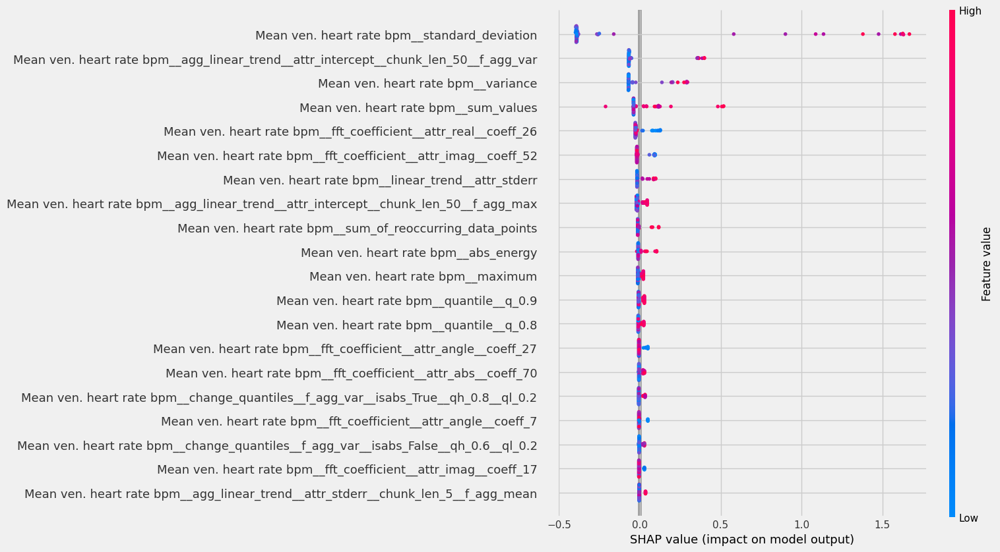

In [359]:
# Assuming 'X' is your feature data
explainer = shap.TreeExplainer(classifier, feature_perturbation="tree_path_dependent")
shap_values = explainer.shap_values(x_transformed)

# Step 3: Create Bar Chart
shap.summary_plot(shap_values, x_transformed, feature_names=x_transformed.columns, show=False)
plt.savefig(".\GRAPHS\shap_values", 
            bbox_inches = 'tight')
plt.show()

<Figure size 800x1800 with 0 Axes>

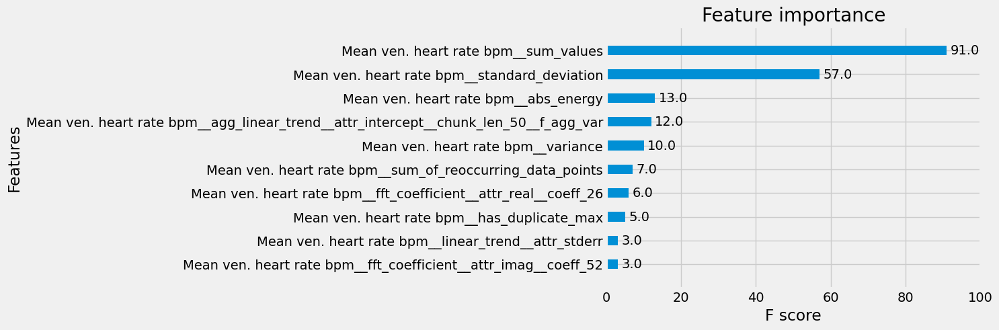

In [360]:
# plot feature importance
plt.figure(figsize=(8, 18))
xgb.plot_importance(classifier, max_num_features=10, height=0.4, importance_type="weight")
plt.savefig(".\\GRAPHS\\ft_importance_weight", 
            bbox_inches = 'tight')
plt.show()

<Figure size 800x1800 with 0 Axes>

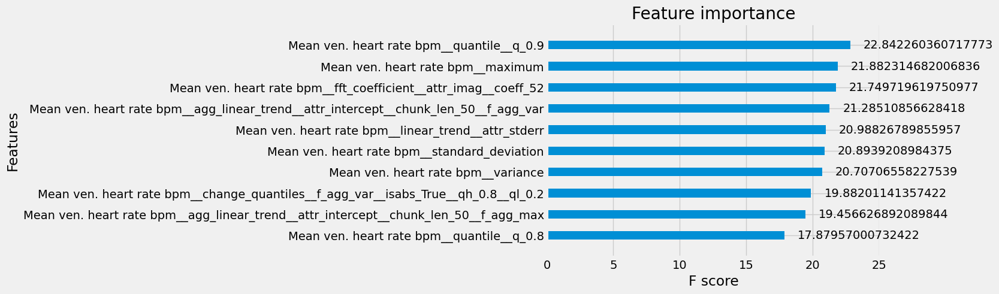

In [361]:
# plot feature importance
plt.figure(figsize=(8, 18))
xgb.plot_importance(classifier, max_num_features=10, height=0.4, importance_type="gain")
plt.savefig(".\\GRAPHS\\ft_importance_gain", 
            bbox_inches = 'tight')
plt.show()

In [362]:
help(xgb.plot_importance)

Help on function plot_importance in module xgboost.plotting:

plot_importance(booster: xgboost.core.Booster, ax: Optional[Any] = None, height: float = 0.2, xlim: Optional[tuple] = None, ylim: Optional[tuple] = None, title: str = 'Feature importance', xlabel: str = 'F score', ylabel: str = 'Features', fmap: Union[str, os.PathLike] = '', importance_type: str = 'weight', max_num_features: Optional[int] = None, grid: bool = True, show_values: bool = True, **kwargs: Any) -> Any
    Plot importance based on fitted trees.
    
    Parameters
    ----------
    booster : Booster, XGBModel or dict
        Booster or XGBModel instance, or dict taken by Booster.get_fscore()
    ax : matplotlib Axes, default None
        Target axes instance. If None, new figure and axes will be created.
    grid : bool, Turn the axes grids on or off.  Default is True (On).
    importance_type : str, default "weight"
        How the importance is calculated: either "weight", "gain", or "cover"
    
        * "weig

# 4.0.0.0: Post-analysis graphing

## 4.1.0.0: Setup

In [363]:
# Verify pace_data remains unchanged
print(f'Length of list {len(pace_data)}')
print(f'Number of controls {len(pace_data[0])}')
print(f'Number of controls {len(pace_data[1])}')
print(f'Number of days in series is {len(pace_data[1][2])}')

Length of list 2
Number of controls 48
Number of controls 12
Number of days in series is 158


## 4.2.0.0: Graphing the daily mean ventricular heart rate

Our analysis has shown that the standard deviation and the sum of the entire time series values (which is equivalent to the mean since all of our time series analysed are of an equal length) of Mean ven. heart rate [bpm] are the two most important features of XGBoost's Random Forest. To gain a greater understanding of how the cases and controls differ in their Mean ven. heart rate [bpm] in the time series, I will plot the median and interquartile range of the Mean ven. heart rate [bpm] across both the cases and controls for each day in the time series and superimpose them onto each other. This will highlight how the cases and controls are different in these two aspects of Mean ven. heart rate [bpm], and will also answer the question as to whether these differences change over time or are constant.

### 4.2.1.0: Obtaining the median and quartile values for the controls

In [364]:
# Initialise DataFrame
mean_ven_hr_controls = pd.DataFrame()

In [365]:
# Get values from controls
for index, df in enumerate(pace_data[0]):
    mean_ven_hr_controls[index] = df["Mean ven. heart rate [bpm]"]

In [366]:
mean_ven_hr_controls["Median"] = mean_ven_hr_controls.median(axis=1)
mean_ven_hr_controls["Lower Quartile"] = mean_ven_hr_controls.apply(lambda row: np.percentile(row, 25), axis=1)
mean_ven_hr_controls["Upper Quartile"] = mean_ven_hr_controls.apply(lambda row: np.percentile(row, 75), axis=1)

In [367]:
# Validate DataFrame
mean_ven_hr_controls.head(5)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,Median,Lower Quartile,Upper Quartile
Day of transmission,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,66.0,80.0,84.0,60.0,57.0,77.0,70.0,63.0,62.0,60.0,79.000000,66.0,57.0,67.0,56.0,63.0,82.0,69.0,77.0,78.0,67.0,71.0,88.0,70.0,65.0,74.0,63.0,72.0,91.0,72.0,74.0,63.0,57.0,67.0,81.0,83.0,57.0,59.0,58.0,70.0,62.0,61.0,68.0,64.0,58.0,68.0,66.0,73.0,67.0,62.0,73.75
1,65.0,77.0,90.0,60.0,56.0,76.5,69.0,64.0,60.0,58.0,79.000000,62.0,56.0,70.0,57.0,64.0,80.0,68.0,76.0,78.0,68.0,66.0,88.5,70.0,66.0,73.0,65.0,73.0,84.0,64.0,72.0,63.0,57.0,65.0,85.0,84.0,58.0,58.0,58.0,70.0,63.0,58.0,67.0,65.0,53.0,71.0,66.0,79.0,66.0,62.0,73.00
2,67.0,83.0,92.0,59.0,57.0,76.0,73.0,64.0,59.0,58.0,80.000000,66.0,55.0,73.0,57.0,70.0,83.0,76.0,78.0,86.0,65.0,63.0,89.0,74.0,66.0,74.0,66.0,70.0,87.0,71.0,71.0,63.0,57.0,65.0,80.0,84.0,56.0,57.0,60.0,70.0,65.0,58.0,66.0,64.0,57.0,70.0,71.0,74.0,68.5,63.0,74.00
3,68.0,81.0,94.0,60.0,56.0,75.5,74.0,61.0,63.0,55.0,77.000000,64.0,57.0,70.0,59.0,68.0,84.0,66.0,77.0,87.0,71.0,66.0,86.0,71.0,65.5,74.0,65.0,68.0,87.0,62.0,74.0,63.0,56.0,66.0,79.0,79.0,56.0,56.0,60.0,68.0,61.0,58.0,68.0,63.0,56.0,68.0,68.0,72.0,68.0,61.0,74.00
4,65.0,82.0,90.5,62.0,57.0,75.0,71.0,65.0,59.0,56.0,77.666667,60.0,57.0,70.0,57.0,72.0,83.0,66.0,81.0,86.0,67.0,65.0,89.0,69.0,65.0,75.0,64.0,65.0,84.0,67.0,75.0,64.0,57.0,63.0,79.0,84.0,56.0,61.0,58.0,72.0,63.0,60.0,67.0,64.0,57.0,72.0,67.0,78.0,66.5,62.0,75.00


### 4.2.2.0: Obtaining the median and quartile values for the cases

In [368]:
# Initialise DataFrame 
mean_ven_hr_cases = pd.DataFrame()

In [369]:
# Get values from cases
for index, df in enumerate(pace_data[1]):
    mean_ven_hr_cases[index] = df["Mean ven. heart rate [bpm]"]

In [370]:
mean_ven_hr_cases["Median"] = mean_ven_hr_cases.median(axis=1)
mean_ven_hr_cases["Lower Quartile"] = mean_ven_hr_cases.apply(lambda row: np.percentile(row, 25), axis=1)
mean_ven_hr_cases["Upper Quartile"] = mean_ven_hr_cases.apply(lambda row: np.percentile(row, 75), axis=1)

In [371]:
# Validate DataFrame
mean_ven_hr_cases.head(5)

,0,1,2,3,4,5,6,7,8,9,10,11,Median,Lower Quartile,Upper Quartile
Day of transmission,,,,,,,,,,,,,,,
0,79.0,62.0,81.0,68.0,77.0,113.0,83.0,83.0,77.0,81.0,84.0,87.0,81.0,77.0,83.00
1,82.0,62.0,77.0,90.0,80.0,108.0,86.0,86.0,85.0,83.0,81.0,83.0,83.0,81.0,85.75
2,75.0,61.0,75.0,80.0,79.0,100.0,83.0,83.0,80.0,78.0,69.0,82.0,79.5,75.0,81.50
3,78.0,61.0,74.0,72.0,74.0,88.0,83.0,81.0,89.0,81.0,83.0,86.0,81.0,74.0,83.00
4,78.0,62.0,83.0,88.0,77.0,90.0,83.0,83.0,79.0,85.0,78.0,88.0,83.0,78.0,84.50


### 4.2.3.0: Producing the graph

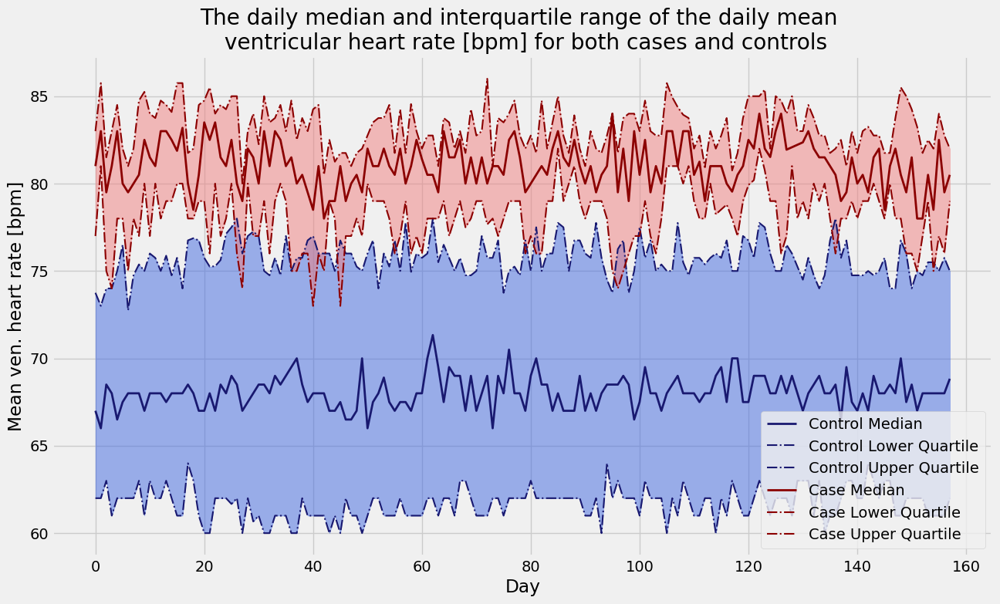

In [372]:
# Create a line plot with shaded area
plt.figure(figsize=(14, 8))

# Controls
# Plot the median, lower quartile, and upper quartile
plt.plot(mean_ven_hr_controls.index, mean_ven_hr_controls['Median'], label='Control Median', linewidth=2, color='midnightblue')
plt.plot(mean_ven_hr_controls.index, mean_ven_hr_controls['Lower Quartile'], label='Control Lower Quartile', linestyle='-.', linewidth=1.5, color='midnightblue')
plt.plot(mean_ven_hr_controls.index, mean_ven_hr_controls['Upper Quartile'], label='Control Upper Quartile', linestyle='-.', linewidth=1.5, color='midnightblue')

# Shade the area between lower quartile and upper quartile
plt.fill_between(mean_ven_hr_controls.index, mean_ven_hr_controls['Lower Quartile'], mean_ven_hr_controls['Upper Quartile'], color='royalblue', alpha=0.5)

# Cases
# Plot the median, lower quartile, and upper quartile
plt.plot(mean_ven_hr_cases.index, mean_ven_hr_cases['Median'], label='Case Median', linewidth=2, color='darkred')
plt.plot(mean_ven_hr_cases.index, mean_ven_hr_cases['Lower Quartile'], label='Case Lower Quartile', linestyle='-.', linewidth=1.5, color='darkred')
plt.plot(mean_ven_hr_cases.index, mean_ven_hr_cases['Upper Quartile'], label='Case Upper Quartile', linestyle='-.', linewidth=1.5, color='darkred')

# Shade the area between lower quartile and upper quartile
plt.fill_between(mean_ven_hr_cases.index, mean_ven_hr_cases['Lower Quartile'], mean_ven_hr_cases['Upper Quartile'], color='lightcoral', alpha=0.5)

# Label axes
plt.xlabel('Day')
plt.ylabel('Mean ven. heart rate [bpm]')
# Add title
plt.title('The daily median and interquartile range of the daily mean \n ventricular heart rate [bpm] for both cases and controls')
plt.legend()
# Save figure
plt.savefig(".\\GRAPHS\\case_v_control_vhr.png", 
            bbox_inches = 'tight')
plt.show()

## 4.3.0.0: Graphing the daily mean atrial and ventricular heart rate

In the analysis, it was noted that the Mean ven. heart rate [bpm] was not the same as the Mean atrial heart rate [bpm]. I hypothesise that this is due to atrial fibrillation events rather than the pacing of the ventricles from the pacemakers. To prove this, I will replace days where a patient had a mean atrial heart rate above 100 bpm with missing values for both the atrial and ventricular mean heart rate for that day (for only that patient) and then plot the median and IQR of the Mean ven. heart rate [bpm] and the median and IQR of the Mean atrial heart rate [bpm] across the entire data set (cases and controls combined) superimposed. If my hypothesis is true, there should be no difference between the two lines.

### 4.3.1.0: Obtaining the median and quartile values

In [373]:
# Initialise DataFrames 
mean_atrial_hr = pd.DataFrame()
mean_ven_hr = pd.DataFrame()

In [374]:
# Initialise index
index = 0
# Get values
for list_of_df in pace_data:
    for df in list_of_df:
        mean_atrial_hr[index] = df["Mean atrial heart rate [bpm]"]
        mean_ven_hr[index] = df["Mean ven. heart rate [bpm]"]
        index += 1

In [375]:
# Convert values greater than 100 to missing values (NaN) in mean_atrial_hr
mean_atrial_hr = mean_atrial_hr.applymap(lambda x: np.nan if x > 100 else x)

In [376]:
# Convert corresponding cells in mean_ven_hr to missing values (NaN)
mean_ven_hr = mean_ven_hr.where(mean_atrial_hr.notna(), np.nan)

In [377]:
# Calculate median, lower quartile, and upper quartile for mean_atrial_hr
mean_atrial_hr["Median"] = mean_atrial_hr.median(axis=1)
mean_atrial_hr["Lower Quartile"] = mean_atrial_hr.apply(lambda row: np.percentile(row.dropna(), 25) if not row.dropna().empty else np.nan, axis=1)
mean_atrial_hr["Upper Quartile"] = mean_atrial_hr.apply(lambda row: np.percentile(row.dropna(), 75) if not row.dropna().empty else np.nan, axis=1)

# Calculate median, lower quartile, and upper quartile for mean_ven_hr
mean_ven_hr["Median"] = mean_ven_hr.median(axis=1)
mean_ven_hr["Lower Quartile"] = mean_ven_hr.apply(lambda row: np.percentile(row.dropna(), 25) if not row.dropna().empty else np.nan, axis=1)
mean_ven_hr["Upper Quartile"] = mean_ven_hr.apply(lambda row: np.percentile(row.dropna(), 75) if not row.dropna().empty else np.nan, axis=1)

In [378]:
# Validate DataFrame
mean_atrial_hr

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,Median,Lower Quartile,Upper Quartile
Day of transmission,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,66.000000,80.000000,NaN,60.00,NaN,77.00,70.0,63.0,62.000000,60.0,80.000000,66.0,57.0,66.000000,56.0,63.00,82.00,70.000000,76.000000,84.0,67.000000,72.0,88.000000,69.0,67.0,NaN,63.0,73.0,96.0,72.0,NaN,63.0,57.0,69.000000,82.0,83.000000,57.0,59.000000,58.0,70.000000,NaN,61.0,68.0,NaN,58.000000,69.000000,66.0,73.00,80.000000,62.0,80.0,NaN,77.000000,NaN,80.0,82.000000,76.000000,81.00,86.0,87.0,69.500000,63.00,80.000000
1,65.000000,77.000000,NaN,60.00,NaN,76.75,69.0,64.0,60.000000,58.0,83.000000,62.0,57.0,69.000000,57.0,64.00,80.00,68.000000,76.000000,81.0,67.000000,66.0,89.000000,70.0,71.0,NaN,65.0,73.0,NaN,64.0,NaN,63.0,57.0,66.000000,90.0,84.000000,58.0,58.000000,58.0,70.000000,NaN,58.0,67.0,NaN,53.000000,71.000000,66.0,79.00,85.000000,62.0,77.0,97.0,80.000000,NaN,83.0,85.000000,84.000000,83.00,NaN,83.0,69.000000,62.75,80.000000
2,67.000000,83.000000,NaN,59.00,NaN,76.50,73.0,64.0,59.000000,58.0,82.000000,66.0,55.0,71.000000,57.0,69.00,83.00,79.000000,77.000000,90.0,64.000000,62.0,90.000000,74.0,69.0,NaN,66.0,70.0,NaN,71.0,NaN,63.0,58.0,66.000000,82.0,84.000000,56.0,57.000000,60.0,70.000000,NaN,58.0,66.0,NaN,57.000000,70.000000,70.0,74.00,76.000000,61.0,75.0,NaN,79.000000,NaN,79.0,84.000000,79.000000,78.00,NaN,82.0,70.000000,62.50,78.250000
3,68.000000,81.000000,NaN,60.00,NaN,76.25,75.0,61.0,63.000000,55.0,78.000000,63.0,57.0,69.000000,59.0,67.00,84.00,67.000000,77.000000,93.0,70.000000,66.0,87.000000,71.0,69.0,NaN,65.0,68.0,NaN,62.0,NaN,63.0,56.0,67.000000,81.0,79.000000,56.0,56.000000,61.0,68.000000,NaN,58.0,68.0,NaN,56.000000,68.000000,68.0,72.00,78.000000,61.0,74.0,NaN,74.000000,NaN,78.0,82.000000,88.000000,81.00,85.0,86.0,68.000000,62.75,78.000000
4,65.000000,82.000000,NaN,62.00,NaN,76.00,71.0,65.0,59.000000,56.0,79.333333,60.0,57.0,69.000000,57.0,71.00,83.00,66.000000,80.000000,93.0,66.000000,65.0,89.000000,69.0,69.0,NaN,64.0,65.0,100.0,67.0,NaN,64.0,57.0,64.000000,80.0,85.000000,56.0,75.000000,58.0,72.000000,NaN,60.0,67.0,NaN,57.000000,72.000000,67.0,79.00,78.000000,62.0,83.0,88.0,77.000000,NaN,77.0,85.000000,78.000000,85.00,NaN,88.0,69.000000,64.00,79.250000
5,68.000000,80.000000,NaN,60.00,NaN,77.00,73.0,65.0,60.000000,56.0,80.666667,61.0,57.0,69.000000,59.0,71.00,79.00,65.000000,78.000000,95.0,66.000000,70.0,88.000000,65.0,69.0,NaN,67.0,68.0,NaN,64.0,NaN,64.0,57.0,72.000000,85.0,83.000000,54.0,61.000000,66.0,70.000000,NaN,61.0,73.0,NaN,53.000000,78.000000,67.0,79.00,79.000000,80.0,81.0,NaN,75.000000,NaN,81.0,90.000000,75.000000,78.00,90.0,81.0,70.000000,64.75,79.000000
6,66.000000,83.000000,NaN,58.00,NaN,76.00,73.0,66.0,62.000000,66.0,82.000000,60.0,57.0,69.000000,58.0,71.00,72.00,63.000000,76.000000,88.0,69.000000,64.0,90.000000,68.0,64.0,NaN,63.0,70.0,89.0,69.0,NaN,64.0,56.0,70.000000,85.0,83.000000,56.0,55.000000,62.0,71.666667,NaN,61.0,71.0,NaN,54.000000,72.000000,66.0,77.00,81.000000,97.0,76.0,NaN,74.000000,NaN,78.0,89.866667,73.000000,80.00,NaN,83.0,70.000000,63.75,77.000000
7,68.000000,81.000000,NaN,59.00,NaN,79.00,71.0,64.0,60.000000,64.0,82.000000,62.0,61.0,69.000000,58.0,61.00,79.00,73.000000,77.000000,91.0,67.000000,67.0,90.000000,72.0,66.0,NaN,64.0,69.0,92.0,69.0,NaN,64.0,57.0,66.000000,85.0,81.000000,56.0,56.000000,67.0,73.333333,NaN,61.0,69.0,NaN,55.000000,73.000000,67.0,80.00,83.000000,94.0,80.0,92.0,72.000000,NaN,77.0,89.733333,77.000000,76.00,87.0,80.0,71.000000,64.00,80.000000
8,67.666667,77.000000,NaN,59.00,NaN,75.50,72.0,64.0,58.000000,63.0,80.000000,66.0,62.0,70.000000,59.0,63.00,76.00,71.000000,79.000000,90.0,68.000000,66.0,91.000000,74.0,69.0,NaN,63.0,67.0,94.0,71.0,NaN,63.0,57.0,64.000000,80.0,88.000000,56.0,57.000000,72.0,75.000000,NaN,61.0,69.0,NaN,56.000000,73.000000,67.0,80.00,81.000000,69.0,84.0,NaN,72.00

In [379]:
# Validate DataFrame
mean_ven_hr.head(5)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,Median,Lower Quartile,Upper Quartile
Day of transmission,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,66.0,80.0,NaN,60.0,NaN,77.0,70.0,63.0,62.0,60.0,79.000000,66.0,57.0,67.0,56.0,63.0,82.0,69.0,77.0,78.0,67.0,71.0,88.0,70.0,65.0,NaN,63.0,72.0,91.0,72.0,NaN,63.0,57.0,67.0,81.0,83.0,57.0,59.0,58.0,70.0,NaN,61.0,68.0,NaN,58.0,68.0,66.0,73.0,79.0,62.0,81.0,NaN,77.0,NaN,83.0,83.0,77.0,81.0,84.0,87.0,69.5,63.00,78.75
1,65.0,77.0,NaN,60.0,NaN,76.5,69.0,64.0,60.0,58.0,79.000000,62.0,56.0,70.0,57.0,64.0,80.0,68.0,76.0,78.0,68.0,66.0,88.5,70.0,66.0,NaN,65.0,73.0,NaN,64.0,NaN,63.0,57.0,65.0,85.0,84.0,58.0,58.0,58.0,70.0,NaN,58.0,67.0,NaN,53.0,71.0,66.0,79.0,82.0,62.0,77.0,90.0,80.0,NaN,86.0,86.0,85.0,83.0,NaN,83.0,68.0,62.75,79.00
2,67.0,83.0,NaN,59.0,NaN,76.0,73.0,64.0,59.0,58.0,80.000000,66.0,55.0,73.0,57.0,70.0,83.0,76.0,78.0,86.0,65.0,63.0,89.0,74.0,66.0,NaN,66.0,70.0,NaN,71.0,NaN,63.0,57.0,65.0,80.0,84.0,56.0,57.0,60.0,70.0,NaN,58.0,66.0,NaN,57.0,70.0,71.0,74.0,75.0,61.0,75.0,NaN,79.0,NaN,83.0,83.0,80.0,78.0,NaN,82.0,70.0,63.00,78.00
3,68.0,81.0,NaN,60.0,NaN,75.5,74.0,61.0,63.0,55.0,77.000000,64.0,57.0,70.0,59.0,68.0,84.0,66.0,77.0,87.0,71.0,66.0,86.0,71.0,65.5,NaN,65.0,68.0,NaN,62.0,NaN,63.0,56.0,66.0,79.0,79.0,56.0,56.0,60.0,68.0,NaN,58.0,68.0,NaN,56.0,68.0,68.0,72.0,78.0,61.0,74.0,NaN,74.0,NaN,83.0,81.0,89.0,81.0,83.0,86.0,68.0,62.75,77.00
4,65.0,82.0,NaN,62.0,NaN,75.0,71.0,65.0,59.0,56.0,77.666667,60.0,57.0,70.0,57.0,72.0,83.0,66.0,81.0,86.0,67.0,65.0,89.0,69.0,65.0,NaN,64.0,65.0,84.0,67.0,NaN,64.0,57.0,63.0,79.0,84.0,56.0,61.0,58.0,72.0,NaN,60.0,67.0,NaN,57.0,72.0,67.0,78.0,78.0,62.0,83.0,88.0,77.0,NaN,83.0,83.0,79.0,85.0,NaN,88.0,68.0,63.00,79.00


### 4.3.2.0: Producing the graph

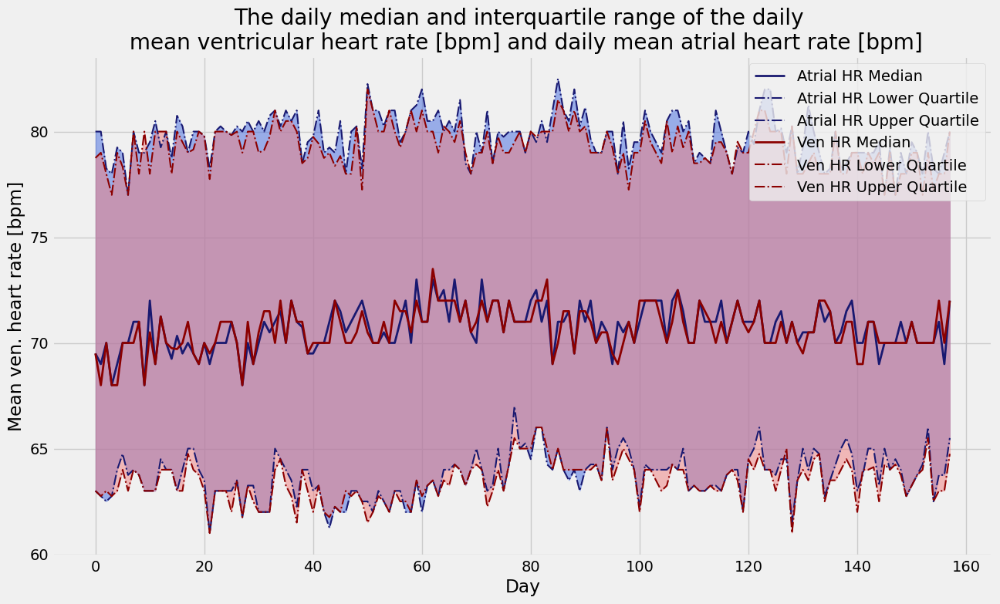

In [380]:
# Create a line plot with shaded area
plt.figure(figsize=(14, 8))

# Atrial hr
# Plot the median, lower quartile, and upper quartile
plt.plot(mean_atrial_hr.index, mean_atrial_hr['Median'], label='Atrial HR Median', linewidth=2, color='midnightblue')
plt.plot(mean_atrial_hr.index, mean_atrial_hr['Lower Quartile'], label='Atrial HR Lower Quartile', linestyle='-.', linewidth=1.5, color='midnightblue')
plt.plot(mean_atrial_hr.index, mean_atrial_hr['Upper Quartile'], label='Atrial HR Upper Quartile', linestyle='-.', linewidth=1.5, color='midnightblue')

# Shade the area between lower quartile and upper quartile
plt.fill_between(mean_atrial_hr.index, mean_atrial_hr['Lower Quartile'], mean_atrial_hr['Upper Quartile'], color='royalblue', alpha=0.5)

# Ventricular hr
# Plot the median, lower quartile, and upper quartile
plt.plot(mean_ven_hr.index, mean_ven_hr['Median'], label='Ven HR Median', linewidth=2, color='darkred')
plt.plot(mean_ven_hr.index, mean_ven_hr['Lower Quartile'], label='Ven HR Lower Quartile', linestyle='-.', linewidth=1.5, color='darkred')
plt.plot(mean_ven_hr.index, mean_ven_hr['Upper Quartile'], label='Ven HR Upper Quartile', linestyle='-.', linewidth=1.5, color='darkred')

# Shade the area between lower quartile and upper quartile
plt.fill_between(mean_ven_hr.index, mean_ven_hr['Lower Quartile'], mean_ven_hr['Upper Quartile'], color='lightcoral', alpha=0.5)

# Label axes
plt.xlabel('Day')
plt.ylabel('Mean ven. heart rate [bpm]')
# Add title
plt.title('The daily median and interquartile range of the daily \n mean ventricular heart rate [bpm] and daily mean atrial heart rate [bpm]')
plt.legend(loc='upper right')
# Save figure
plt.savefig(".\\GRAPHS\\atrial_v_ven_vhr.png", 
            bbox_inches = 'tight')
plt.show()

## 4.4.0.0: Validation of pacing percentages

To validate that the differences in heart rate between cases and controls are physiological rather than device related, I will perform a two-tailed t-test on mean Atrial pacing (Ap) [%], mean Ven. pacing (RVp) [%], and mean Basic rate [bpm] across the 5-month period looked at.

### 4.4.1.0: Reading in the data

Unfortunately I had previously excluded the Basic rate [bpm], so I will have to re-read in the data and re-process the data.

In [381]:
# Create a list to store pacemaker data. 
pace_data = []

In [382]:
# Read in controls
list_of_df = [] # temp list

# Controls
for id_num in range(14, 65):
        # Get file path
        file_path = controls_path + str(id_num) + '.csv'
        # Read in patient timeseries as a pandas DataFrame
        temp_df = pd.read_csv(file_path, header=0)
        # Append DataFrame to list
        list_of_df.append(temp_df)
        
# Append list of DataFrames to pace_data list
pace_data.append(list_of_df)

In [383]:
# Read in cases
list_of_df = [] # temp list
        
# Cases
for id_num in range(1,14):
    # Get file path
    file_path = cases_path + str(id_num) + '.csv'
    # Read in patient timeseries as a pandas DataFrame
    temp_df = pd.read_csv(file_path, header=0)
    # Append DataFrame to list
    list_of_df.append(temp_df)
        
# Append list of DataFrames to pace_data list
pace_data.append(list_of_df)

In [384]:
print(f'Number of controls: {len(pace_data[0])}')
print(f'Number of cases: {len(pace_data[1])}')

Number of controls: 51
Number of cases: 13


### 4.4.2.0: Creating index

In [385]:
# To avoid error raised with .astype
pd.set_option('mode.chained_assignment', None)

In [386]:
# Loop through read in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        # Minus min of column from each row
        pace_data[i][x].loc[:, 'Last transmission received on (days)'] = pace_data[i][x]['Last transmission received on (days)'] - min(pace_data[i][x]['Last transmission received on (days)'])
        # Round each row
        pace_data[i][x].loc[:, 'Last transmission received on (days)'] = round(pace_data[i][x]['Last transmission received on (days)'])   
        # Convert float to int
        pace_data[i][x]['Last transmission received on (days)'] = pace_data[i][x]['Last transmission received on (days)'].astype(int)
        # Remove duplicate days
        pace_data[i][x] = pace_data[i][x].drop_duplicates(subset='Last transmission received on (days)', keep=False)
        # Add missing days
        if (max(pace_data[i][x]['Last transmission received on (days)']) + 1) > len(pace_data[i][x]):
            # Find missing days to be added
            missing_days = [day for day in range(0, max(pace_data[i][x]['Last transmission received on (days)']) + 1) if day not in pace_data[i][x]['Last transmission received on (days)'].values]
            # Create a DataFrame of length missing_days with column names, populated by missing values
            missing_rows = pd.DataFrame(np.nan, index=range(len(missing_days)), columns=pace_data[i][x].columns)
            # Assign data to the desired column
            missing_rows['Last transmission received on (days)'] = missing_days
            # Concatenate the new rows with the existing DataFrame
            pace_data[i][x] = pd.concat([pace_data[i][x], missing_rows], ignore_index=True)
        else:
            pass
        # Sort DataFrame by last transmission
        pace_data[i][x] = pace_data[i][x].sort_values('Last transmission received on (days)')
        # Rename column to "Day of transmission"
        pace_data[i][x] = pace_data[i][x].rename(columns={'Last transmission received on (days)': 'Day of transmission'})
        # Set 'day of transmission' as the index
        pace_data[i][x] = pace_data[i][x].set_index('Day of transmission')



In [387]:
pd.set_option('mode.chained_assignment', 'warn')

### 4.4.3.0: Patient exclusion

In [388]:
# Define columns we need to keep 
important_cols = ['Atrial pacing (Ap) [%]', 'Patient activity [% of day]', 'PP variability [ms]']

In [389]:
threshold = 0.4

In [390]:
# Remove DataFrames missing important columns
for i, list_of_df in enumerate(pace_data):
    pace_data[i] = [df for df in list_of_df if all(df[col].isnull().mean() <= threshold for col in important_cols)]
    print(len(list_of_df))
    print(len(pace_data[i]))

51
48
13
12


### 4.4.4.0: Time series padding

In [391]:
len(pace_data[0][5])

343

In [392]:
temp_list = []

In [393]:
# Loop through read in dfs
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        # text
        temp_list.append(len(df))

In [394]:
print(min(temp_list))

158


In [395]:
for i, list_of_df in enumerate(pace_data):
    for x, df in enumerate(list_of_df):
        # Shorten each df to minimum length
        pace_data[i][x] = pace_data[i][x].iloc[:min(temp_list)]

### 4.4.5.0: Getting p-values

#### 4.4.5.1: Getting statistics

##### Defining columns

In [396]:
relevant_columns = ["Atrial pacing (Ap) [%]",
                   "Ven. pacing (RVp) [%]",
                   "Basic rate [bpm]"]

##### Control statistics

In [397]:
controls_stats = {
    "controls_mean": {},
    "controls_std": {}
}

In [398]:
# Get list of mean and std of each time series for each column
for df in pace_data[0]:
    for col in relevant_columns:
        # Initialise lists for each column
        if col not in controls_stats["controls_mean"]:
            controls_stats["controls_mean"][col] = []
            controls_stats["controls_std"][col] = []
        # Append col mean for df
        controls_stats["controls_mean"][col].append(df[col].mean())
        # Append col std for df
        controls_stats["controls_std"][col].append(df[col].std())

##### Case statistics

In [399]:
cases_stats = {
    "cases_mean": {},
    "cases_std": {}
}

In [400]:
# Get list of mean and std of each time series for each column
for df in pace_data[1]:
    for col in relevant_columns:
        # Initialise lists for each column
        if col not in cases_stats["cases_mean"]:
            cases_stats["cases_mean"][col] = []
            cases_stats["cases_std"][col] = []
        # Append col mean for df
        cases_stats["cases_mean"][col].append(df[col].mean())
        # Append col std for df
        cases_stats["cases_std"][col].append(df[col].std())

#### 4.4.5.2: Creating tables

##### Table of means of time series 

In [401]:
table_mean = {}

In [402]:
table_mean["control_mean_mean"] = {
        "Atrial pacing (Ap) [%]": np.mean(controls_stats['controls_mean']['Atrial pacing (Ap) [%]']),
        "Ven. pacing (RVp) [%]": np.mean(controls_stats['controls_mean']['Ven. pacing (RVp) [%]']),
        "Basic rate [bpm]": np.mean(controls_stats['controls_mean']['Basic rate [bpm]']),
}

In [403]:
table_mean["control_mean_std"] = {
        "Atrial pacing (Ap) [%]": np.std(controls_stats['controls_mean']['Atrial pacing (Ap) [%]'], ddof=1),
        "Ven. pacing (RVp) [%]": np.std(controls_stats['controls_mean']['Ven. pacing (RVp) [%]'], ddof=1),
        "Basic rate [bpm]": np.std(controls_stats['controls_mean']['Basic rate [bpm]'], ddof=1),
}

In [404]:
table_mean["cases_mean_mean"] = {
    "Atrial pacing (Ap) [%]": np.mean(cases_stats['cases_mean']['Atrial pacing (Ap) [%]']),
    "Ven. pacing (RVp) [%]": np.mean(cases_stats['cases_mean']['Ven. pacing (RVp) [%]']),
    "Basic rate [bpm]": np.mean(cases_stats['cases_mean']['Basic rate [bpm]']),
}

In [405]:
table_mean["cases_mean_std"] = {
    "Atrial pacing (Ap) [%]": np.std(cases_stats['cases_mean']['Atrial pacing (Ap) [%]'], ddof=1),
    "Ven. pacing (RVp) [%]": np.std(cases_stats['cases_mean']['Ven. pacing (RVp) [%]'], ddof=1),
    "Basic rate [bpm]": np.std(cases_stats['cases_mean']['Basic rate [bpm]'], ddof=1),
}

In [406]:
table_mean["p_values_mean"] = {
    "Atrial pacing (Ap) [%]": stats.ttest_ind(controls_stats['controls_mean']['Atrial pacing (Ap) [%]'],
                                              cases_stats['cases_mean']['Atrial pacing (Ap) [%]'])[1],
    "Ven. pacing (RVp) [%]": stats.ttest_ind(controls_stats['controls_mean']['Ven. pacing (RVp) [%]'],
                                             cases_stats['cases_mean']['Ven. pacing (RVp) [%]'])[1],
    "Basic rate [bpm]": stats.ttest_ind(controls_stats['controls_mean']['Basic rate [bpm]'],
                                        cases_stats['cases_mean']['Basic rate [bpm]'])[1],
}

In [407]:
table_mean = pd.DataFrame(table_mean)

In [408]:
table_mean

,control_mean_mean,control_mean_std,cases_mean_mean,cases_mean_std,p_values_mean
Atrial pacing (Ap) [%],18.125258,22.162347,8.010693,15.676215,0.142634
Ven. pacing (RVp) [%],84.963485,23.826631,80.982375,28.811095,0.621488
Basic rate [bpm],52.883621,4.662341,52.500000,4.522670,0.798568


In [409]:
# Write to an excel file
table_mean.to_excel(".\\EXCEL_FILES\\table_mean.xlsx", index=True)

##### Table of standard deviations of time series 

In [410]:
table_std = {}

In [411]:
table_std["control_mean_std"] = {
    "Atrial pacing (Ap) [%]": np.mean(controls_stats['controls_std']['Atrial pacing (Ap) [%]']),
    "Ven. pacing (RVp) [%]": np.mean(controls_stats['controls_std']['Ven. pacing (RVp) [%]']),
    "Basic rate [bpm]": np.mean(controls_stats['controls_std']['Basic rate [bpm]']),
}

In [412]:
table_std["control_std_std"] = {
    "Atrial pacing (Ap) [%]": np.std(controls_stats['controls_std']['Atrial pacing (Ap) [%]'], ddof=1),
    "Ven. pacing (RVp) [%]": np.std(controls_stats['controls_std']['Ven. pacing (RVp) [%]'], ddof=1),
    "Basic rate [bpm]": np.std(controls_stats['controls_std']['Basic rate [bpm]'], ddof=1),
}

In [413]:
table_std["cases_mean_std"] = {
    "Atrial pacing (Ap) [%]": np.mean(cases_stats['cases_std']['Atrial pacing (Ap) [%]']),
    "Ven. pacing (RVp) [%]": np.mean(cases_stats['cases_std']['Ven. pacing (RVp) [%]']),
    "Basic rate [bpm]": np.mean(cases_stats['cases_std']['Basic rate [bpm]']),
}

In [414]:
table_std["cases_std_std"] = {
    "Atrial pacing (Ap) [%]": np.std(cases_stats['cases_std']['Atrial pacing (Ap) [%]'], ddof=1),
    "Ven. pacing (RVp) [%]": np.std(cases_stats['cases_std']['Ven. pacing (RVp) [%]'], ddof=1),
    "Basic rate [bpm]": np.std(cases_stats['cases_std']['Basic rate [bpm]'], ddof=1),
}

In [415]:
table_std["p_values_std"] = {
    "Atrial pacing (Ap) [%]": stats.ttest_ind(controls_stats['controls_std']['Atrial pacing (Ap) [%]'],
                                              cases_stats['cases_std']['Atrial pacing (Ap) [%]'])[1],
    "Ven. pacing (RVp) [%]": stats.ttest_ind(controls_stats['controls_std']['Ven. pacing (RVp) [%]'],
                                             cases_stats['cases_std']['Ven. pacing (RVp) [%]'])[1],
    "Basic rate [bpm]": stats.ttest_ind(controls_stats['controls_std']['Basic rate [bpm]'],
                                        cases_stats['cases_std']['Basic rate [bpm]'])[1],
}

In [416]:
table_std = pd.DataFrame(table_std)

In [417]:
table_std

,control_mean_std,control_std_std,cases_mean_std,cases_std_std,p_values_std
Atrial pacing (Ap) [%],5.210856,4.575629,4.506386,10.099062,0.718492
Ven. pacing (RVp) [%],4.581704,6.067352,6.022717,8.395054,0.499637
Basic rate [bpm],0.111641,0.773473,0.000000,0.000000,0.621209


In [418]:
# Write to an excel file
table_std.to_excel(".\\EXCEL_FILES\\table_std.xlsx", index=True)